# Initialization

In [13]:
# Bunch of imports 
import therpy as tp
import numpy as np

import mpmath
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
%matplotlib inline
import pandas as pd
import scipy.optimize
import scipy.special
import bec1db as bec1db_package
import warnings
from tqdm import tqdm_notebook as tqdm
warnings.filterwarnings("ignore")
import scipy.special
import ipywidgets

cst = tp.cst(sigmaf=0.5, trapw = 2*np.pi*23.35)
bec1db = bec1db_package.Tullia(delta=20)



# Bunch of functions 
def linearfitfun(x,m,b): 
    return m*x + b

def lorentian_fitfun(f, f0, gamma, amp=1, offset=0):
    return amp * (gamma/2)**2 / ((f-f0)**2 + (gamma/2)**2) + offset

def gaussian(x, x0, sigma, amp, offset=0): return offset + amp*np.exp(- (x-x0)**2 / (2*sigma**2))

def bin_data(xi, yi):
    x = np.unique(xi)
    y = [None] * x.size
    for i in range(x.size): y[i] = yi[xi == x[i]]
    # Return 
    y_mean = np.array([a.mean() for a in y])
    y_err = np.array([np.std(a) / (a.size**0.5) for a in y])
    return (x, y_mean, y_err, y, xi, yi)

def compute_moment(nz, zlim=550):
    using = (nz.x >= -zlim*1e-6) & (nz.x <= zlim*1e-6)
    nz = tp.Curve(nz.x[using], nz.y[using])
    return np.trapz(nz.y*nz.x**2, nz.x) / np.trapz(nz.y, nz.x)

def compute_moment_v2(nz, cutoff, plot=False, ax = None):
    # Compute moment vs cutoffs
    zlims = np.linspace(cutoff[0], cutoff[2], 100)
    moment = np.array([abs(compute_moment(nz, zlim=z)) for z in zlims])**0.5 * 1e6
    c_ = tp.Curve(zlims, moment)
    c_.removenan()
    
    # Fit
    sigma = c_.x**2/cutoff[1]**2
    sigma[c_.x <= cutoff[1]] = 1
    fr1 = scipy.optimize.curve_fit(fitfun_erf, c_.x, c_.y, p0=[55, 0, 50])[0]
    fr2 = scipy.optimize.curve_fit(fitfun_erf, c_.x, c_.y, p0=fr1, sigma=sigma)[0]
    
    # plot
    if plot:
        if ax is None: ax = plt.subplots()[1]
        ax.plot(*c_.data)
        ax.plot(c_.x, fitfun_erf(c_.x, *fr1), '-.', label='w/o')
        ax.plot(c_.x, fitfun_erf(c_.x, *fr2), label='w/')
        ax.plot(c_.x, 1/sigma * np.mean([fr1[0], fr2[0]]), 'k--', alpha=0.2, label='weight')
        ax.set(ylim=[c_.y.mean() * 0.6, c_.maxy*1.1])
        ax.legend(loc=2)
    
    # return
    return (fr2[0]*1e-6)**2

# returns rabi in kHz
@np.vectorize
def volt2rabi(volt):
    if volt < 0.1 or volt > 5:
        return 0
    volt = np.log10(volt)
    dbm = 1.5863 +0.2211*volt -0.1022*volt**2 -0.1301*volt**3 -0.0862*volt**4 +0.2323*volt**5 +0.1624*volt**6 -0.1552*volt**7 -0.1206*volt**8
    dbm = 10**dbm
    sqrtpwr = (10**((dbm-30)/10))**(1/2)
    return -0.0332 +0.5832*sqrtpwr -0.0167*sqrtpwr**2

from scipy.optimize import brentq
# Provide rabi in kHz
@np.vectorize
def rabi2volt(rabi):
    if rabi <= volt2rabi(0.1) or rabi >= volt2rabi(5):
        print('outside valid range')
        return 0
    def funSolve(v):
        return rabi - volt2rabi(v)
    return brentq(funSolve, 0.1, 5)
def meshgrid(xLen=10, yLen=10, data=None):
    if data is not None: yLen, xLen = data.shape
    return np.meshgrid(np.arange(xLen, dtype=np.float), np.arange(yLen, dtype=np.float))
def gaussian_2d(x, y, cx=1, cy=1, sx=1, sy=1, amp=1, offset=0, angle=0):
    x, y = x - cx, y - cy
    sx, sy = 2*sx**2, 2*sy**2
    a = angle * np.pi / 180
    xp, yp = x*np.cos(a) + y*np.sin(a), - x*np.sin(a) + y*np.cos(a)
    return offset + amp * np.exp(-xp**2/sx - yp**2/sy)
    
def gaussian_2d_guess(data, x=None, y=None):
    if x is None: x, y = np.meshgrid(np.arange(data.shape[1]), np.arange(data.shape[0]))
    t = np.sum(data)
    cx, cy = np.sum(data * x) / t, np.sum(data * y) / t
    sx, sy = (np.sum(data * (x-cx)**2) / t)**(1/2), (np.sum(data * (y-cy)**2) / t)**(1/2)
    return (cx, cy, sx, sy, data[int(cy), int(cx)], np.mean(data)/5, 0.0)
    
def fit_gaussian_2d(data, guess=None, plot=False):
    if guess is None: guess = gaussian_2d_guess(data)
    fr = tp.optimize.surface_fit(data, fun=gaussian_2d, guess=guess, show=plot)
    return fr
def gaussian_2d_integral(data, nsigma, fr=None, ideal=False, plot=False, guess=None, return_mask=False):
    if fr is None: fr = fit_gaussian_2d(data, guess=guess)
    # Generate the fitted data
    x, y = meshgrid(data=data)
    fit_data = gaussian_2d(x, y, *fr)
    amp = 1 if len(fr) <= 4 else fr[4]
    offset = 0 if len(fr) <= 5 else fr[5]
    # Ideal case
    if ideal:
        return np.sum(fit_data - offset)
    # Data case
    threshhold = np.exp(- nsigma**2/2) * amp + offset
    mask = fit_data >= threshhold
    # Plot
    if plot:
        plt.figure()
        plt.imshow(data)
        fit_data[~mask] = 0
        plt.imshow(mask, alpha=0.2, cmap='gray')
    
    # Mask return
    if return_mask:
        return mask
    
    return np.sum(data[mask])

''' 
Copy image names from clipboard and get parameters 
df : if you want to add on to the older df
init : initialize and return empty df
var : list of strings (variable names) that you want to retrive from database
x_var : a string (variable name), available as df.x
image_func : either tp.Image or tp.Hybrid_Image
using : 0=TopA only, 1=TopB only, 2=All Images
'''
def get_from_clipboard(df=None, init=False, var=None, x_var=None, image_func=tp.Image, using=2, display=False):
    # If initializing, then return empty dataframe
    if init: return pd.DataFrame(columns=['name','image'])
    
    # If df is None, make an empty one
    if df is None: 
        df = pd.DataFrame(columns=['name','image'])
    
    # Get the copied image names
    pasted = pd.read_clipboard(header=None, names=['name'])['name'].tolist()
    
    # Filter for using 0:TopA only, 1:TopB only, 2:all
    if using==0:
        pasted_filtered = [p for p in pasted if p[-1]=='A']
    elif using==1:
        pasted_filtered = [p for p in pasted if p[-1]=='B']
    else:
        pasted_filtered = [p for p in pasted]
    
    # Add it to df if not already in there
    names = df.name.tolist()
    for n in tqdm(pasted_filtered, desc='Loading'):
        if n not in names:
            df.loc[df.shape[0]] = n
            df.image[df.shape[0]-1] = image_func(name=n)
    
    # sort in time
    df.sort_values('name', inplace=True)
    df.reset_index(drop=True, inplace=True)
    
    # Get Parameters
    try: bec1db.refresh()
    except: pass
    df['shot'] = np.linspace(0,df.shape[0]/2-0.5,df.shape[0])
    if x_var is not None:
        df['x'] = bec1db.image_query(df.name.tolist(), [x_var])[x_var]
    if type(var) is str:
        df[var] = bec1db.image_query(df.name.tolist(), [var])[var]
    elif type(var) is list:
        _ = bec1db.image_query(df.name.tolist(), var)
        for n in var:
            df[n] = _[n]
    
    # Print Information
    if display:
        print('Pasted Sample : ', pasted[0:2])  
        print('Newly added images       : {}'.format(df.shape[0]- len(names)))
        print('Total number of images   : {}'.format(df.shape[0]))
        print(df.head(2))
    
    # return
    return df


def get_roi(data, center=[0,0], width=100, height=100):
    center = (data.shape[1]//2 + center[0], data.shape[0]//2 + center[1])
    return tp.imagedata.get_cropi(data, center=center, width=width, height=height)

def atom_num_filter(df_, keep = 0.15, offset = 0.0, plot=True):
    # Prepare
    if plot: fig, ax = plt.subplots(ncols=2, nrows=1, figsize=(12,4))
    if plot: ax[0].plot(df_['shot'], df_['total_atoms']/1e6,'.-', label='All')
    shapes = [df_.shape]
    
    # Filter
    median_numbers = np.median(df_.total_atoms)
    offset += 1
    using = (df_.total_atoms.values > median_numbers*(offset-keep)) & (df_.total_atoms.values <= median_numbers*(offset+keep))
    bad = df_[~using] 
    df_ = df_[using]
    df_.reset_index(inplace=True, drop=True)
    shapes.append(df_.shape)
    if plot: ax[0].plot(bad['shot'], bad['total_atoms']/1e6, 'rx', label='Atom Num Filter')
    if plot: ax[0].axhline(median_numbers/1e6, linestyle='--', color='k', alpha=0.5)

    if plot: 
        # Plot
        median_numbers = np.median(df_.total_atoms)
        ax[1].plot(df_['shot'], df_['total_atoms']/median_numbers,'o-')
        ax[1].axhline(1, linestyle='--', color='k', alpha=0.5)

        ax[0].legend()
        ax[0].set(title = 'Atom number stability', xlabel= 'Shot Number ~ Time', ylabel='Atom Numbers [M]')
        ax[1].set(title = 'Median Atom Num {:.2f} M'.format(median_numbers/1e6), xlabel= 'Shot Number ~ Time', ylabel='Atom Numbers [median]')
        plt.tight_layout()

        # Relevant Information
        print('''
        Total Loaded Images {}
        Atom Num Filter     {}
        Removed Images      {}
        '''.format(shapes[0][0], shapes[1][0], shapes[0][0]-shapes[1][0]))
    
    return using

def erf(x, x0, sigma, amp=1):
    return amp * scipy.special.erf((x-x0)/(2**0.5 * sigma))


# Useful snippets 

default_settings = dict(
   # Image Preparation and Background 
   center_x=1110, center_y=1314, width=800, height=1000, 
   subsample=3, rotate=0, bg_width=20, bg_order=1, bad_light=0,

   # Physical Parameters
   Isat=77, time=10, pixel=0.7e-6, sigmaf=0.5, trap_f=23.35,
   od_method='table', fudge=1, ellipticity=1,
   
   # Hybrid Preparation
   xsec_extension='default', xsec_slice_width=4, 
   xsec_fit_range=1.75, radial_selection=0.5,
   
   # Hybrid Thermometry
   kind='unitary', Tfit_lim=0.1, Tfit_guess_kT=3, Tfit_guess_mu0=0, 
   
   # Other
   memory_saver=True, )

# Fermi Gas Classes 

# Import statements and useful functions 
import numpy as np
import pandas as pd
import therpy as tp
import scipy.optimize
import scipy.interpolate
import os.path
import os
import urllib.request

###### Parameters
cst_FG = tp.cst()
cst_FG.c1 = ((cst_FG.twopi * cst_FG.hbar**2)/(cst_FG.mass))**(1/2)
cst_FG.c2 = 1.0/(6*cst_FG.pi**2) * (2*cst_FG.mass/cst_FG.hbar**2)**(3/2)
cst_FG.virial_coef = [1.0, 3.0*2**(1/2)/8, -0.29095295, 0.065]
cst_FG.Critical_Temperature_TF = 0.17
cst_FG.xi = 0.37
cst_FG.xi_n = 0.45
def thermal_wavelength(kT):
    return cst_FG.c1 / (kT)**(1/2)
###### Ideal Gas
@np.vectorize
def density_ideal(kT, mu):
    if kT == 0:
        if mu <= 0:
            print('Density is undefined for negative mu and zero temperature')
            return 0.0
        return cst_FG.c2 * (mu)**(3/2)
    return thermal_wavelength(kT)**(-3) * tp.FermiFunction(m=3/2, logz=mu/kT)
@np.vectorize
def pressure_ideal(kT, mu):
    if kT == 0:
        return 2/5*density_ideal(0, mu)*mu
    return kT/thermal_wavelength(kT)**3 * tp.FermiFunction(m=5/2, logz=mu/kT)
@np.vectorize
def TTF_to_betamu_ideal(TTF, a=-10000, b=100):
    if TTF <= 0.01: return 1/TTF # Zero T approximation
    def minimizer(mu): return TTF - (cst_FG.h / cst_FG.n2EF(density_ideal(cst_FG.h, mu*cst_FG.h))) # Fix kT to 1 Hz and find mu in Hz (=betamu)
    return scipy.optimize.brentq(minimizer, a, b)   
@np.vectorize
def entropy_NkB_ideal(kT, mu):
    if kT == 0: return 0.0
    return (5/2 * tp.FermiFunction(m=5/2, logz=mu/kT) / tp.FermiFunction(m=3/2, logz=mu/kT)) - mu/kT
@np.vectorize
def entropy_NkB_TTF_ideal(TTF):
    if TTF == 0: return 0.0
    return entropy_NkB_ideal(cst_FG.h, TTF_to_betamu_ideal(TTF) * cst_FG.h)
###### Virial Gas
@np.vectorize
def density_virial(kT, mu):
    if kT == 0:
        return 0.0
    return kT / thermal_wavelength(kT)**3 * (cst_FG.virial_coef[0]*1/kT*np.exp(1*mu/kT) + cst_FG.virial_coef[1]*2/kT*np.exp(2*mu/kT) + cst_FG.virial_coef[2]*3/kT*np.exp(3*mu/kT) + cst_FG.virial_coef[3]*4/kT*np.exp(4*mu/kT) )
@np.vectorize
def pressure_virial(kT, mu):
    if kT == 0:
        return 0.0
    return kT / thermal_wavelength(kT)**3 * (cst_FG.virial_coef[0]*np.exp(1*mu/kT) + cst_FG.virial_coef[1]*np.exp(2*mu/kT) + cst_FG.virial_coef[2]*np.exp(3*mu/kT) + cst_FG.virial_coef[3]*np.exp(4*mu/kT) )

# Ideal Fermi Gas definition 
'''
Ideal Fermi Gas
    - functions to relate various Thermodynamic quantities

Methods
    - thermal_wavelength
    - density
    - pressure
    - TTF_to_betamu
    - entropy_NkB
    - entropy_NkB_TTF

Dataframe contains links between. Note that E = 3/2 PV
    - T/T_F
    - mu/E_F
    - P/P0 = E/E0
    - k/k0
    - Cv/Nk
    - S/Nk
'''
class Ideal_Fermi_Gas:
    def __init__(self, pts=1000, TTF_max = 200, TTF_min=0.05):
        # Define dataframe for fast computation
        kT = 1 * cst_FG.h
        mu = np.concatenate([np.linspace(self.TTF_to_betamu(TTF_max), 5, pts//10*9)[:-1], np.linspace(5, self.TTF_to_betamu(TTF_min), pts//10)]) * cst_FG.h
        n = self.density(kT, mu)
        P = self.pressure(kT, mu)
        EF = cst_FG.n2EF(n)
        P0 = self.pressure(0, EF)
        c1 = tp.Curve(x=mu, y=EF)
        df_ideal = pd.DataFrame(data=dict(betamu=mu/kT))
        df_ideal['T/T_F'] = kT / EF
        df_ideal['mu/E_F'] = mu / EF
        df_ideal['P/P0'] = P / P0
        df_ideal['k/k0'] = c1.diff(method='central2').y
        df_ideal['Cv/Nk'] = 3/2 * 1/df_ideal['T/T_F'] * (df_ideal['P/P0'] - 1/df_ideal['k/k0'])
        df_ideal['S/Nk'] = 1/df_ideal['T/T_F'] * (df_ideal['P/P0'] - df_ideal['mu/E_F'])
        self.df = df_ideal
    
    # Various functions
    def thermal_wavelength(self, kT): return thermal_wavelength(kT)
    def density(self, kT, mu): return density_ideal(kT, mu)
    def pressure(self, kT, mu): return pressure_ideal(kT, mu)
    def TTF_to_betamu(self, TTF, a=-10000, b=100): return TTF_to_betamu_ideal(TTF, a, b)
    def entropy_NkB(self, kT, mu): return entropy_NkB_ideal(kT, mu)
    def entropy_NkB_TTF(self, TTF): return entropy_NkB_TTF_ideal(TTF)

# Virial Fermi Gas Definition 
'''
Fermi Gas, Virial Expansion
'''
class Virial_Fermi_Gas:
    def __init__(self, TTF_max = 200, TTF_min=0.5):
        # Generate dataframe
        kT = 1 * cst_FG.h
        mu = np.linspace(TTF_to_betamu_ideal(TTF_max), TTF_to_betamu_ideal(TTF_min), 10000) * cst_FG.h
        n = self.density(kT, mu)
        P = self.pressure(kT, mu)
        EF = cst_FG.n2EF(n)
        P0 = pressure_ideal(0, EF)
        c1 = tp.Curve(x=mu, y=EF)
        df_virial = pd.DataFrame(data=dict(betamu=mu/kT))
        df_virial['T/T_F'] = kT / EF
        df_virial['mu/E_F'] = mu / EF
        df_virial['P/P0'] = P / P0
        df_virial['k/k0'] = c1.diff(method='central2').y
        df_virial['Cv/Nk'] = 3/2 * 1/df_virial['T/T_F'] * (df_virial['P/P0'] - 1/df_virial['k/k0'])
        self.df = df_virial
        
    # Various functions
    def thermal_wavelength(self, kT): return thermal_wavelength(kT)
    def density(self, kT, mu): return density_virial(kT, mu)
    def pressure(self, kT, mu): return pressure_virial(kT, mu)
    

# Unitary Fermi Gas using Mark's EoS 
'''
Mark's equation of state
'''
class Unitary_Fermi_Gas: 
    def __init__(self,):
        # Download the data if not already
        p_ = tp.getpath('Projects','Data','EoS','UnitaryFermiGasExperiment_kPEoS.csv')
        if not os.path.isfile(p_):
            print("Downloading Database -- Might take some time!")
            url = 'https://www.dropbox.com/s/8irmfrn2zdvfgba/UnitaryFermiGasExperiment_kPEoS.csv?dl=1'
            u = urllib.request.urlopen(url)
            data = u.read()
            u.close()
            # Create folder
            os.makedirs(os.path.split(p_)[0], exist_ok=True)
            with open(p_, "wb") as f :
                f.write(data)
        
        # Load Data
        self.df = pd.read_csv(p_)
        
        # Interpolated Density Data
        x = np.array(self.df['T/T_F'])
        y = np.array(self.df['mu/E_F'])
        VFG = Virial_Fermi_Gas()
        c = tp.Curve(x = np.array(VFG.df['T/T_F']), y = np.array(VFG.df['mu/E_F'])).sortbyx().trim(xlim=[np.max(x),np.max(x)+0.1])
        muEF_curve = tp.Curve(x = np.concatenate([[0], x, c.x]), y = np.concatenate([[cst_FG.xi], y, c.y]))
        TTF = np.linspace(0, muEF_curve.maxx, 10000)
        muEF = muEF_curve(TTF)
        c_muEF_extension = tp.Curve(TTF, muEF)
        density_c_low = scipy.interpolate.interp1d(x = TTF / muEF, y = muEF)
        density_c_high = scipy.interpolate.interp1d(x = muEF[1:] / TTF[1:], y = muEF[1:])
        self.density_c_low = density_c_low
        self.density_c_high = density_c_high
        self.density = np.vectorize(self.density_single)
        
        # Interpolated Energy Data
        IFG = Ideal_Fermi_Gas()
        c1 = tp.Curve(np.array(self.df['T/T_F']), np.array(self.df['E/E0'])) # Mark EoS E/E0 vs T/T_F
        c2 = tp.Curve(np.array(IFG.df['T/T_F']), np.array(IFG.df['P/P0'])).trim(xlim=[c1.maxx + 0.2, np.inf]) # Ideal Fermi Gas E/E0 = P/P0 vs T/T_F, from end of Mark EoS to end with some padding for smooth transition
        energy_c = scipy.interpolate.interp1d(x = np.concatenate([[0], c1.x, c2.x]), y = np.concatenate([[cst_FG.xi], c1.y, c2.y+(cst_FG.xi_n-1)]))
        self.energy_c = energy_c
        self.IFG = IFG
        self.E_E0 = np.vectorize(self.E_E0_single)
        
    # Various functions
    def density_single(self, kT, mu):
        # Zero T
        if kT == 0:
            return cst_FG.EF2n(mu/cst_FG.xi, neg=True)
        if mu/kT > 4:
            return cst_FG.EF2n(mu / self.density_c_low(kT/mu), neg=True)
        if mu/kT > -0.5:
            return cst_FG.EF2n(mu / self.density_c_high(mu/kT), neg=True)
        return density_virial(kT, mu)
    
    def density_hybrid(self, z, kT, mu, trapf=23.35):
        return self.density(kT, mu - 1/2 * cst_FG.mass * (2*np.pi*trapf)**2 * z**2)
    
    def E_E0_single(self, TTF):
        if TTF < self.energy_c.x.max():
            return self.energy_c(TTF)
        else:
            # Compute using IFG
            # betamu = self.IFG.TTF_to_betamu(TTF)
            # return (self.IFG.pressure(cst_FG.h, betamu * cst_FG.h) / self.IFG.pressure(0, betamu * cst_FG.h)) + (cst_FG.xi_n-1)
            return self.energy_c.y[-1]
        
    def T_TF_single(self, EE0):
        if EE0==0:
            return 0
        else:
            return scipy.optimize.brentq(lambda x:self.E_E0_single(x)-EE0, 0.001,5)

# Make objects
IFG = Ideal_Fermi_Gas()
VFG = Virial_Fermi_Gas()
UFG = Unitary_Fermi_Gas()

# Special Functions
def hybrid_E_N(kT, mu, trapf=23.35, simple=True, nz = None):
    u_ = 1/2 * cst_FG.mass * (2*np.pi*trapf)**2
    if nz is None:
        n_0 = UFG.density(kT, mu)
        z_max = 0
        while True:
            z_max += 50e-6
            if UFG.density(kT, mu - u_*z_max**2) <= n_0 / 1e6: break
        z = np.linspace(-z_max, z_max, z_max*1e6 * 4)
        n = UFG.density(kT, mu - u_* z**2)
    else:
        z = nz.x
        n = nz.y
        
    if simple: # If simple, then simply return 4 * <U>
        return 4 * np.trapz(u_*z**2 * n, z) / np.trapz(n, z)
    
    # Compute total E_int + U energy
    EF = cst_FG.n2EF(n)
    TTF = kT / EF
    E_N_z = UFG.E_E0(TTF) * 3/5 * EF
    E_N = (np.trapz(E_N_z * n, z) + np.trapz(u_*z**2 * n, z)) / np.trapz(n, z)
    return E_N



# Special Functions
def hybrid_total_atoms(kT, mu, trapf=23.35, cross_section=np.pi*(58e-6)**2):
    u_ = 1/2 * cst_FG.mass * (2*np.pi*trapf)**2
    n_0 = UFG.density(kT, mu)
    z_max = 0
    while True:
        z_max += 50e-6
        if UFG.density(kT, mu - u_*z_max**2) <= n_0 / 1e6: break
    z = np.linspace(-z_max, z_max, z_max*1e6 * 4)
    n = UFG.density(kT, mu - u_* z**2)
    N = np.trapz(n, z) * cross_section
    return N



Updating the local database...
Done


# Tilt vs Evap

## Import the entire dataset

In [200]:
# Initialize Dataframe
df = get_from_clipboard(init=True)
var = ['TOF','SideGreenEvap','SpectVolt', 'SeqMode', 'HeatCycles','Axial Grad Volt']
x_var = 'SideGreenEvap'

fudge = 1.66

# Import from Clipboard
df_full = get_from_clipboard(df=df, init=False, var=var, x_var=x_var, image_func=tp.Image, using=2)

# Define Settings
settings_side = {**default_settings, 
            **dict(center_x = 118, center_y = 378, width=140, height=140, od_method='log', Isat=9e9, 
                   pixel=5.1e-6, sigmaf=0.5, fudge=1, bg_width=10,subsample=1, bg_order=1)}
settings_top_insitu = {**default_settings, 
            **dict(center_x = 1182, center_y=1380, width=500, height=500, 
               subsample=3, rotate=0, rotate_method='bilinear',
               bg_width=20, bg_order=1, bad_light=0, Isat=77, time=10, 
               pixel=0.7e-6, od_method='table', sigmaf=0.5, 
               memory_saver=True, 
               fudge=fudge, ellipticity=1,
               xsec_extension='poly0', xsec_slice_width=4, xsec_fit_range=1,
               trap_f=trap_f, radial_selection=0.5, kind='ideal', Tfit_lim=0.06, Tfit_guess_kT=0.1, Tfit_guess_mu0=3, 
               )}

settings_top_piv = {**default_settings, 
            **dict(center_x = 1162, center_y = 1354, width=1000, height=1000, fudge=fudge)}
settings_expansion = {**default_settings, 
            **dict(center_x = 1190, center_y = 1340, width = 500, height = 1100, fudge=fudge)}

    
# Apply settings    
for i, r in df.iterrows():
    if r['name'][-1]=='A':
        df.loc[i,'image'] = tp.Hybrid_Image(name=r['name'])
        df.loc[i,'image'].set(**settings_top_insitu)
    else:
        r.image.set(**settings_top_piv)
        
# df = df_full


Updating the local database...
Done


## Try for a single value

In [201]:
# Select the evap:
wantevap=0.2
df = df_full[df_full.SideGreenEvap==wantevap]
# Atom number
df['total_atoms'] = [im.total_atoms for im in tqdm(df.image)]
nums = df['total_atoms'].values

df.head()


,name,image,shot,x,TOF,SideGreenEvap,SpectVolt,SeqMode,HeatCycles,Axial Grad Volt,total_atoms
8,08-15-2017_16_44_05_TopA,<therpy.classes.Hybrid_Image object at 0x00000...,4.0,0.2,0.0,0.2,1.5,None,0.0,0.08,357577.631549
9,08-15-2017_16_44_05_TopB,<therpy.classes.Image object at 0x000000001897...,4.5,0.2,0.0,0.2,1.5,None,0.0,0.08,350671.162835
36,08-15-2017_17_12_27_TopA,<therpy.classes.Hybrid_Image object at 0x00000...,18.0,0.2,0.0,0.2,1.5,None,0.0,0.08,344197.568339
37,08-15-2017_17_12_27_TopB,<therpy.classes.Image object at 0x0000000017DC...,18.5,0.2,0.0,0.2,1.5,None,0.0,0.08,345628.669768
52,08-15-2017_17_20_54_TopA,<therpy.classes.Hybrid_Image object at 0x00000...,26.0,0.2,0.0,0.2,1.5,None,0.0,0.08,358814.023697


08-15-2017_16_44_05_TopA
08-15-2017_16_44_05_TopB


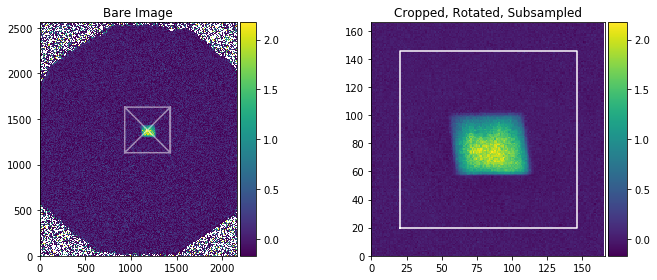

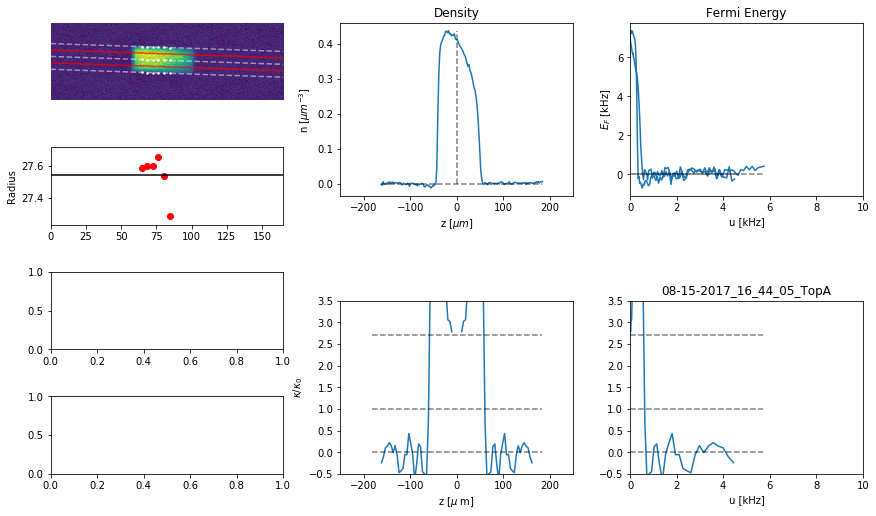

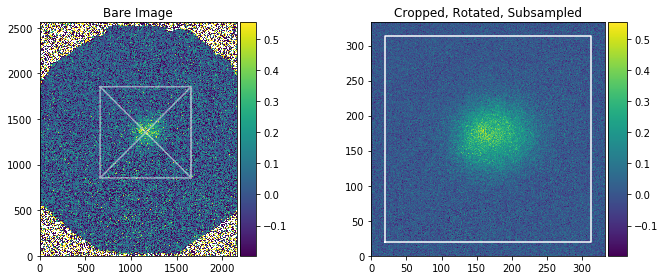

In [202]:
# Tests
test = 0
print(df.image.iloc[test].name)
df.image.iloc[test].plot_crop()
df.image.iloc[test].plot_hybrid_info()
print(df.image.iloc[test+1].name)
df.image.iloc[test+1].plot_crop()


        Total Loaded Images 7
        Atom Num Filter     7
        Removed Images      0
        


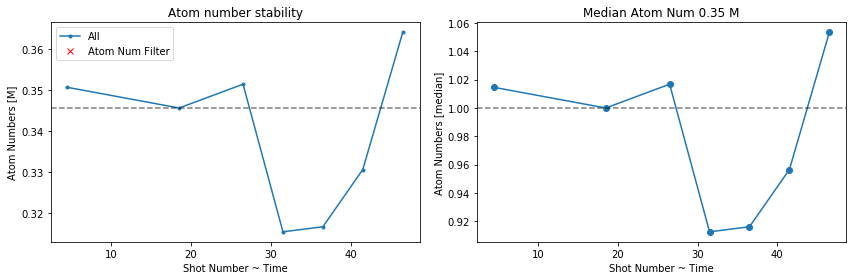

##______Fit Value______Error______
 0 ==> -3.063e+07 (+-) 1.104e+06
 1 ==> 6.939e+03 (+-)     16.64


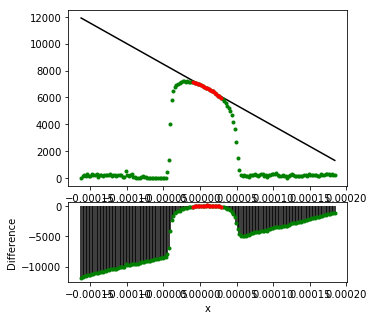

In [203]:
# Fit the fermi energies

# Get all the profiles
all_profiles = np.array([cst.n2EFHz(image.n) for image in df['image'][::2] ])
# Atom number filtering using the PIV images
using = atom_num_filter(df.iloc[1::2], keep=0.10, offset=0.0)
plt.show()
profiles = all_profiles[using]

# Fit the mean profile
mean_profile = tp.Curve(df['image'].iloc[0].z , np.nan_to_num(np.nanmean(profiles, axis=0)))

zlim = [-1e-5,3e-5]
using = (1e6*mean_profile.x<zlim[1]) & (1e6*mean_profile.x>zlim[0])
fr, fe = mean_profile.fit(linearfitfun, [-1000,6000], plot=True, xlim=zlim)
g = -fr[0]*1e-6
kappa = g/(1e-6*cst.mass*(cst.twopi*23)**2 *((df['Axial Grad Volt'].iloc[0]*513.6e-6) - 1.72e-6)/cst.h)


In [204]:
kappa

2.4714627857276219

## Filter and process all data

In [205]:
allevaps = np.unique(df_full.SideGreenEvap.tolist())
df_results = pd.DataFrame(columns=['evap', 'kappa', 'atomnum','EF'])
df_results['evap'] = allevaps

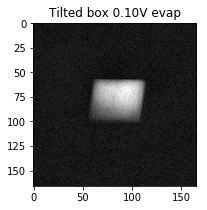


        Total Loaded Images 7
        Atom Num Filter     7
        Removed Images      0
        


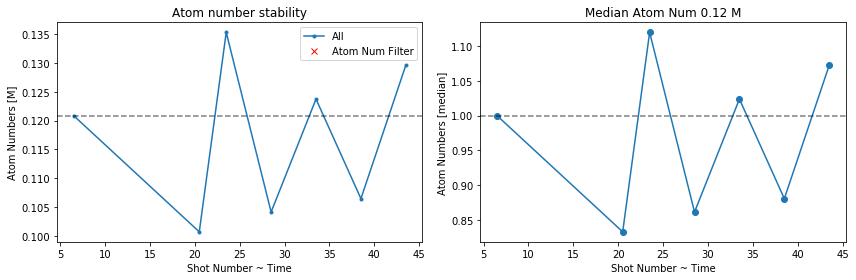

##______Fit Value______Error______
 0 ==> -3.356e+07 (+-) 1.913e+06
 1 ==> 3.984e+03 (+-)     28.11


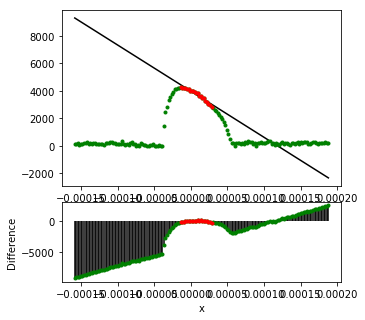

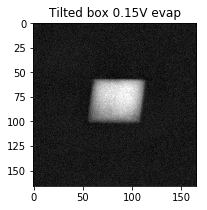


        Total Loaded Images 3
        Atom Num Filter     2
        Removed Images      1
        


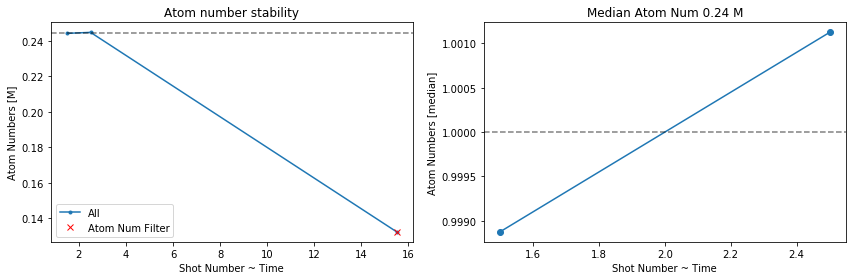

##______Fit Value______Error______
 0 ==> -3.232e+07 (+-)  1.66e+06
 1 ==> 5.657e+03 (+-)     25.17


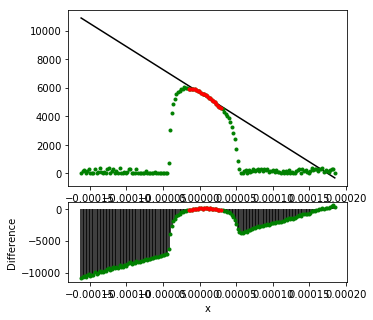

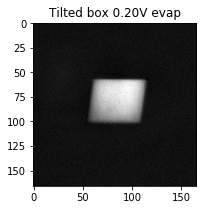


        Total Loaded Images 7
        Atom Num Filter     7
        Removed Images      0
        


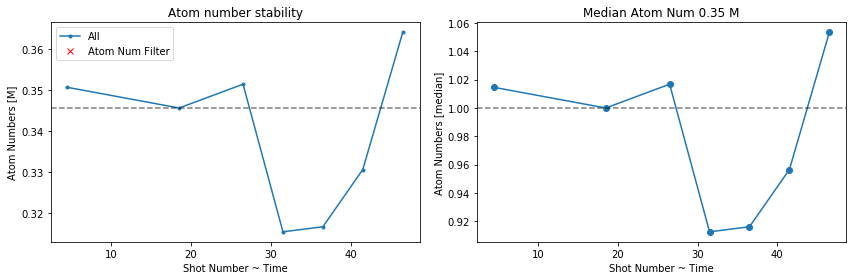

##______Fit Value______Error______
 0 ==> -2.861e+07 (+-) 1.192e+06
 1 ==> 6.907e+03 (+-)     17.69


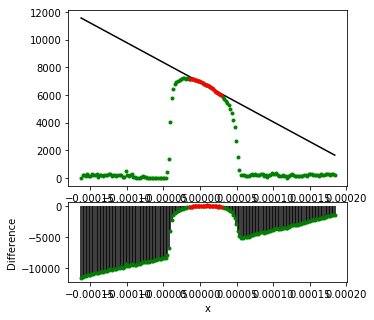

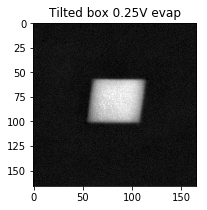


        Total Loaded Images 2
        Atom Num Filter     2
        Removed Images      0
        


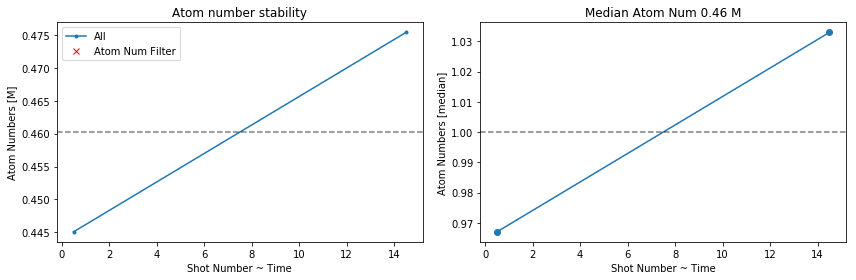

##______Fit Value______Error______
 0 ==> -1.222e+07 (+-) 9.885e+05
 1 ==> 7.977e+03 (+-)     15.19


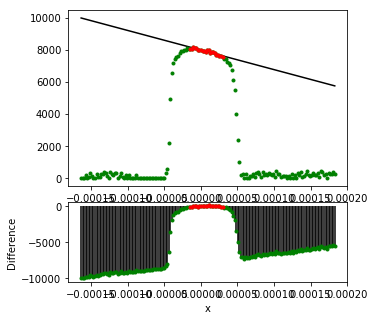

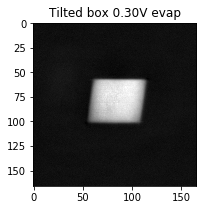


        Total Loaded Images 8
        Atom Num Filter     7
        Removed Images      1
        


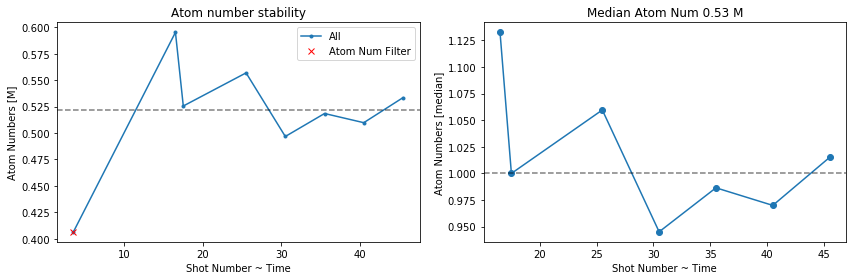

##______Fit Value______Error______
 0 ==> -1.46e+07 (+-) 9.185e+05
 1 ==>  8.42e+03 (+-)     14.22


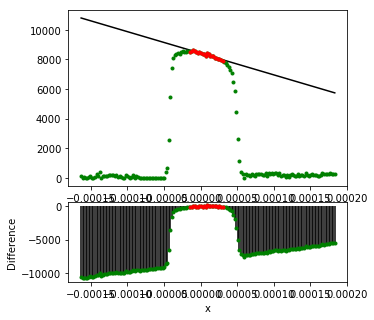

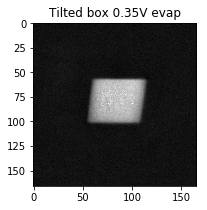


        Total Loaded Images 1
        Atom Num Filter     1
        Removed Images      0
        


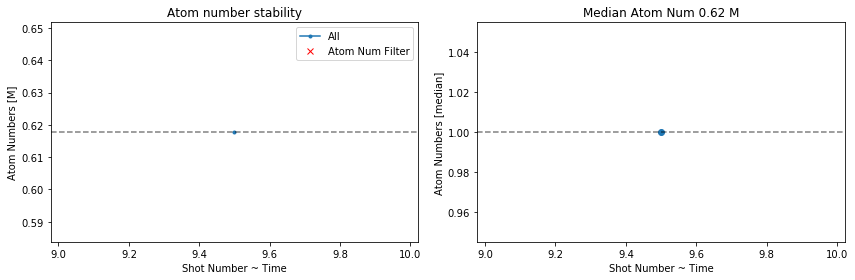

##______Fit Value______Error______
 0 ==> -1.347e+07 (+-) 1.692e+06
 1 ==> 9.114e+03 (+-)     24.52


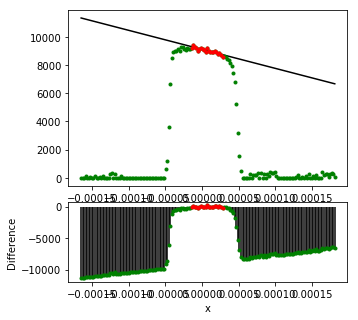

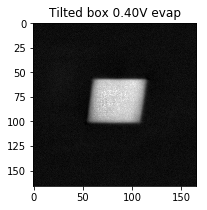


        Total Loaded Images 2
        Atom Num Filter     2
        Removed Images      0
        


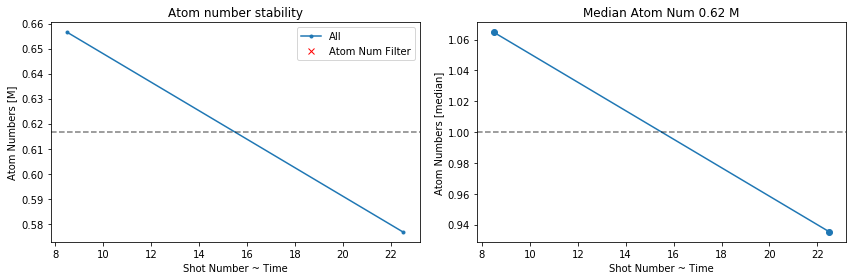

##______Fit Value______Error______
 0 ==> -8.431e+06 (+-) 1.459e+06
 1 ==>  9.13e+03 (+-)     22.47


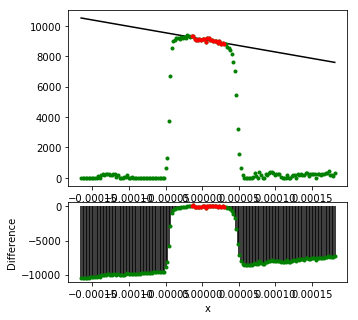

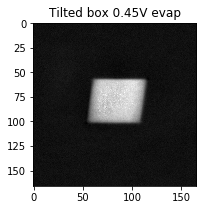


        Total Loaded Images 2
        Atom Num Filter     2
        Removed Images      0
        


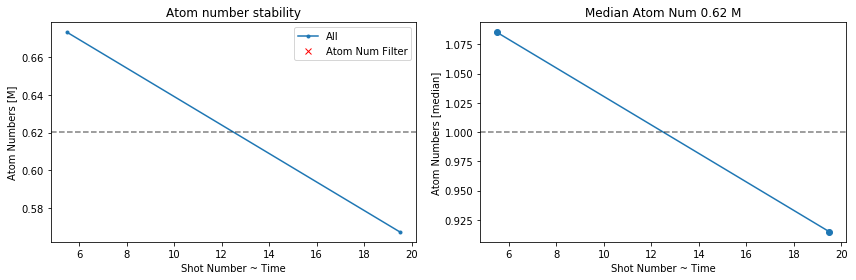

##______Fit Value______Error______
 0 ==> -9.587e+06 (+-) 1.235e+06
 1 ==> 8.863e+03 (+-)     18.93


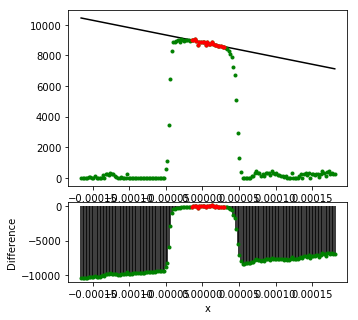

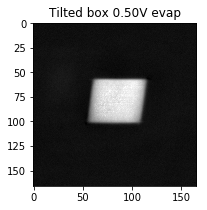


        Total Loaded Images 6
        Atom Num Filter     6
        Removed Images      0
        


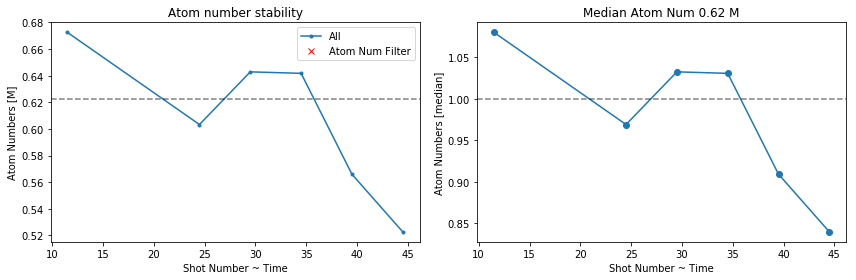

##______Fit Value______Error______
 0 ==> -7.124e+06 (+-) 1.136e+06
 1 ==> 9.115e+03 (+-)     17.38


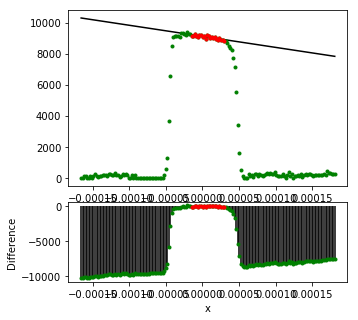

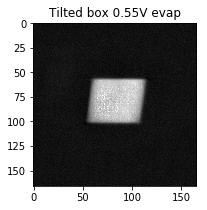


        Total Loaded Images 1
        Atom Num Filter     1
        Removed Images      0
        


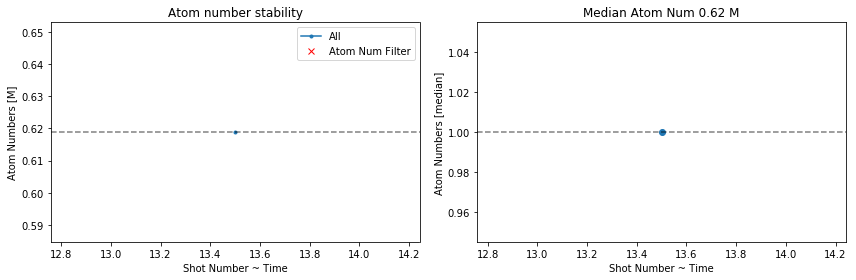

##______Fit Value______Error______
 0 ==> 2.671e+06 (+-) 2.302e+06
 1 ==> 9.238e+03 (+-)     34.75


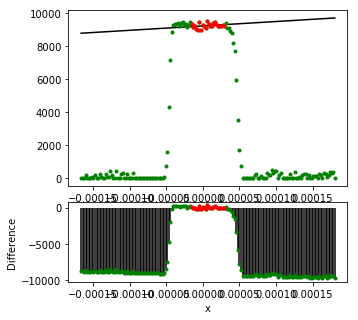

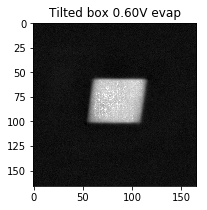


        Total Loaded Images 1
        Atom Num Filter     1
        Removed Images      0
        


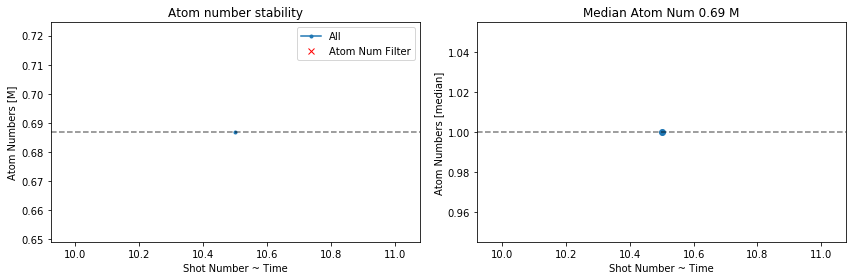

##______Fit Value______Error______
 0 ==> 1.302e+06 (+-) 2.489e+06
 1 ==> 9.322e+03 (+-)     37.51


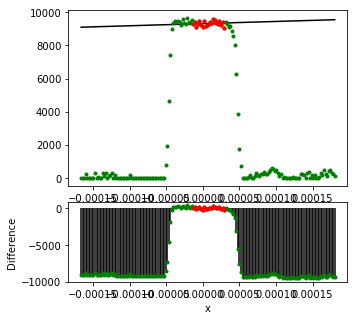

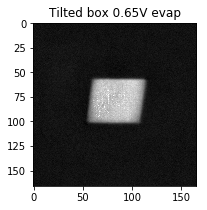


        Total Loaded Images 1
        Atom Num Filter     1
        Removed Images      0
        


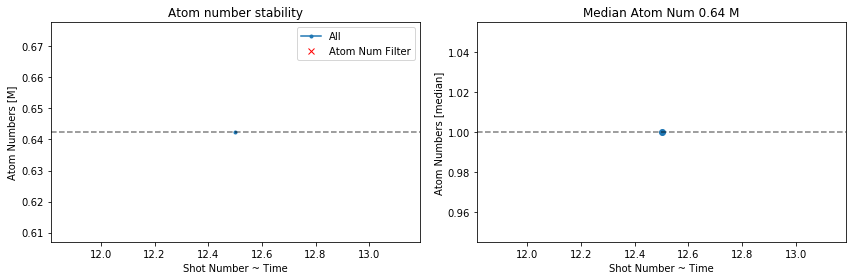

##______Fit Value______Error______
 0 ==> -1.598e+05 (+-) 2.148e+06
 1 ==> 9.173e+03 (+-)     32.71


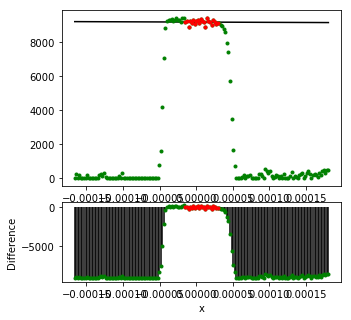

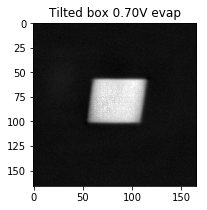


        Total Loaded Images 6
        Atom Num Filter     6
        Removed Images      0
        


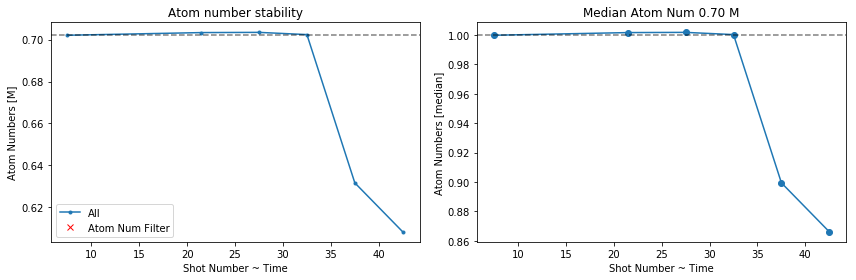

##______Fit Value______Error______
 0 ==> -1.653e+05 (+-) 1.225e+06
 1 ==> 9.258e+03 (+-)     18.49


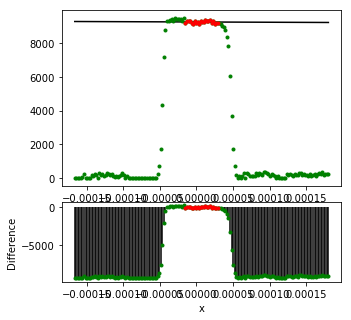

In [228]:


box_volume = cst.pi * (59.5e-6)**2 * (87e-6) 

for i,r in df_results.iterrows():
    evap = r['evap']
    df = df_full[df_full.SideGreenEvap==evap]
    # Atom number
    df['total_atoms'] = [im.total_atoms for im in df.image]
    nums = df['total_atoms'].values
    # Fit the fermi energies
    
    # Show the averaged image
    all_images = np.array([image.app for image in df['image'][::2]])
    avg_image = np.nanmean(all_images,axis=0)
    plt.subplots(figsize=(3,3))
    plt.imshow(avg_image, cmap='gray')
    plt.title('Tilted box {:.2f}V evap'.format(evap))
    plt.savefig('Aug15figures/Tilted box {:.2f}V evap.png'.format(evap))
    plt.show()

    # Get all the profiles
    all_profiles = np.array([cst.n2EFHz(image.n) for image in df['image'][::2] ])
    # Atom number filtering using the PIV images
    using = atom_num_filter(df.iloc[1::2], keep=0.20, offset=0.0)
    plt.show()
    profiles = all_profiles[using]

    # Fit the mean profile
    mean_profile = tp.Curve(df['image'].iloc[0].z , np.nan_to_num(np.nanmean(profiles, axis=0)))

    zlim = [-1.5e-5,3e-5]
    using = (1e6*mean_profile.x<zlim[1]) & (1e6*mean_profile.x>zlim[0])
    fr, fe = mean_profile.fit(linearfitfun, [-1000,6000], plot=True, xlim=zlim)
    plt.savefig('Aug15figures/Fitted box {:.2f}V evap.png'.format(evap))
    plt.show()
    g = -fr[0]*1e-6
    kappa = g/(1e-6*cst.mass*(cst.twopi*23)**2 *((df['Axial Grad Volt'].iloc[0]*513.6e-6) - 1.72e-6)/cst.h)
    df_results.loc[i,'kappa'] = kappa
    df_results.loc[i,'atomnum'] = np.nanmean(nums)
    df_results.loc[i,'EF'] = cst.n2EFHz(np.nanmean(nums)/box_volume)

In [215]:
df_results

,evap,kappa,atomnum,EF
0,0.10,2.70773,119274,3161.56
1,0.15,2.60816,205789,4547.98
2,0.20,2.30839,346919,6442.04
3,0.25,0.986216,465355,7835.4
4,0.30,1.17807,517641,8411.83
5,0.35,1.08672,619455,9481.51
6,0.40,0.680285,630324,9592.11
7,0.45,0.773546,616322,9449.52
8,0.50,0.574843,627308,9561.49
9,0.55,-0.215529,653686,9827.67


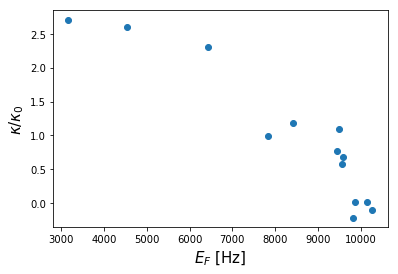

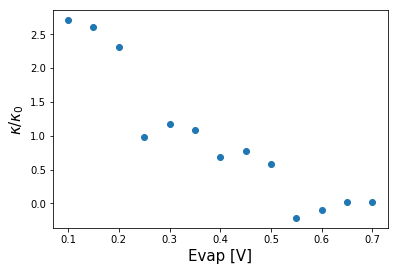

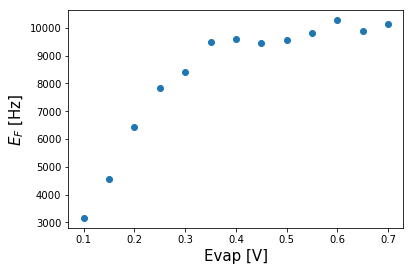

In [230]:
plt.plot(df_results.EF, df_results.kappa,'o')
plt.ylabel(r'$\kappa/\kappa_0$', fontsize=15)
plt.xlabel(r'$E_F$ [Hz]', fontsize=15)
plt.savefig('Aug15figures/kappa vs ef.png')
plt.show()

plt.plot(df_results.evap, df_results.kappa,'o')
plt.ylabel(r'$\kappa/\kappa_0$', fontsize=15)
plt.xlabel(r'Evap [V]', fontsize=15)
plt.savefig('Aug15figures/kappa vs evap.png')
plt.show()

plt.plot(df_results.evap, df_results.EF,'o')
plt.ylabel(r'$E_F$ [Hz]', fontsize=15)
plt.xlabel(r'Evap [V]', fontsize=15)
plt.savefig('Aug15figures/ef vs evap.png')
plt.show()

# Tilt vs heating

## Import the entire dataset

In [890]:
# Initialize Dataframe
df = get_from_clipboard(init=True)
var = ['TOF','SideGreenEvap','SpectVolt', 'SeqMode', 'HeatCycles','Axial Grad Volt', 'ExpansionTime']
x_var = 'HeatCycles'

fudge = 1.66

# Import from Clipboard
df_full = get_from_clipboard(df=df, init=False, var=var, x_var=x_var, image_func=tp.Image, using=2)

# Define Settings
settings_side = {**default_settings, 
            **dict(center_x = 118, center_y = 378, width=140, height=140, od_method='log', Isat=9e9, 
                   pixel=5.1e-6, sigmaf=0.5, fudge=1, bg_width=10,subsample=1, bg_order=1)}
settings_top_insitu = {**default_settings, 
            **dict(center_x = 1182, center_y=1380, width=500, height=500, 
               subsample=3, rotate=0, rotate_method='bilinear',
               bg_width=20, bg_order=1, bad_light=0, Isat=77, time=10, 
               pixel=0.7e-6, od_method='table', sigmaf=0.5, 
               memory_saver=True, 
               fudge=fudge, ellipticity=1,
               xsec_extension='poly0', xsec_slice_width=4, xsec_fit_range=1,
               trap_f=trap_f, radial_selection=0.5, kind='ideal', Tfit_lim=0.06, Tfit_guess_kT=0.1, Tfit_guess_mu0=3, 
               )}

settings_top_piv = {**default_settings, 
            **dict(center_x = 1162, center_y = 1354, width=1000, height=1000, fudge=fudge)}
settings_expansion = {**default_settings, 
            **dict(center_x = 1190, center_y = 1340, width = 500, height = 1100, fudge=fudge)}

    
# Apply settings    
for i, r in df.iterrows():
    if r['SeqMode'] == 15:
        if r['name'][-1]=='A':
            df.loc[i,'image'] = tp.Hybrid_Image(name=r['name'])
            df.loc[i,'image'].set(**settings_top_insitu)
        else:
            r.image.set(**settings_top_piv)
    elif r['SeqMode'] == 14:
        df.loc[i,'image'] = tp.Hybrid_Image(name=r['name'])
        df.loc[i,'image'].set(**settings_expansion)
        
# df = df_full


Updating the local database...
Done


## Try for a single value

In [243]:
# Select the heat:
heat=0
df = df_full[(df_full.HeatCycles==heat) &(df_full.SeqMode==15)]
# Atom number
df['total_atoms'] = [im.total_atoms for im in tqdm(df.image)]
nums = df['total_atoms'].values

df.head()

,name,image,shot,x,TOF,SideGreenEvap,SpectVolt,SeqMode,HeatCycles,Axial Grad Volt,total_atoms
38,08-15-2017_18_26_37_TopA,<therpy.classes.Hybrid_Image object at 0x00000...,19.0,0.0,0.0,0.2,1.5,15.0,0.0,0.08,371415.940086
39,08-15-2017_18_26_37_TopB,<therpy.classes.Image object at 0x000000001813...,19.5,0.0,0.0,0.2,1.5,15.0,0.0,0.08,355282.673690
128,08-15-2017_19_13_13_TopA,<therpy.classes.Hybrid_Image object at 0x00000...,64.0,0.0,0.0,0.2,1.5,15.0,0.0,0.08,358447.871602
129,08-15-2017_19_13_13_TopB,<therpy.classes.Image object at 0x000000001812...,64.5,0.0,0.0,0.2,1.5,15.0,0.0,0.08,331422.316322
130,08-15-2017_19_14_08_TopA,<therpy.classes.Hybrid_Image object at 0x00000...,65.0,0.0,0.0,0.2,1.5,15.0,0.0,0.08,376276.096827


08-15-2017_18_26_37_TopA
08-15-2017_18_26_37_TopB


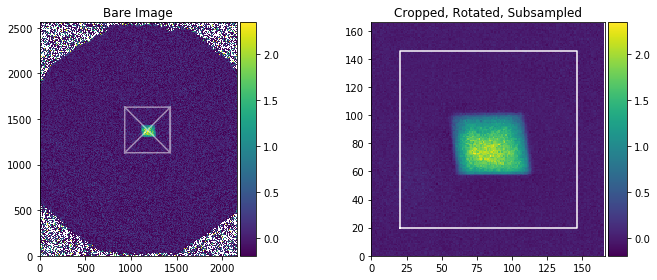

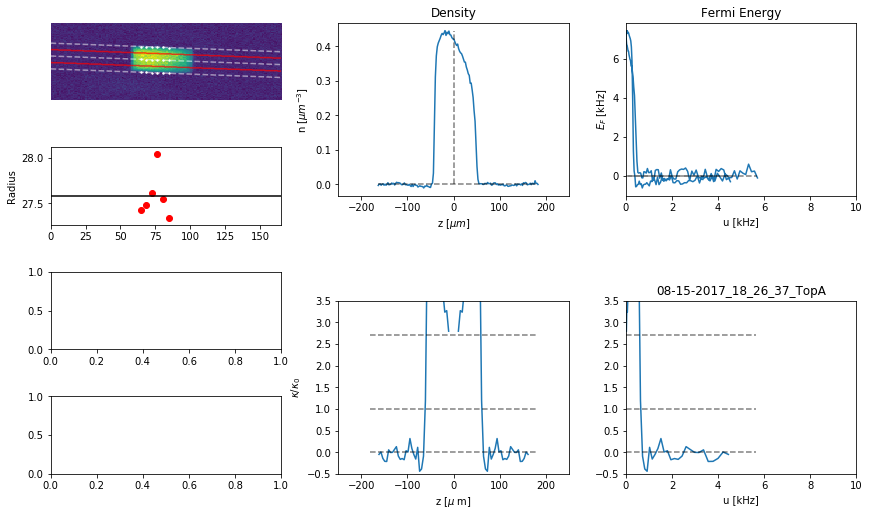

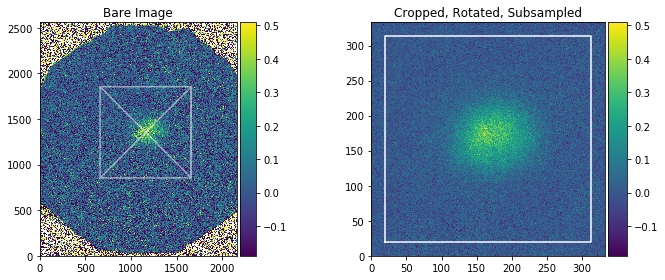

In [245]:
# Tests
test = 0
print(df.image.iloc[test].name)
df.image.iloc[test].plot_crop()
df.image.iloc[test].plot_hybrid_info()
print(df.image.iloc[test+1].name)
df.image.iloc[test+1].plot_crop()


        Total Loaded Images 3
        Atom Num Filter     3
        Removed Images      0
        


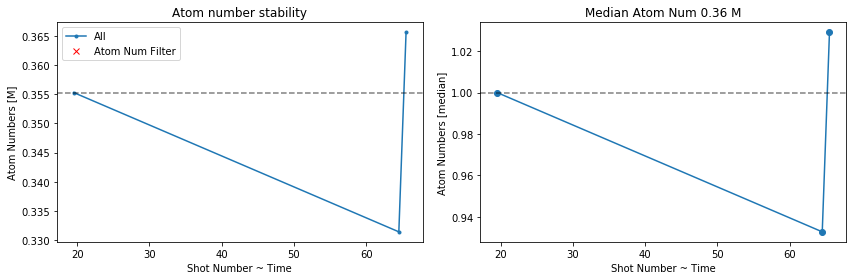

##______Fit Value______Error______
 0 ==> -2.696e+07 (+-) 9.641e+05
 1 ==> 6.992e+03 (+-)     15.12


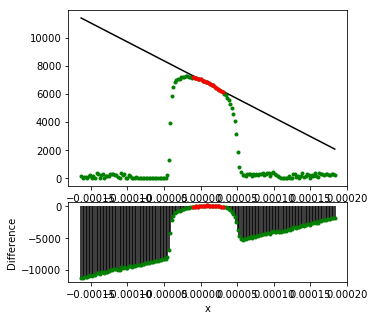

In [246]:
# Fit the fermi energies

# Get all the profiles
all_profiles = np.array([cst.n2EFHz(image.n) for image in df['image'][::2] ])
# Atom number filtering using the PIV images
using = atom_num_filter(df.iloc[1::2], keep=0.10, offset=0.0)
plt.show()
profiles = all_profiles[using]

# Fit the mean profile
mean_profile = tp.Curve(df['image'].iloc[0].z , np.nan_to_num(np.nanmean(profiles, axis=0)))

zlim = [-1e-5,3e-5]
using = (1e6*mean_profile.x<zlim[1]) & (1e6*mean_profile.x>zlim[0])
fr, fe = mean_profile.fit(linearfitfun, [-1000,6000], plot=True, xlim=zlim)
g = -fr[0]*1e-6
kappa = g/(1e-6*cst.mass*(cst.twopi*23)**2 *((df['Axial Grad Volt'].iloc[0]*513.6e-6) - 1.72e-6)/cst.h)


In [247]:
kappa

2.175456181302923

## Filter and process all data

In [891]:
allheats = np.unique(df_full.HeatCycles.tolist())
df_results = pd.DataFrame(columns=['heatcycles', 'kappa', 'atomnum','EF', 'EE0', 'kerr'])
df_results['heatcycles'] = allheats

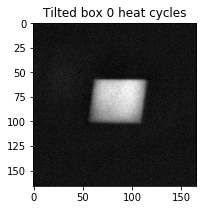


        Total Loaded Images 3
        Atom Num Filter     3
        Removed Images      0
        


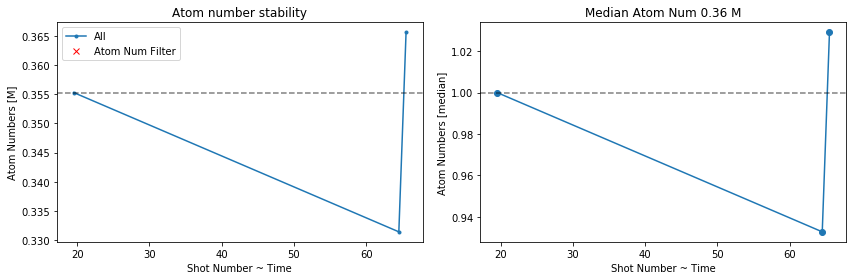

##______Fit Value______Error______
 0 ==> -2.494e+07 (+-) 1.038e+06
 1 ==> 6.988e+03 (+-)     12.81


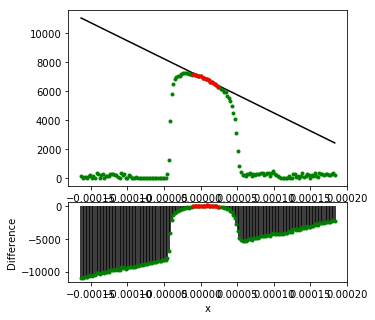


        Total Loaded Images 2
        Atom Num Filter     2
        Removed Images      0
        


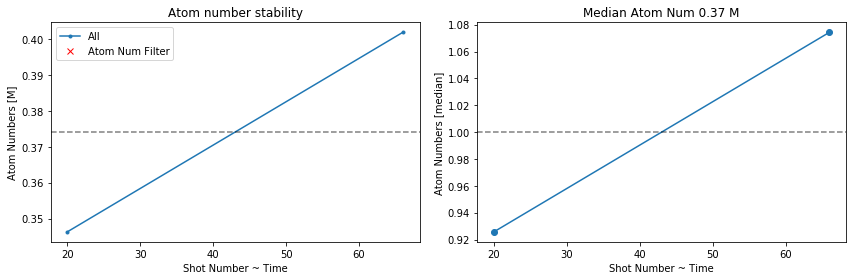

E/E0 from EoS fit : 0.522 +- 0.005
T/TF from EoS fit : 0.125 +- 0.005


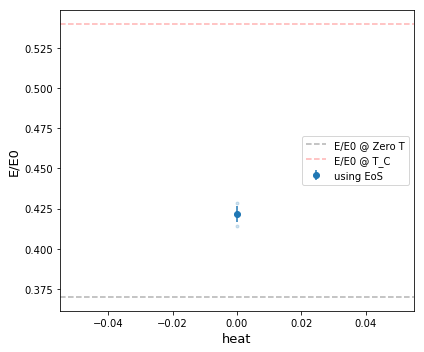

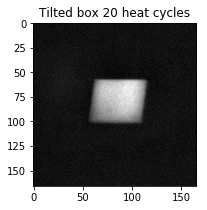


        Total Loaded Images 3
        Atom Num Filter     3
        Removed Images      0
        


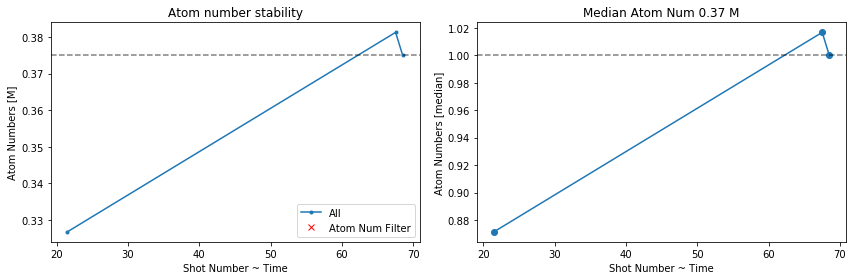

##______Fit Value______Error______
 0 ==> -2.54e+07 (+-) 1.191e+06
 1 ==> 6.909e+03 (+-)     14.74


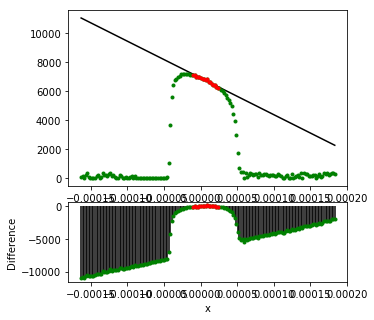


        Total Loaded Images 2
        Atom Num Filter     2
        Removed Images      0
        


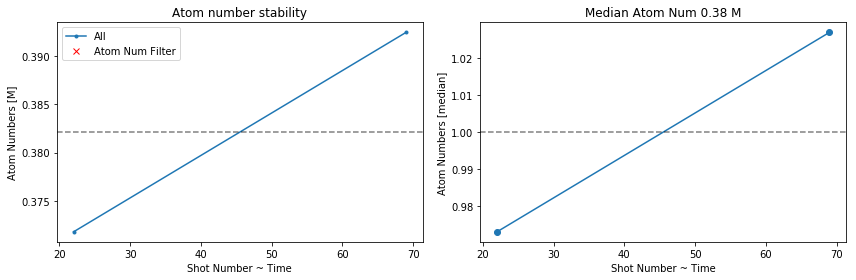

E/E0 from EoS fit : 0.533 +- 0.006
T/TF from EoS fit : 0.130 +- 0.005


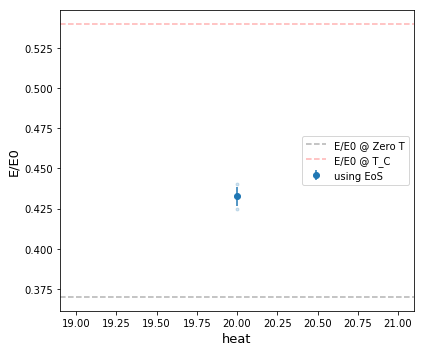

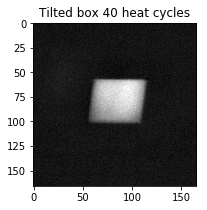


        Total Loaded Images 2
        Atom Num Filter     2
        Removed Images      0
        


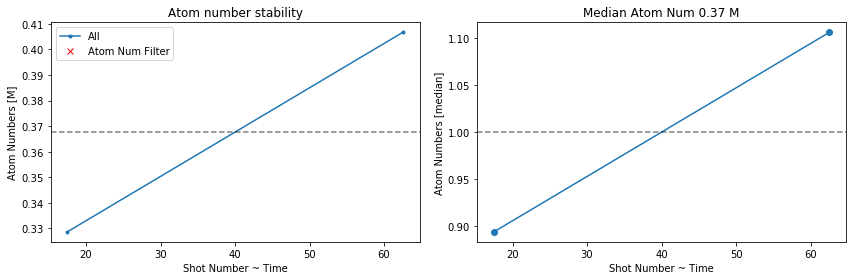

##______Fit Value______Error______
 0 ==> -2.62e+07 (+-) 1.269e+06
 1 ==> 7.012e+03 (+-)     15.88


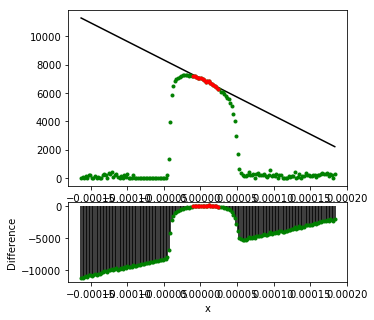


        Total Loaded Images 2
        Atom Num Filter     2
        Removed Images      0
        


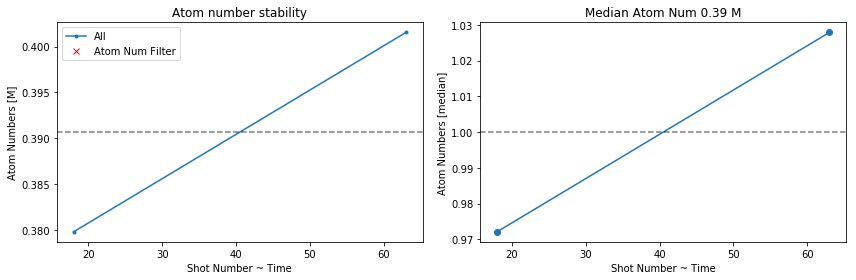

E/E0 from EoS fit : 0.538 +- 0.005
T/TF from EoS fit : 0.133 +- 0.004


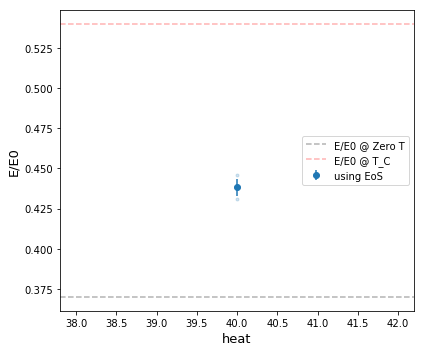

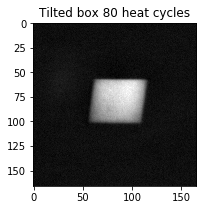


        Total Loaded Images 3
        Atom Num Filter     3
        Removed Images      0
        


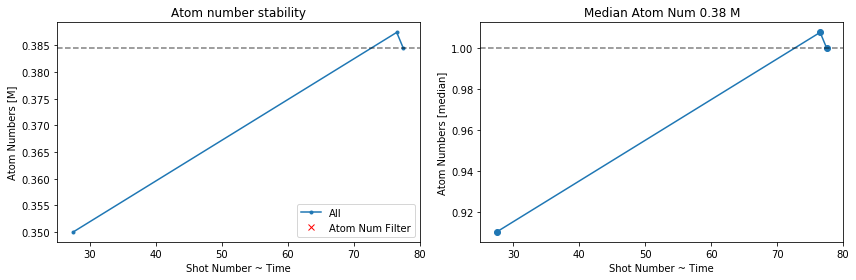

##______Fit Value______Error______
 0 ==> -2.917e+07 (+-) 1.209e+06
 1 ==> 7.104e+03 (+-)     14.93


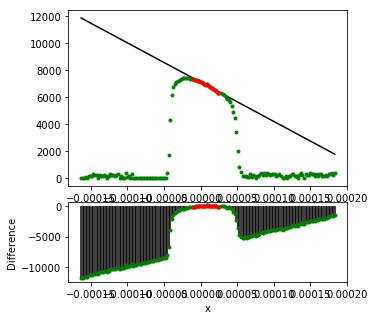


        Total Loaded Images 2
        Atom Num Filter     2
        Removed Images      0
        


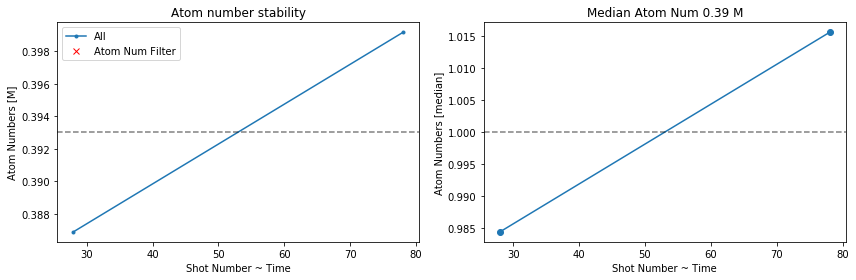

E/E0 from EoS fit : 0.602 +- 0.019
T/TF from EoS fit : 0.154 +- 0.012


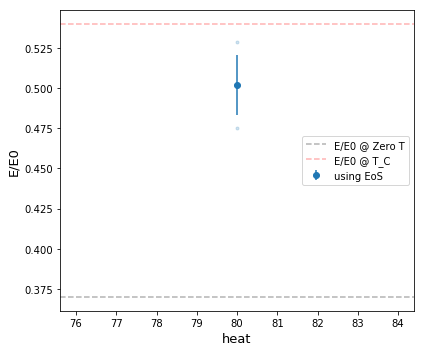

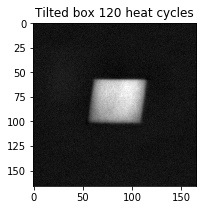


        Total Loaded Images 3
        Atom Num Filter     3
        Removed Images      0
        


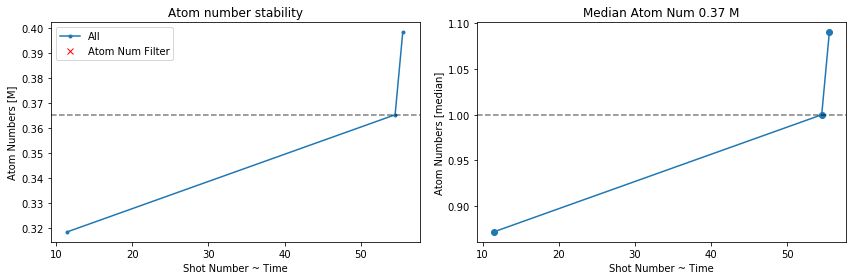

##______Fit Value______Error______
 0 ==> -2.232e+07 (+-) 1.124e+06
 1 ==> 6.729e+03 (+-)     13.84


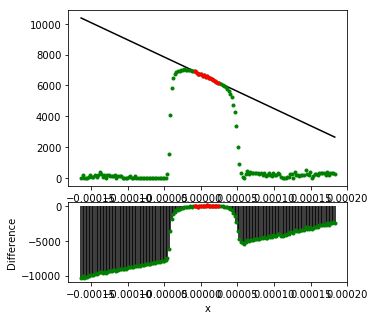


        Total Loaded Images 1
        Atom Num Filter     1
        Removed Images      0
        


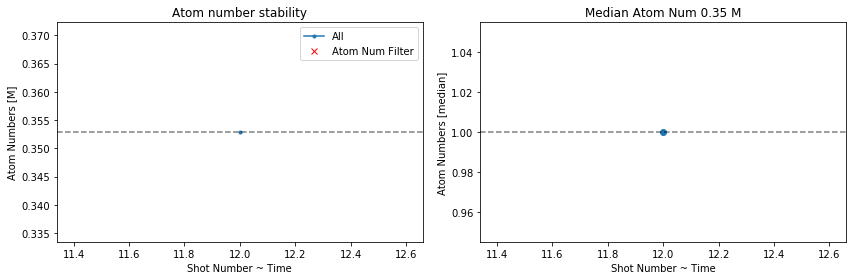

E/E0 from EoS fit : 0.649 +- 0.000
T/TF from EoS fit : 0.173 +- 0.000


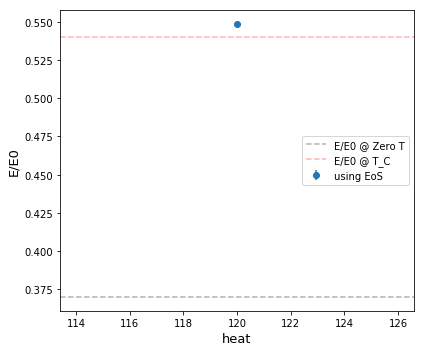

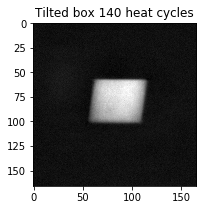


        Total Loaded Images 4
        Atom Num Filter     4
        Removed Images      0
        


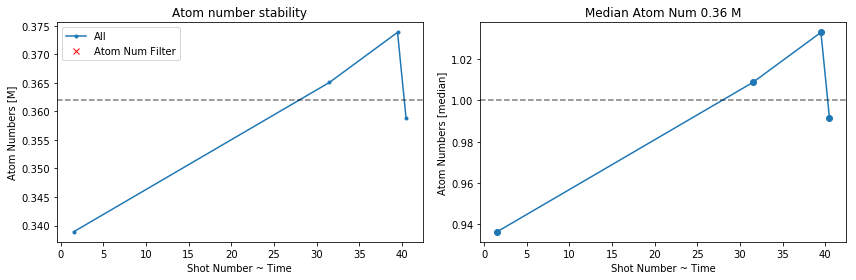

##______Fit Value______Error______
 0 ==> -2.277e+07 (+-) 7.597e+05
 1 ==> 6.877e+03 (+-)     9.905


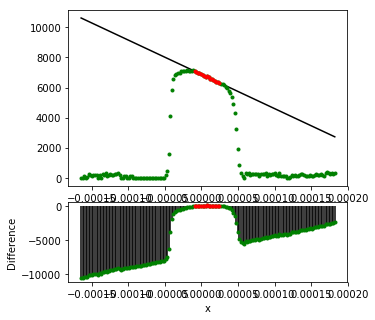


        Total Loaded Images 3
        Atom Num Filter     3
        Removed Images      0
        


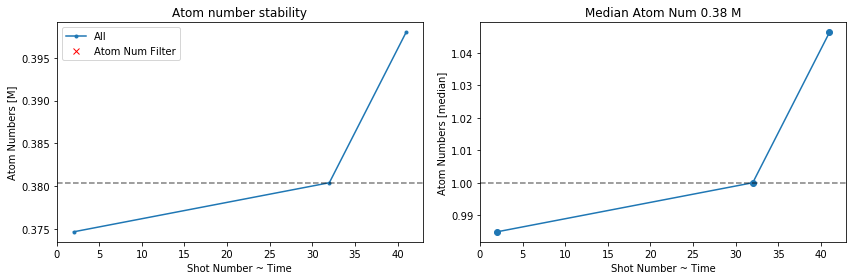

E/E0 from EoS fit : 0.620 +- 0.009
T/TF from EoS fit : 0.160 +- 0.007


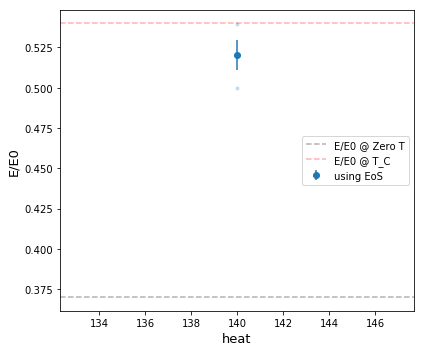

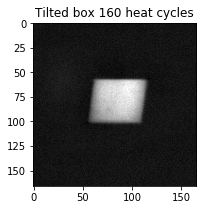


        Total Loaded Images 3
        Atom Num Filter     3
        Removed Images      0
        


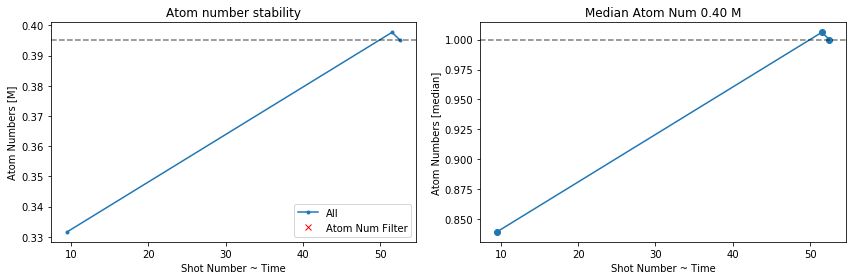

##______Fit Value______Error______
 0 ==> -1.971e+07 (+-) 1.043e+06
 1 ==> 6.745e+03 (+-)     13.68


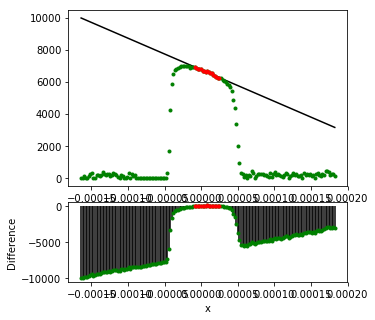


        Total Loaded Images 2
        Atom Num Filter     2
        Removed Images      0
        


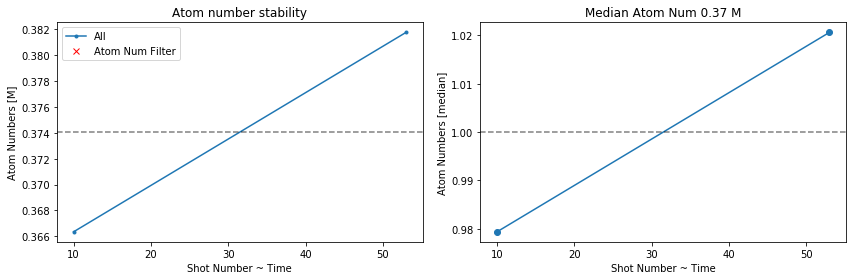

E/E0 from EoS fit : 0.671 +- 0.008
T/TF from EoS fit : 0.185 +- 0.008


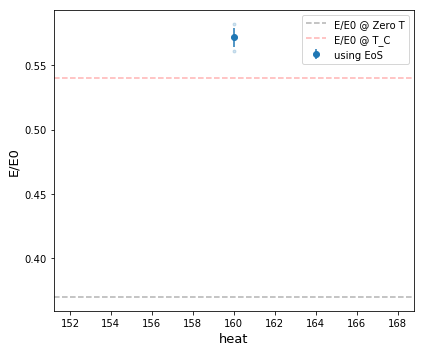

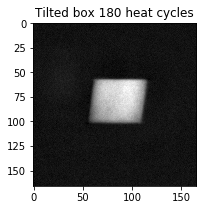


        Total Loaded Images 3
        Atom Num Filter     3
        Removed Images      0
        


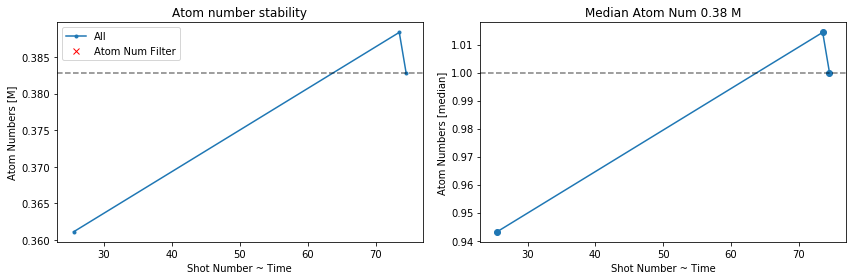

##______Fit Value______Error______
 0 ==> -1.75e+07 (+-) 9.153e+05
 1 ==> 6.647e+03 (+-)     11.92


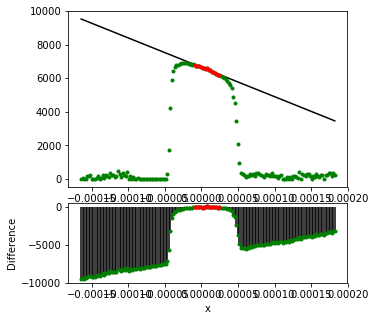


        Total Loaded Images 2
        Atom Num Filter     2
        Removed Images      0
        


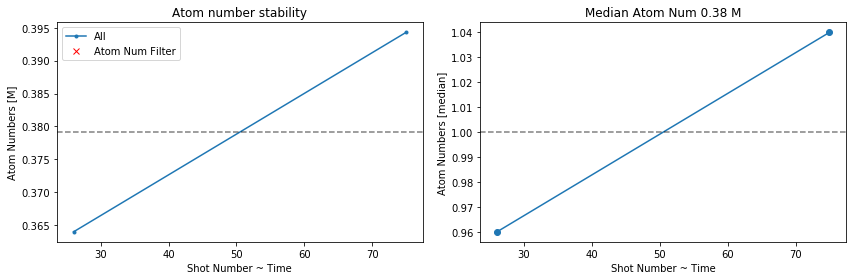

E/E0 from EoS fit : 0.706 +- 0.015
T/TF from EoS fit : 0.203 +- 0.015


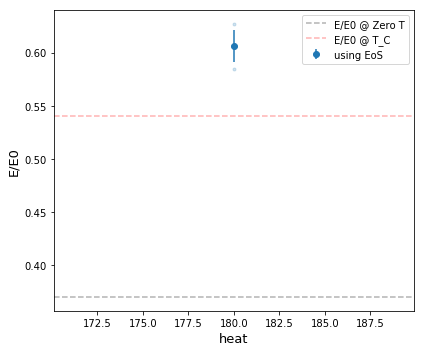

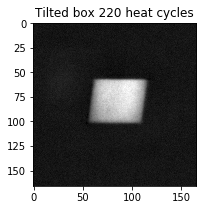


        Total Loaded Images 3
        Atom Num Filter     3
        Removed Images      0
        


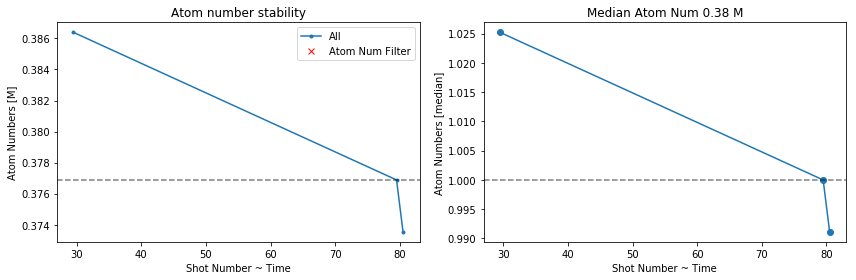

##______Fit Value______Error______
 0 ==> -1.733e+07 (+-) 1.079e+06
 1 ==>  6.76e+03 (+-)     13.97


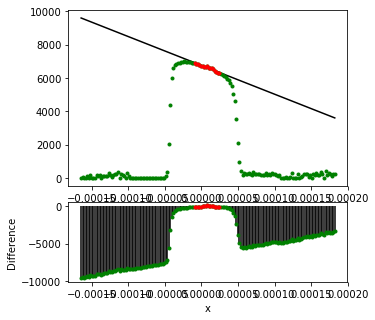


        Total Loaded Images 2
        Atom Num Filter     2
        Removed Images      0
        


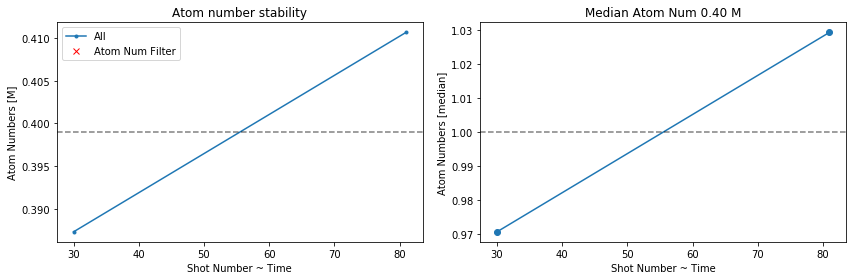

E/E0 from EoS fit : 0.745 +- 0.014
T/TF from EoS fit : 0.223 +- 0.015


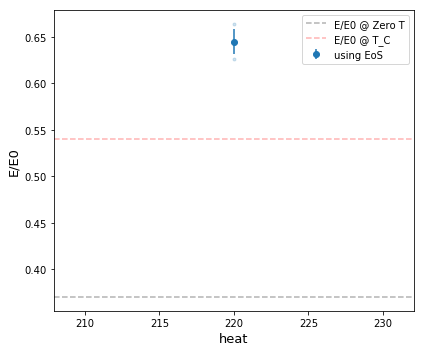

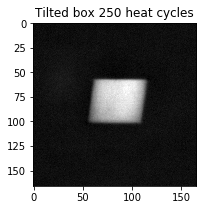


        Total Loaded Images 4
        Atom Num Filter     4
        Removed Images      0
        


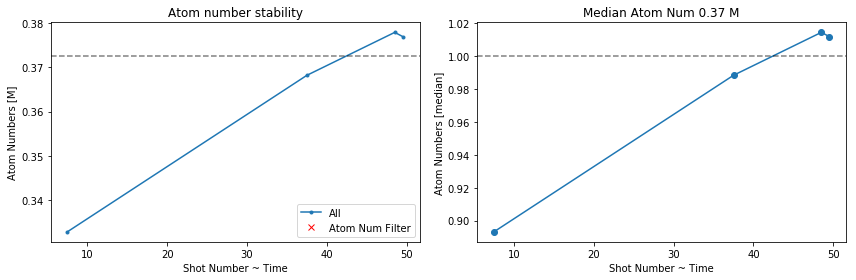

##______Fit Value______Error______
 0 ==> -1.733e+07 (+-) 9.832e+05
 1 ==> 6.761e+03 (+-)     12.76


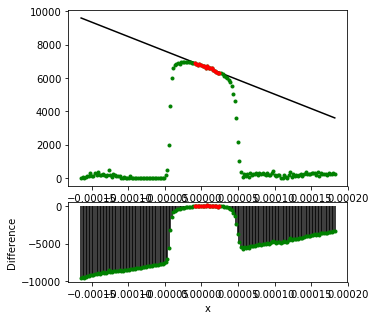


        Total Loaded Images 3
        Atom Num Filter     3
        Removed Images      0
        


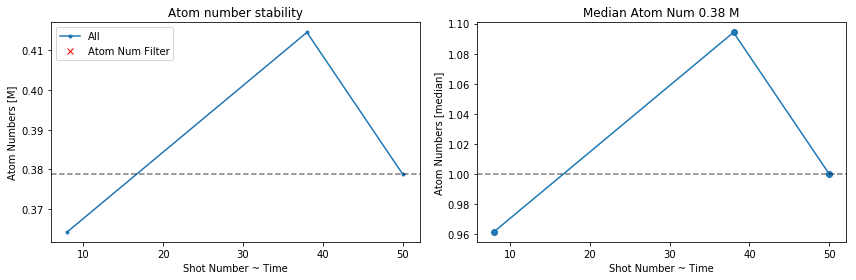

E/E0 from EoS fit : 0.792 +- 0.016
T/TF from EoS fit : 0.250 +- 0.018


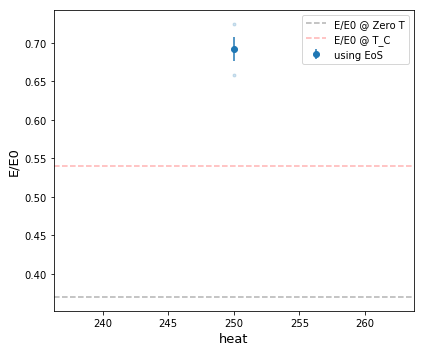

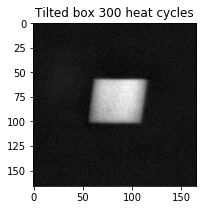


        Total Loaded Images 3
        Atom Num Filter     3
        Removed Images      0
        


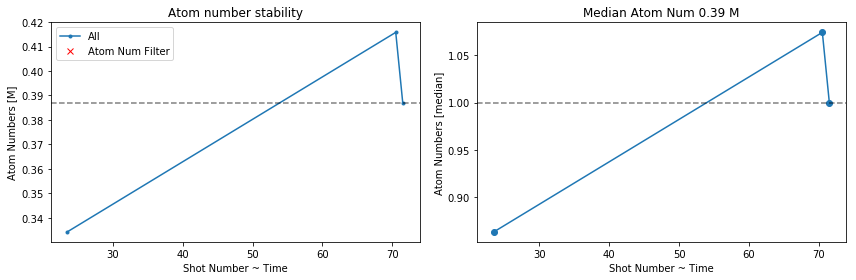

##______Fit Value______Error______
 0 ==> -1.561e+07 (+-)  9.72e+05
 1 ==> 6.746e+03 (+-)     12.39


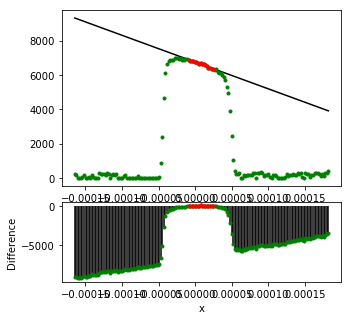


        Total Loaded Images 2
        Atom Num Filter     2
        Removed Images      0
        


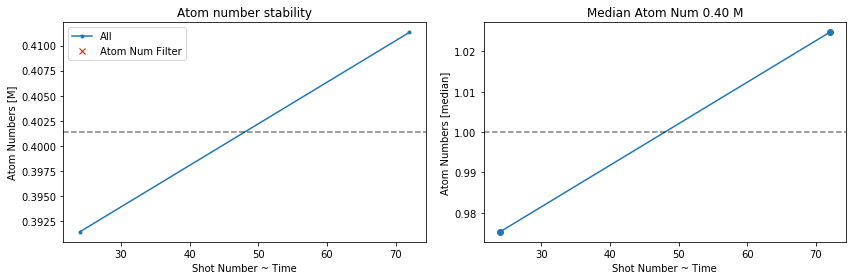

E/E0 from EoS fit : 0.861 +- 0.012
T/TF from EoS fit : 0.288 +- 0.014


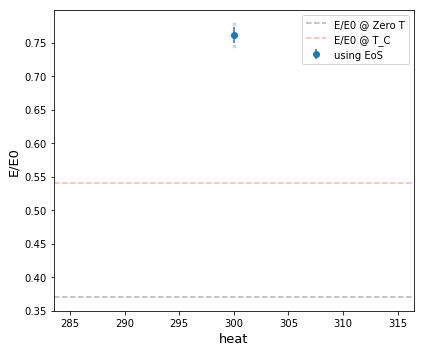

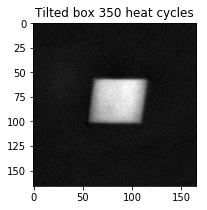


        Total Loaded Images 4
        Atom Num Filter     4
        Removed Images      0
        


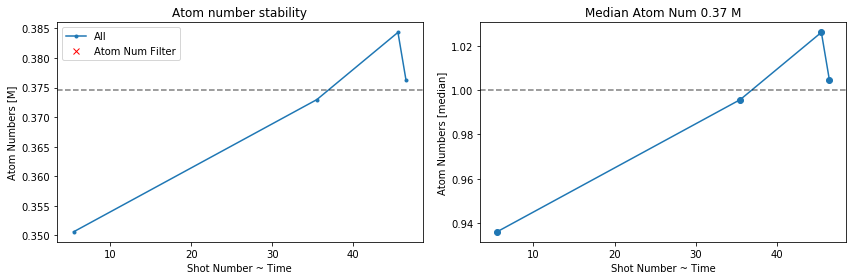

##______Fit Value______Error______
 0 ==> -1.41e+07 (+-) 8.953e+05
 1 ==> 6.609e+03 (+-)     11.43


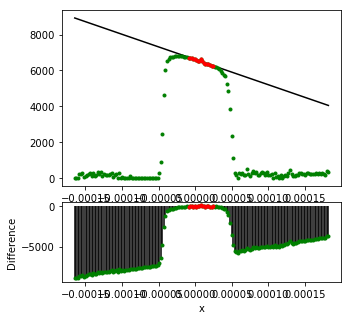


        Total Loaded Images 3
        Atom Num Filter     2
        Removed Images      1
        


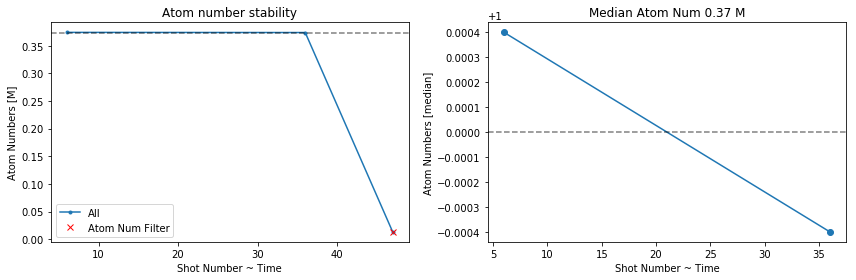

E/E0 from EoS fit : 0.965 +- 0.024
T/TF from EoS fit : 0.344 +- 0.025


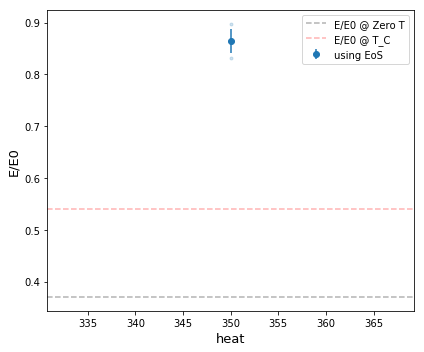

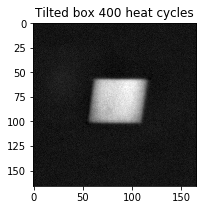


        Total Loaded Images 3
        Atom Num Filter     3
        Removed Images      0
        


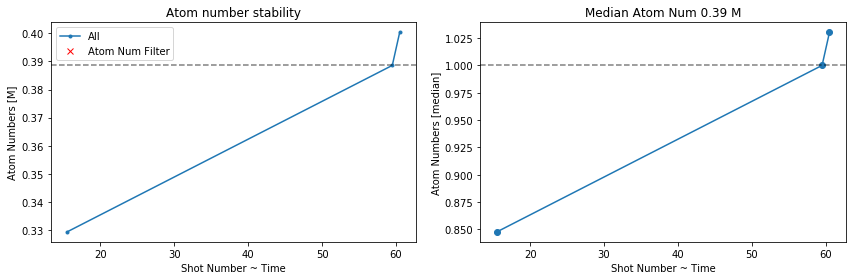

##______Fit Value______Error______
 0 ==> -1.378e+07 (+-) 5.728e+05
 1 ==> 6.545e+03 (+-)     7.311


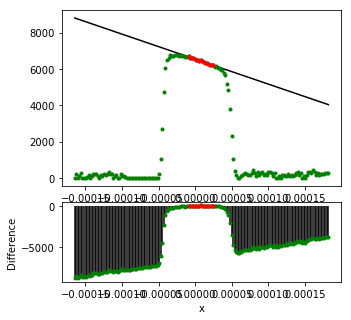


        Total Loaded Images 2
        Atom Num Filter     2
        Removed Images      0
        


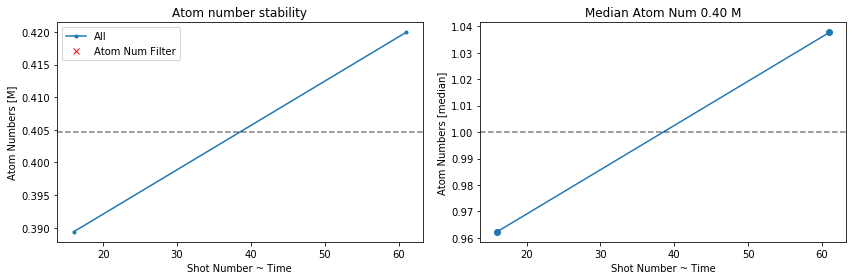

E/E0 from EoS fit : 1.086 +- 0.014
T/TF from EoS fit : 0.410 +- 0.015


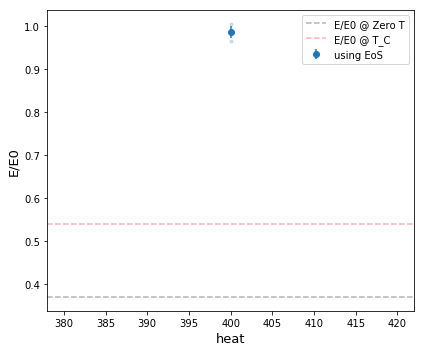

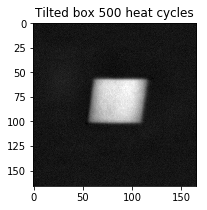


        Total Loaded Images 4
        Atom Num Filter     4
        Removed Images      0
        


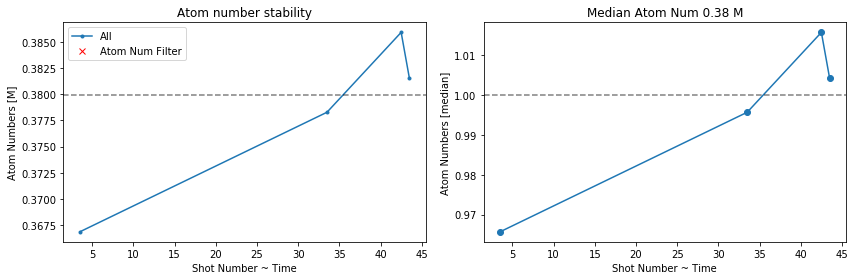

##______Fit Value______Error______
 0 ==> -1.118e+07 (+-) 7.662e+05
 1 ==> 6.554e+03 (+-)     9.666


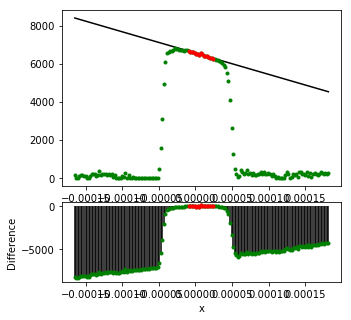


        Total Loaded Images 3
        Atom Num Filter     3
        Removed Images      0
        


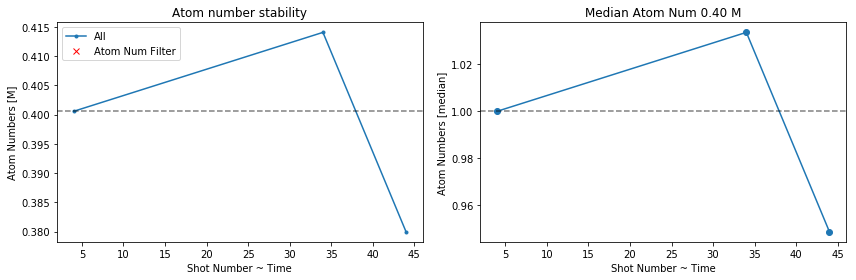

E/E0 from EoS fit : 1.273 +- 0.023
T/TF from EoS fit : 0.512 +- 0.024


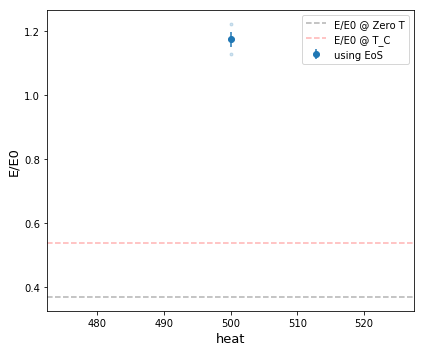

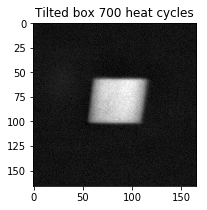


        Total Loaded Images 3
        Atom Num Filter     3
        Removed Images      0
        


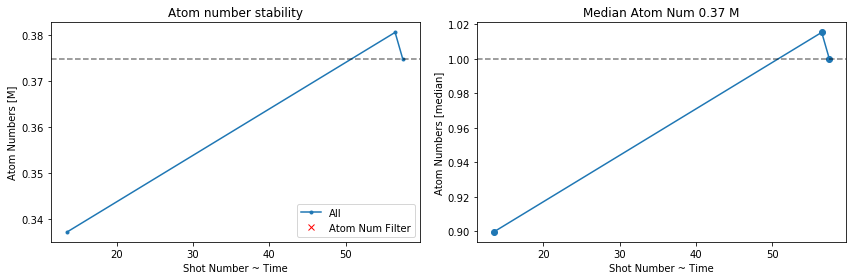

##______Fit Value______Error______
 0 ==> -8.925e+06 (+-) 8.938e+05
 1 ==> 6.236e+03 (+-)      11.2


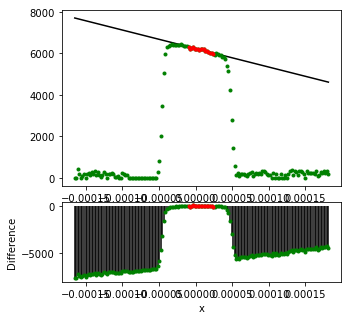


        Total Loaded Images 2
        Atom Num Filter     2
        Removed Images      0
        


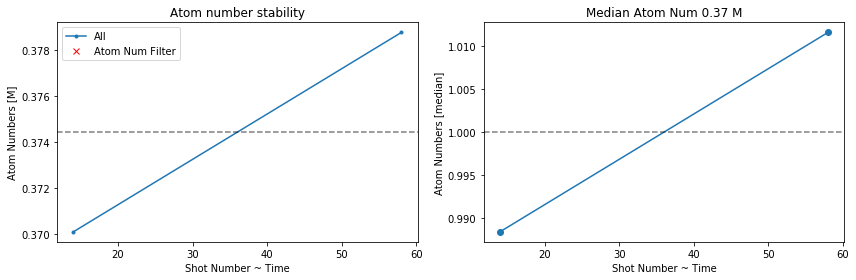

E/E0 from EoS fit : 1.741 +- 0.011
T/TF from EoS fit : 0.744 +- 0.011


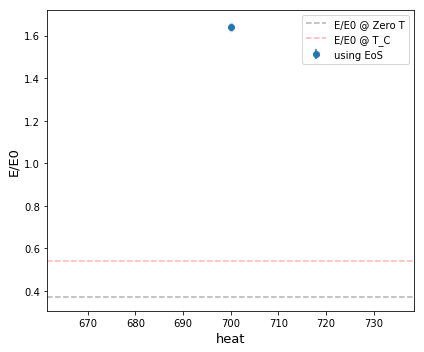

In [892]:
box_volume = cst.pi * (59.5e-6)**2 * (87e-6) 
fontsize=13
xlabel='heat'

for dfindex,r in df_results.iterrows():
    heat = r['heatcycles']
    df = df_full[(df_full.HeatCycles==heat) &(df_full.SeqMode==15)]
    # Atom number
    df['total_atoms'] = [im.total_atoms for im in df.image]
    nums = df['total_atoms'].values
    # Fit the fermi energies
    
    # Show the averaged image
    all_images = np.array([image.app for image in df['image'][::2]])
    avg_image = np.nanmean(all_images,axis=0)
    plt.subplots(figsize=(3,3))
    plt.imshow(avg_image, cmap='gray')
    plt.title('Tilted box {:.0f} heat cycles'.format(heat))
    plt.savefig('Aug15figures/Tilted box {:.0f} heat cycles.png'.format(heat))
    plt.show()

    # Get all the profiles
    all_profiles = np.array([cst.n2EFHz(image.n) for image in df['image'][::2] ])
    # Atom number filtering using the PIV images
    using = atom_num_filter(df.iloc[1::2], keep=0.20, offset=0.0)
    plt.show()
    profiles = all_profiles[using]

    # Fit the mean profile
    mean_profile = tp.Curve(df['image'].iloc[0].z , np.nan_to_num(np.nanmean(profiles, axis=0)))
    zlim = [-1e-5,2.5e-5]
    using = (1e6*mean_profile.x<zlim[1]) & (1e6*mean_profile.x>zlim[0])
    fr, fe = mean_profile.fit(linearfitfun, [-1000,6000], plot=True, xlim=zlim)
    plt.savefig('Aug15figures/Fitted box {:.0f} heat.png'.format(heat))
    plt.show()
    
    # Find kappa/kappa0
    kappa = -fr[0]*1e-6/(1e-6*cst.mass*(cst.twopi*23)**2 *((df['Axial Grad Volt'].iloc[0]*513.6e-6) - 1.72e-6)/cst.h)
    kerr= (fe[0])*1e-6/(1e-6*cst.mass*(cst.twopi*23)**2 *((df['Axial Grad Volt'].iloc[0]*513.6e-6) - 1.72e-6)/cst.h)
    
    # Put it in the results dataframe
    df_results.loc[dfindex,'kappa'] = kappa
    df_results.loc[dfindex,'kerr'] = kerr
    df_results.loc[dfindex,'atomnum'] = np.nanmean(nums)
    df_results.loc[dfindex,'EF'] = cst.n2EFHz(np.nanmean(nums)/box_volume)
    
    
        
#     # Thermometry:
    df = pd.DataFrame()
    df = df_full[(df_full.SeqMode==14)& (df_full.HeatCycles==heat)& (df_full['name'].str.contains('TopA'))].reset_index()
    
    zlim_second_moment = np.array([10, 200, df.image.iloc[0].nz.maxx*1e6])
    kHz = 1e3 * cst.h
    prefactor = 2 * cst.mass * df.image.iloc[0].trap_w**2

    # Atom Number Filter
    df['total_atoms'] = np.array([np.nansum(im.app) for im in df.image])
    using = atom_num_filter(df, keep=0.3, offset=0.0, plot=True)
    plt.show()

    # Compute E/N for good images
    EN_eos = np.array([hybrid_E_N(im.T_kHz * kHz, im.mu0_kHz * kHz, im.trap_f) for im in df.image[using]])
#     EN_moment = np.array([prefactor * compute_moment_v2(im.nz, zlim_second_moment) for im in df.image[using]])

    # Bin Data
    EN_eos = bin_data(df.x.values[using], EN_eos)
#     EN_moment = bin_data(df.x.values[using], EN_moment)
    total_atoms = bin_data(df.x.values[using], df.total_atoms.values[using])
    
    # Get energies
    hybrid_heating_compensation = 5.0e-5 * df.ExpansionTime.iloc[0]
    E_E0 = 5/3 * EN_eos[5] / cst.n2EF(total_atoms[5] / box_volume)
    E_E0_eos = bin_data(EN_eos[4], E_E0)
    corrected_EE0 = E_E0_eos[1]-hybrid_heating_compensation
    Emax = corrected_EE0 + E_E0_eos[2]
    Emin = corrected_EE0 - E_E0_eos[2]
    xdata = E_E0_eos[0]
    Tdata = [UFG.T_TF_single(x) for x in corrected_EE0]
    Terr = [UFG.T_TF_single(Emax[i])-UFG.T_TF_single(Emin[i]) for i in np.arange(Emax.size)]
    Tdata_raw = [UFG.T_TF_single(x) for x in (E_E0_eos[5]-hybrid_heating_compensation)]
    
    print("E/E0 from EoS fit : {:.3f} +- {:.3f}".format(E_E0_eos[1][0], E_E0_eos[2][0]))
    c = tp.Curve(UFG.df['E/E0'].values, UFG.df['T/T_F'].values)
    print("T/TF from EoS fit : {:.3f} +- {:.3f}".format(Tdata[0], Terr[0]))
    
    # Plot E_E0
    plt.figure(figsize=(6,5))
    E_E0 = 5/3 * EN_eos[5] / cst.n2EF(total_atoms[5] / box_volume)
    E_E0_eos = bin_data(EN_eos[4], E_E0)
    xdata = E_E0_eos[0]
    ydata = E_E0_eos[1]-hybrid_heating_compensation
    yerr = E_E0_eos[2]

    plt.errorbar(xdata, ydata, yerr , fmt='o', label='using EoS')
    plt.plot(E_E0_eos[4], E_E0_eos[5]-hybrid_heating_compensation, '.C0', alpha=0.2)
#     E_E0 = 5/3 * EN_moment[5] / cst.n2EF(total_atoms[5] / box_volume)
    plt.axhline(0.37, linestyle='--', color='k', alpha=0.3, label='E/E0 @ Zero T')
    plt.axhline(0.54, linestyle='--', color='r', alpha=0.3, label='E/E0 @ T_C')
    plt.ylabel('E/E0', fontsize=fontsize)
    plt.xlabel(xlabel, fontsize=fontsize)
    #plt.ylim([0.3,2])
    plt.legend()
    plt.tight_layout()

    # Put in the dataframe
    df_results.loc[dfindex, 'Temperature'] = np.nanmean(Tdata)
    df_results.loc[dfindex, 'Terrplus'] = np.nanmean([UFG.T_TF_single(Emax[i]) for i in np.arange(Emax.size)])-np.nanmean(Tdata)
    df_results.loc[dfindex, 'Terrminus'] =np.nanmean(Tdata)- np.nanmean([UFG.T_TF_single(Emin[i]) for i in np.arange(Emax.size)])
    df_results.loc[dfindex, 'EE0'] = np.nanmean(corrected_EE0)
    df_results.loc[dfindex, 'EE0err'] = np.nanmean(E_E0_eos[2])

In [893]:
df_results

,heatcycles,kappa,atomnum,EF,EE0,kerr,Temperature,Terrplus,Terrminus,EE0err
0,0.0,2.01252,359738,6599.77,0.421587,0.083722,0.124901,0.002492,0.002503,0.005082
1,20.0,2.04907,359149,6592.57,0.43258,0.0960868,0.130273,0.002562,0.002761,0.005666
2,40.0,2.11402,367069,6689.13,0.438384,0.10236,0.132894,0.002051,0.002365,0.005281
3,80.0,2.3533,378485,6827.11,0.501838,0.0975396,0.153733,0.006501,0.005548,0.018906
4,120.0,1.8006,360516,6609.28,0.548817,0.0907015,0.172961,0.000000,0.000000,0.000000
5,140.0,1.8369,364693,6660.23,0.520094,0.0612962,0.159974,0.003771,0.003391,0.009375
6,160.0,1.59027,369188,6714.85,0.571428,0.0841245,0.184889,0.004059,0.004032,0.007615
7,180.0,1.41242,369710,6721.18,0.606005,0.0738528,0.202536,0.007335,0.007357,0.015010
8,220.0,1.39811,375799,6794.77,0.644858,0.0870592,0.222728,0.007504,0.007558,0.013653
9,250.0,1.398,368389,6705.17,0.69229,0.0793313,0.250096,0.008726,0.009222,0.015610


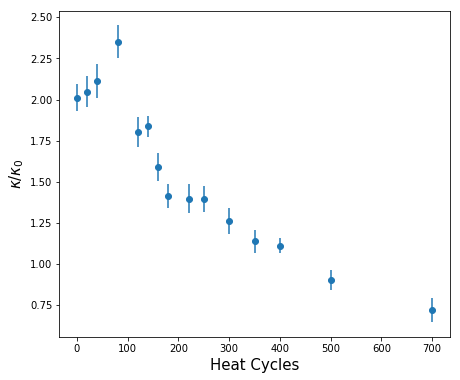

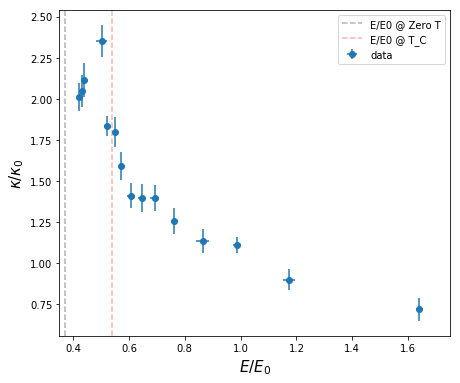

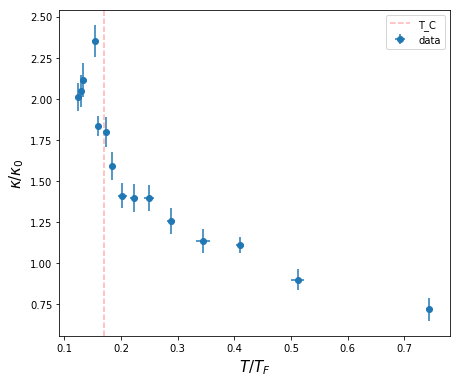

In [894]:

plt.subplots(figsize=(7,6))
plt.errorbar(df_results.heatcycles, df_results.kappa,df_results.kerr,fmt='o')
plt.ylabel(r'$\kappa/\kappa_0$', fontsize=15)
plt.xlabel(r'Heat Cycles', fontsize=15)
plt.savefig('Aug15figures/kappa vs heatcycles.png')
plt.show()

plt.subplots(figsize=(7,6))
plt.errorbar(df_results.EE0, df_results.kappa, xerr=df_results.EE0err, yerr=df_results.kerr,fmt='o', label='data')
plt.ylabel(r'$\kappa/\kappa_0$', fontsize=15)
plt.xlabel(r'$E/E_0$', fontsize=15)
plt.axvline(0.37, linestyle='--', color='k', alpha=0.3, label='E/E0 @ Zero T')
plt.axvline(0.54, linestyle='--', color='r', alpha=0.3, label='E/E0 @ T_C')
plt.xlim([0.35,1.75])
plt.legend()
plt.savefig('Aug15figures/kappa vs EE0.png')
plt.show()


plt.subplots(figsize=(7,6))
plt.errorbar(df_results.Temperature, df_results.kappa, xerr = [df_results.Terrminus, df_results.Terrplus], yerr=df_results.kerr,fmt='o', label='data')
plt.ylabel(r'$\kappa/\kappa_0$', fontsize=15)
plt.xlabel(r'$T/T_F$', fontsize=15)
plt.axvline(0.17, linestyle='--', color='r', alpha=0.3, label='T_C')
# plt.xlim([0.35,2])
plt.legend()
plt.savefig('Aug15figures/kappa vs TTF.png')
plt.show()


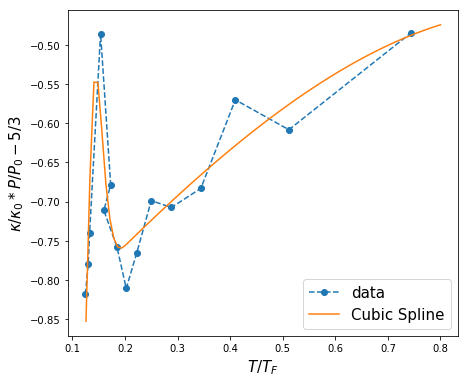

In [408]:
i = np.argsort(df_results.Temperature)
tck = scipy.interpolate.splrep(np.array(df_results.Temperature.tolist())[i], np.array(df_results.EE0*df_results.kappa -5/3)[i], s=0.03)

xnew = np.linspace(0.126,0.8,num=90, endpoint=True)
ynew = scipy.interpolate.splev(xnew, tck, der=0)

plt.subplots(figsize=(7,6))
plt.plot(df_results.Temperature, df_results.EE0*df_results.kappa -5/3,'o--', label='data')
plt.plot(xnew,ynew, label='Cubic Spline')
plt.legend(fontsize=15)
plt.ylabel(r'$\kappa/\kappa_0 * P/P_0 - 5/3$', fontsize=15)
plt.xlabel(r'$T/T_F$',fontsize=15)
plt.savefig('Aug15figures/j-t.png')
plt.show()

In [381]:
np.array(df_results.EE0.tolist()), np.array(df_results.EE0*df_results.kappa -5/3)

(array([ 0.42158698,  0.43257966,  0.4383843 ,  0.50183801,  0.54881703,
         0.52009355,  0.57142827,  0.60600465,  0.64485813,  0.69229014,
         0.76129071,  0.86466412,  0.98590682,  1.1733087 ,  1.64093737]),
 array([-0.81821305063036198, -0.78027872154314915, -0.73991341553950929,
        -0.48569234914754111, -0.67846440976505784, -0.71130699854025292,
        -0.75794410134264789, -0.81073215331860882, -0.7650841125322817,
        -0.69884642442640688, -0.70750295642114758, -0.68320968960759021,
        -0.5702483034775383, -0.60838386571041481, -0.48498982888055497], dtype=object))

# Condensate fraction vs EE0

In [153]:
# Function definition for cond frac 
def get_cond_frac(app, thermal_limits, plot=False, plot_width=50):
    c = tp.Curve(y = np.nansum(app, axis=1))
    using = (c.x <= thermal_limits[0]) | (c.x >= thermal_limits[1])
    c_ = tp.Curve(x = c.x[using], y = c.y[using])
    fr = c_.fit(gaussian, [c_.maxx/2, c_.maxx/8, c_.maxy, c_.maxy/1000], plot=False)[0]
    x, y = c.x, c.y - fr[3]
    fr[3] = 0
    xf, yf = x, gaussian(x, *fr)
    cond_frac = (np.trapz(y, x) - np.trapz(yf, xf))/ np.trapz(y, x)
    
    if plot:
        plt.figure(figsize=(10,4))
        plt.subplot(121)
        plt.imshow(app)
        plt.axhline(thermal_limits[0], color='w', linestyle='--', alpha=0.5)
        plt.axhline(thermal_limits[1], color='w', linestyle='--', alpha=0.5)
        plt.subplot(122)
        plt.title(r'Gaussian Thermal Fit $N_c=${:.2f}'.format(cond_frac))
        plt.plot(*c.plotdata)
        plt.plot(*c_.xyfitplot)
        plt.axvline(thermal_limits[0], color='r', linestyle='--', alpha=0.3)
        plt.axvline(thermal_limits[1], color='r', linestyle='--', alpha=0.3)
        plt.xlim([fr[0] - plot_width, fr[0] + plot_width])
        plt.tight_layout()

    return cond_frac, fr[1]

def g_3half_fitfun(x, x0, mu, kt, n0, offset=0):
    return (1/(2*np.pi*kt)**(3/2))*n0* mpmath.fp.polylog(3/2,np.exp(-np.abs(((x-x0)**2)/2 + np.abs(mu))/kt )) + offset

g32 = np.vectorize(g_3half_fitfun)

def get_cond_frac_polylog(app, thermal_limits, plot=False, plot_width=50):
    c = tp.Curve(y = np.nansum(app, axis=1))
    using = (c.x <= thermal_limits[0]) | (c.x >= thermal_limits[1])
    c_ = tp.Curve(x = c.x[using], y = c.y[using])
    fr = c_.fit(g32, [c_.maxx/2, 0.1, 1e3, 4e8,0], plot=False)[0]
    x, y = c.x, c.y - fr[4]
    fr[4] = 0
    xf, yf = x, g32(x, *fr)
    cond_frac = (np.trapz(y, x) - np.trapz(yf, xf))/ np.trapz(y, x)
    
    if plot:
        plt.figure(figsize=(10,4))
        plt.subplot(121)
        plt.imshow(app)
        plt.axhline(thermal_limits[0], color='w', linestyle='--', alpha=0.5)
        plt.axhline(thermal_limits[1], color='w', linestyle='--', alpha=0.5)
        plt.subplot(122)
        plt.title(r'Polylog Thermal Fit $N_c=${:.2f}'.format(cond_frac))
        plt.plot(*c.plotdata)
        plt.plot(*c_.xyfitplot)
        plt.axvline(thermal_limits[0], color='r', linestyle='--', alpha=0.3)
        plt.axvline(thermal_limits[1], color='r', linestyle='--', alpha=0.3)
        plt.xlim([fr[0] - plot_width, fr[0] + plot_width])
        plt.tight_layout()

    return cond_frac, fr[2]

def get_cond_frac_mixed(app, thermal_limits, plot=False, plot_width=50):
    c = tp.Curve(y = np.nansum(app, axis=1))
    using = (c.x <= thermal_limits[0]) | (c.x >= thermal_limits[1])
    c_ = tp.Curve(x = c.x[using], y = c.y[using])
    
    # first fit a gaussian
    fr = c_.fit(gaussian, [c_.maxx/2, c_.maxx/8, c_.maxy, c_.maxy/1000], plot=False)[0]
    x, y = c.x, c.y - fr[3]
    fr[3] = 0
    xf, yf = x, gaussian(x, *fr)
    cond_frac = (np.trapz(y, x) - np.trapz(yf, xf))/ np.trapz(y, x)
    fit_method = 'Gaussian'
    Tstar = fr[1]
    c_fit = c_
    
    # if it's narrow enough, fit a polylog
    if fr[1] <= 39:
        c_p = tp.Curve(x = c.x[using], y = c.y[using])
        fr = c_p.fit(g32, [c_p.maxx/2, 0.1, 1e3, 4e8,0], plot=False)[0]
        x, y = c.x, c.y - fr[4]
        fr[4] = 0
        xf, yf = x, g32(x, *fr)
        cond_frac = (np.trapz(y, x) - np.trapz(yf, xf))/ np.trapz(y, x)
        fit_method = 'PolyLog'
        Tstar = fr[2]
        c_fit = c_p
        
    if cond_frac>0.3:
        thermal_limits = np.array(thermal_limits)+[-5,5]
        using = (c.x <= thermal_limits[0]) | (c.x >= thermal_limits[1])
        c_p = tp.Curve(x = c.x[using], y = c.y[using])
        fr = c_p.fit(g32, [c_p.maxx/2, 0.1, 1e3, 4e8,0], plot=False)[0]
        x, y = c.x, c.y - fr[4]
        fr[4] = 0
        xf, yf = x, g32(x, *fr)
        cond_frac = (np.trapz(y, x) - np.trapz(yf, xf))/ np.trapz(y, x)
        fit_method = 'PolyLog'
        Tstar = fr[2]
        c_fit = c_p
        

    
    if plot:
        fig, axarr = plt.subplots(ncols=2, figsize=(10,4))
        axarr[0].imshow(app)
        axarr[0].axhline(thermal_limits[0], color='w', linestyle='--', alpha=0.5)
        axarr[0].axhline(thermal_limits[1], color='w', linestyle='--', alpha=0.5)
        axarr[0].set_title('Raw Rapid Ramp')
        
        axarr[1].set(title=r'$N_c=${:.2f}'.format(cond_frac), xlim=[fr[0] - plot_width, fr[0] + plot_width])
        axarr[1].plot(*c.plotdata,'r-', linewidth=2, alpha=0.6, label='data')
        axarr[1].plot(*c_.xyfitplot, 'k--', alpha=0.5, linewidth=1 , label='Gaussian thermal fit')
        if fit_method=='PolyLog':
            axarr[1].plot(*c_p.xyfitplot, 'k-', linewidth=1 , label='Polylog thermal fit')
            
        axarr[1].axvspan(*thermal_limits, alpha=0.05, color='k', label='Excluded from fit')
        plt.legend()
        plt.tight_layout()
        
    
        
    return cond_frac, Tstar, c_fit, c


CAN'T FIT, Returning Original Guess: Details of Error polylog for arbitrary s and z
##______Fit Value______Error______
 0 ==>     166.0 (+-)     166.0
 1 ==>     1e+03 (+-)     1e+03
 2 ==>     1e+03 (+-)     1e+03
 3 ==>     5e+08 (+-)     5e+08


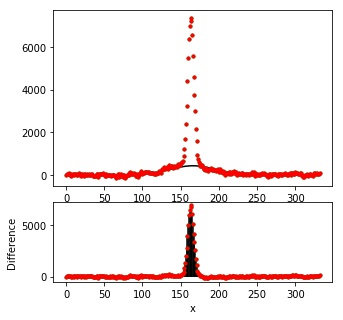

In [112]:
c_ = tp.Curve(y=np.nansum(df.image.iloc[test].app, axis=1))
fr = c_.fit(g32, [c_.maxx/2, 1e3, 1e3, 5e8], plot=True)[0]

## Import the entire dataset

In [18]:
# Initialize Dataframe
df = get_from_clipboard(init=True)
var = ['TOF','SideGreenEvap','SpectVolt', 'SeqMode', 'HeatCycles','Axial Grad Volt', 'ExpansionTime']
x_var = 'HeatCycles'

fudge = 1.66
trap_f = 23.3

# Import from Clipboard
df_full = get_from_clipboard(df=df, init=False, var=var, x_var=x_var, image_func=tp.Image, using=2)

# Define Settings
settings_side = {**default_settings, 
            **dict(center_x = 118, center_y = 378, width=140, height=140, od_method='log', Isat=9e9, 
                   pixel=5.1e-6, sigmaf=0.5, fudge=1, bg_width=10,subsample=1, bg_order=1)}

settings_top_insitu = {**default_settings, 
            **dict(center_x = 1182, center_y=1380, width=500, height=500, 
               subsample=3, rotate=0, rotate_method='bilinear',
               bg_width=20, bg_order=1, bad_light=0, Isat=77, time=10, 
               pixel=0.7e-6, od_method='table', sigmaf=0.5, 
               memory_saver=True, 
               fudge=fudge, ellipticity=1,
               xsec_extension='poly0', xsec_slice_width=4, xsec_fit_range=1,
               trap_f=trap_f, radial_selection=0.5, kind='ideal', Tfit_lim=0.06, Tfit_guess_kT=0.1, Tfit_guess_mu0=3, 
               )}

settings_rapid_ramp = {**default_settings, 
            **dict(center_x = 1100, center_y = 1380, width = 1700, height = 1000, 
                   rotate = 5)}

settings_top_piv = {**default_settings, 
            **dict(center_x = 1162, center_y = 1354, width=1000, height=1000, fudge=fudge)}
settings_expansion = {**default_settings, 
            **dict(center_x = 1190, center_y = 1340, width = 500, height = 1100, fudge=fudge)}

    
# Apply settings    
for i, r in df.iterrows():
    if r['SeqMode'] == 15:
        if r['name'][-1]=='A':
            df.loc[i,'image'] = tp.Hybrid_Image(name=r['name'])
            df.loc[i,'image'].set(**settings_top_insitu)
        else:
            r.image.set(**settings_top_piv)
    elif r['SeqMode'] == 14:
        df.loc[i,'image'] = tp.Hybrid_Image(name=r['name'])
        df.loc[i,'image'].set(**settings_expansion)
    elif r['SeqMode'] == 17:
        r.image.set(**settings_rapid_ramp)
        
# df = df_full

## Try for a single value

In [9]:
print(np.unique(df_full.HeatCycles.tolist()))

[   0.   20.   40.   80.  100.  110.  120.  130.  140.  150.  155.  160.
  170.  180.  190.  200.  220.  250.  300.  350.  400.  500.  700.]


In [109]:
# Select the heat:
heat=0
df = df_full[(df_full.HeatCycles==heat) &(df_full.SeqMode==17)]
# Atom number
df['total_atoms'] = [im.total_atoms for im in tqdm(df.image)]
nums = df['total_atoms'].values

df.head()

,name,image,shot,x,TOF,SideGreenEvap,SpectVolt,SeqMode,HeatCycles,Axial Grad Volt,ExpansionTime,total_atoms
36,08-15-2017_19_49_59_TopA,<therpy.classes.Image object at 0x0000018800AC...,18.0,0.0,0.0,0.2,1.5,17.0,0.0,0.08,2000.0,105236.456709
37,08-15-2017_19_49_59_TopB,<therpy.classes.Image object at 0x0000018800AC...,18.5,0.0,0.0,0.2,1.5,17.0,0.0,0.08,2000.0,23390.918179


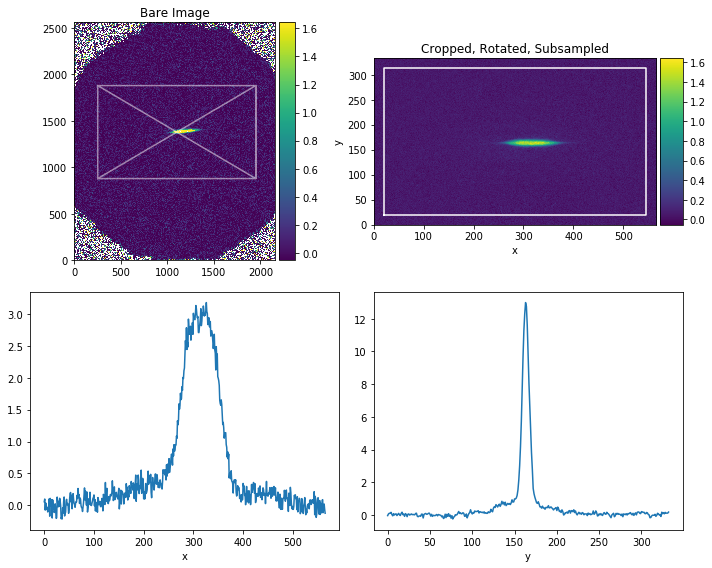

7.30215624682


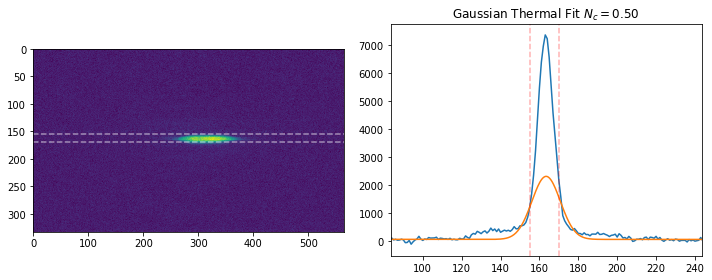

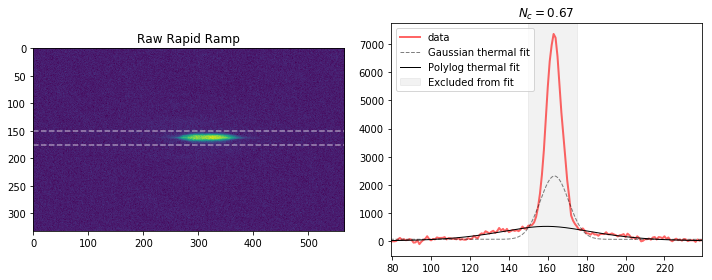

In [110]:

# Test
test = 0
ax = plt.subplots(ncols=2, nrows=2, figsize=(10, 8))[1].flatten()
df.image.iloc[test].plot_crop(ax=ax[0:2])
ax[1].set(xlabel='x', ylabel='y')
ax[2].plot(np.nanmean(df.image.iloc[test].app, axis=0))
ax[3].plot(np.nanmean(df.image.iloc[test].app, axis=1))
ax[2].set(xlabel='x')
ax[3].set(xlabel='y')
plt.tight_layout()
plt.show()

thermal_limits = [155,170]
plot_width = 80

print(get_cond_frac(df.image.iloc[test].app, thermal_limits, True, plot_width)[1])
# _ = get_cond_frac_polylog(df.image.iloc[test].app, thermal_limits, True, plot_width)
testout = get_cond_frac_mixed(df.image.iloc[test].app, thermal_limits, True, plot_width)
# plt.savefig('Aug15figures/sampleRR.png')

In [40]:
testout[2:]

(<therpy.classes.Curve at 0x18803510908>,
 <therpy.classes.Curve at 0x1886a92d780>)

In [465]:
df.total_atoms.iloc[0]

108513.06925608721

In [433]:
# Fit for cond frac 
fit_results = [get_cond_frac(im.app, thermal_limits) for im in df.image[::2]]
fit_results = np.array(fit_results)
cond_frac = np.nanmean(fit_results[:,0])
print(cond_frac)

0.349310902194


## Filter and process all data

In [19]:
allheats = np.unique(df_full.HeatCycles.tolist())
df_results = pd.DataFrame(columns=['heatcycles', 'cond_frac', 'EE0', 'EE0err', 'Tstar'])
df_results['heatcycles'] = allheats



        Total Loaded Images 1
        Atom Num Filter     1
        Removed Images      0
        


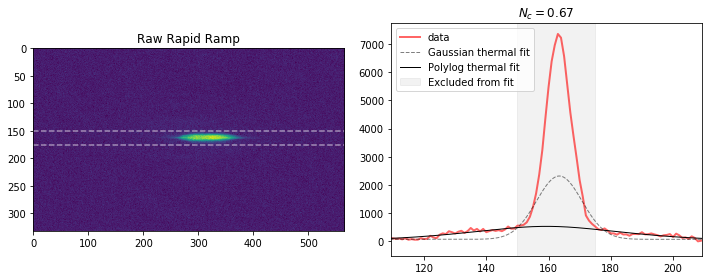

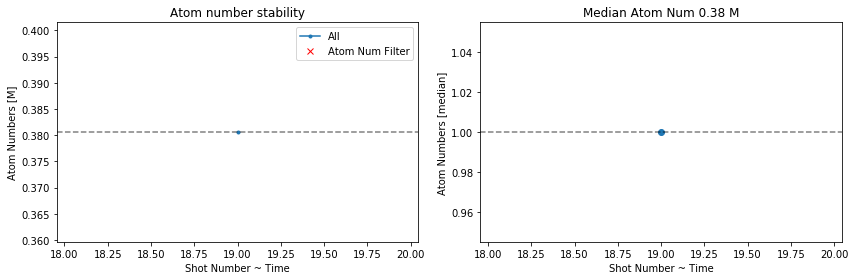

E/E0 from EoS fit : 0.533 +- 0.000
T/TF from EoS fit : 0.130 +- 0.000


        Total Loaded Images 1
        Atom Num Filter     1
        Removed Images      0
        


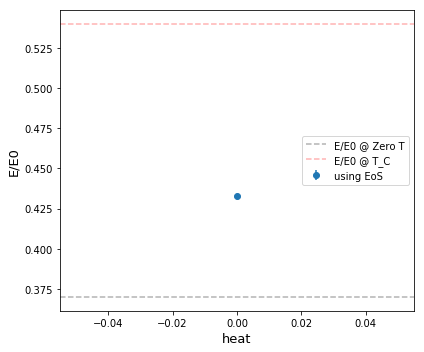

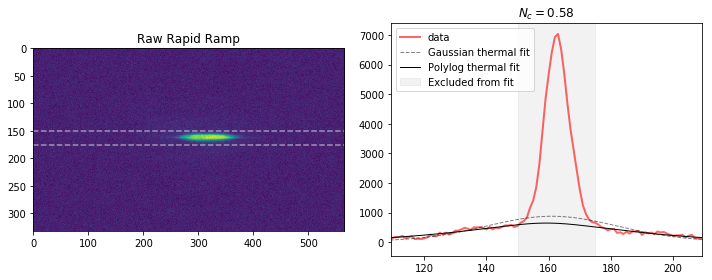

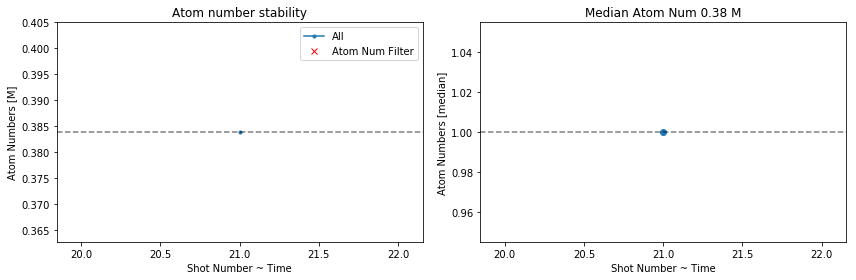

E/E0 from EoS fit : 0.553 +- 0.000
T/TF from EoS fit : 0.139 +- 0.000


        Total Loaded Images 1
        Atom Num Filter     1
        Removed Images      0
        


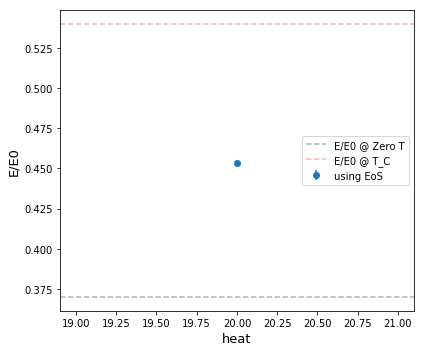

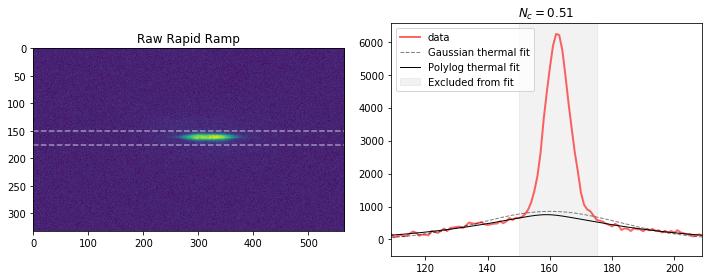

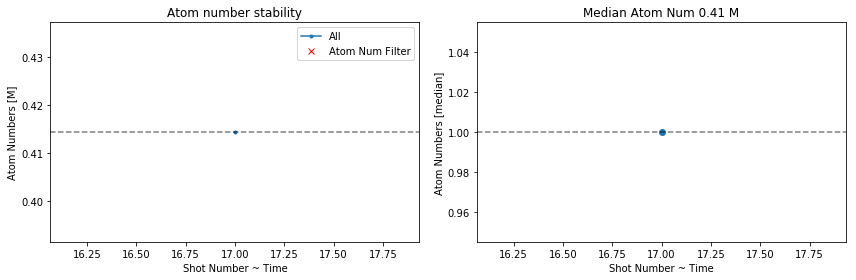

E/E0 from EoS fit : 0.521 +- 0.000
T/TF from EoS fit : 0.125 +- 0.000


        Total Loaded Images 1
        Atom Num Filter     1
        Removed Images      0
        


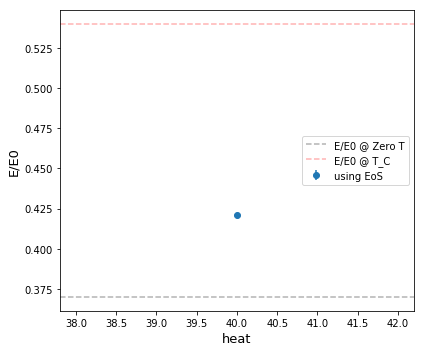

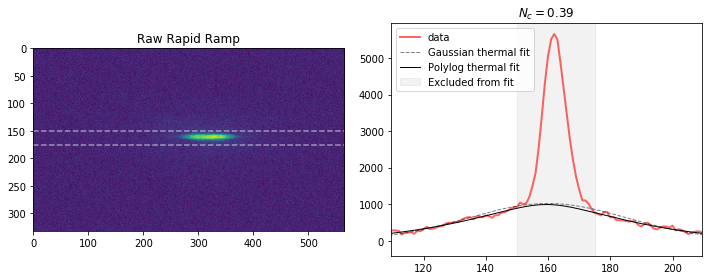

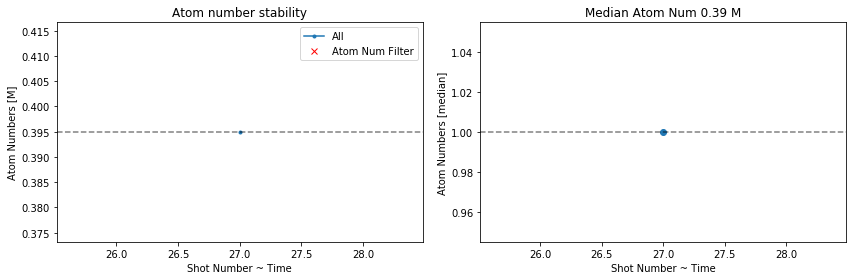

E/E0 from EoS fit : 0.586 +- 0.000
T/TF from EoS fit : 0.149 +- 0.000


        Total Loaded Images 1
        Atom Num Filter     1
        Removed Images      0
        


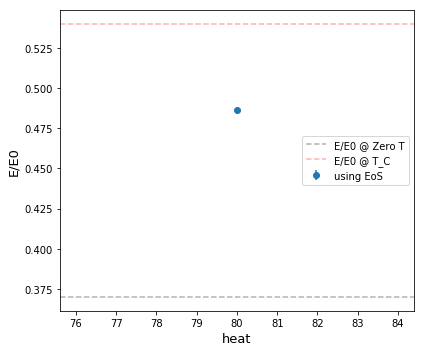

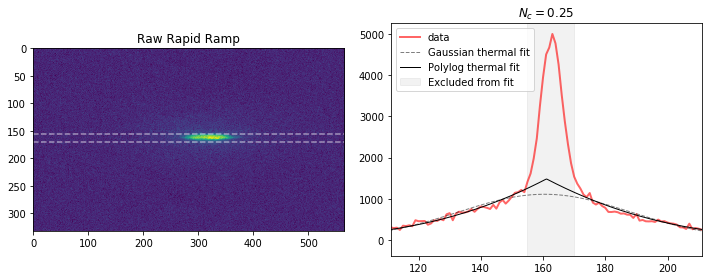

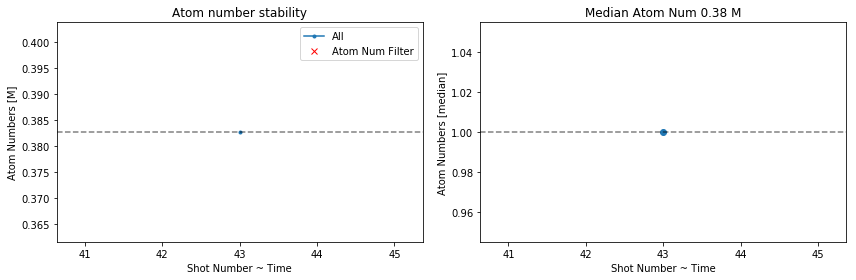

E/E0 from EoS fit : 0.606 +- 0.000
T/TF from EoS fit : 0.155 +- 0.000


        Total Loaded Images 1
        Atom Num Filter     1
        Removed Images      0
        


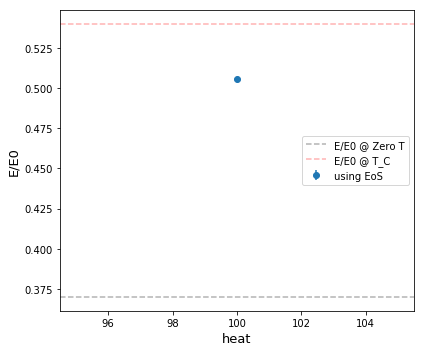

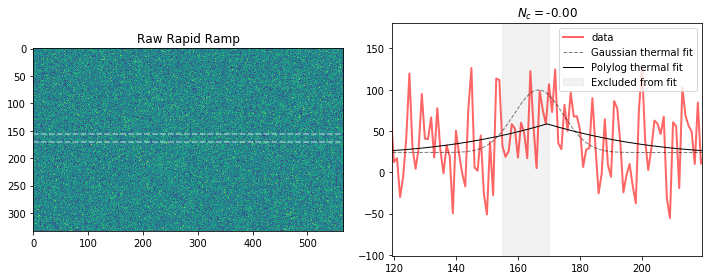

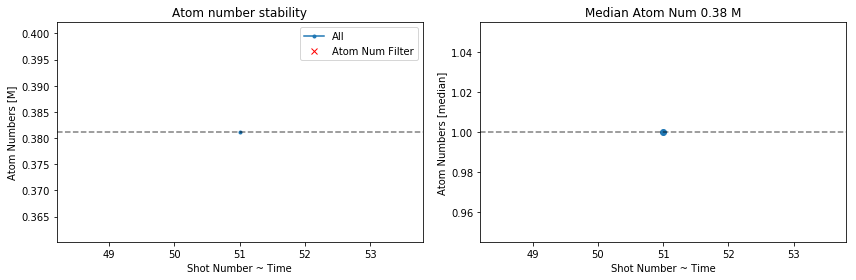

E/E0 from EoS fit : 0.649 +- 0.000
T/TF from EoS fit : 0.173 +- 0.000


        Total Loaded Images 2
        Atom Num Filter     2
        Removed Images      0
        


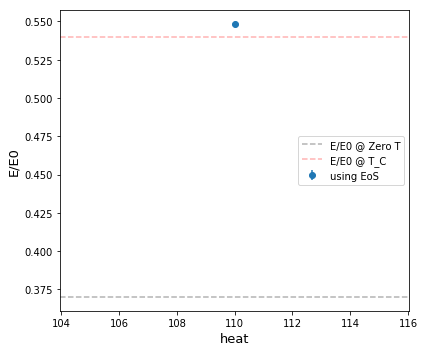

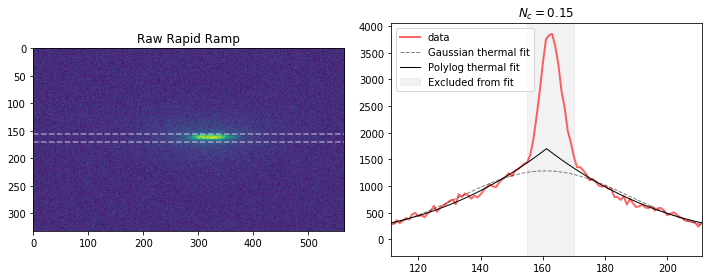

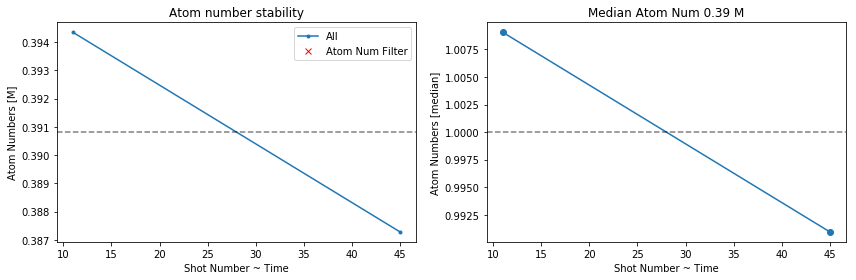

E/E0 from EoS fit : 0.623 +- 0.004
T/TF from EoS fit : 0.161 +- 0.003


        Total Loaded Images 1
        Atom Num Filter     1
        Removed Images      0
        


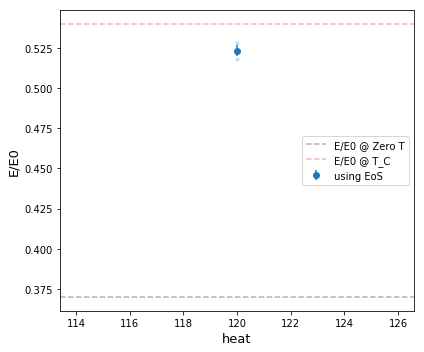

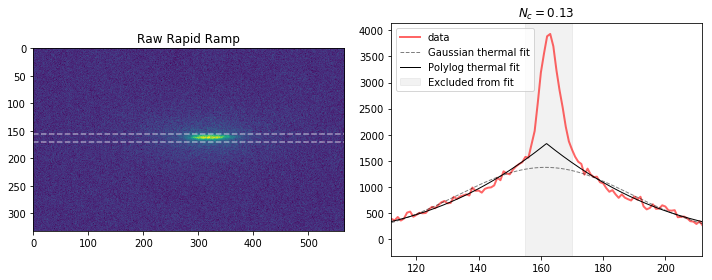

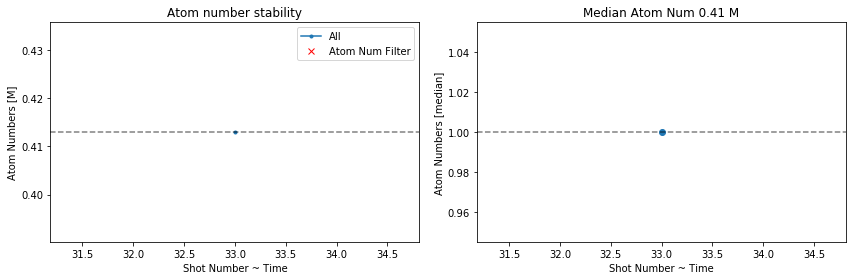

E/E0 from EoS fit : 0.624 +- 0.000
T/TF from EoS fit : 0.162 +- 0.000


        Total Loaded Images 2
        Atom Num Filter     2
        Removed Images      0
        


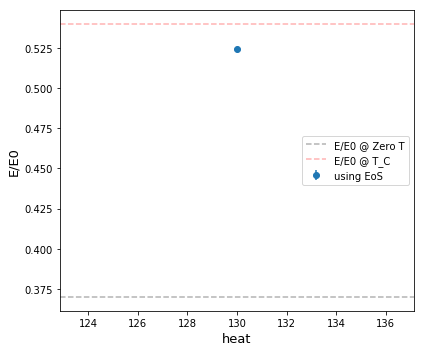

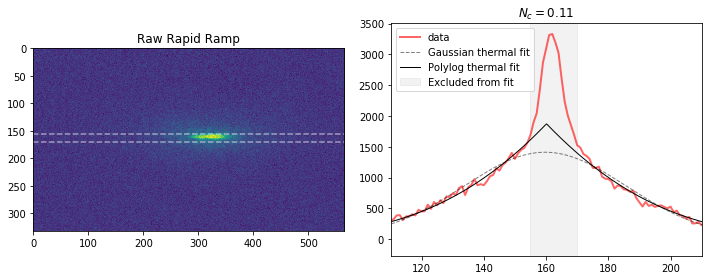

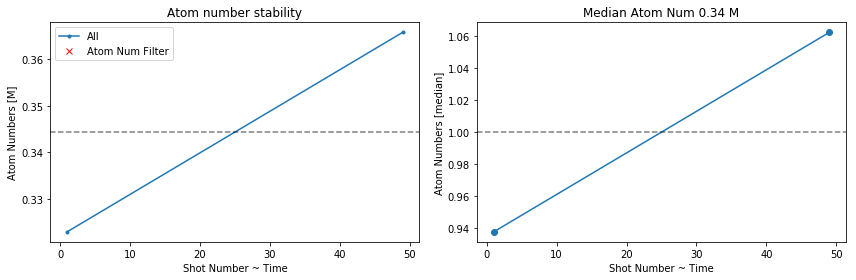

E/E0 from EoS fit : 0.708 +- 0.031
T/TF from EoS fit : 0.203 +- 0.031


        Total Loaded Images 2
        Atom Num Filter     2
        Removed Images      0
        


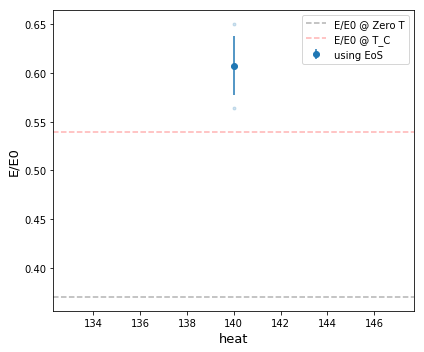

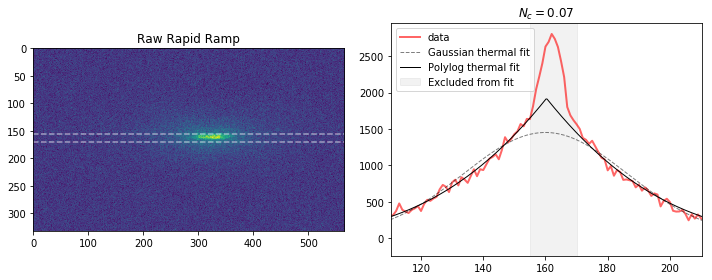

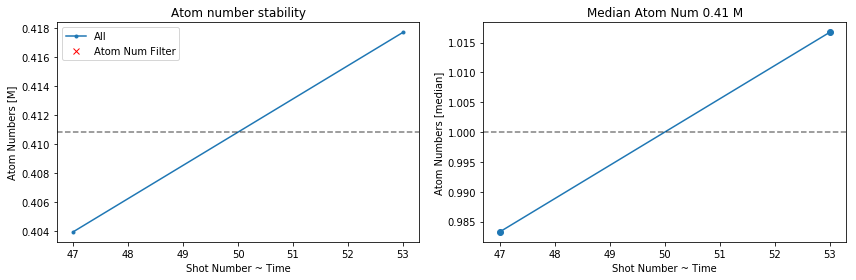

E/E0 from EoS fit : 0.636 +- 0.009
T/TF from EoS fit : 0.167 +- 0.009


        Total Loaded Images 1
        Atom Num Filter     1
        Removed Images      0
        


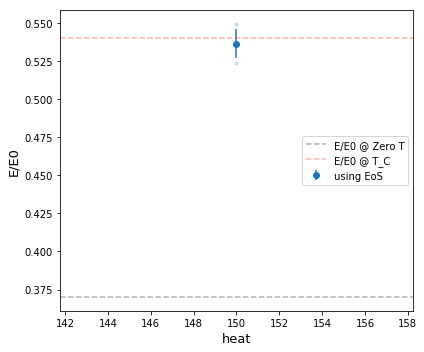

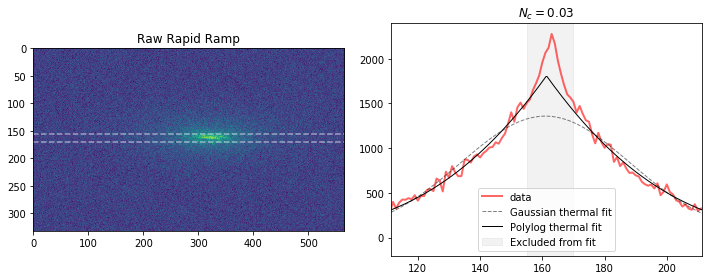

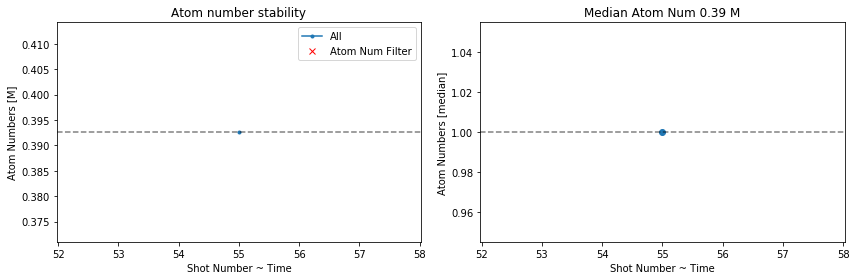

E/E0 from EoS fit : 0.651 +- 0.000
T/TF from EoS fit : 0.174 +- 0.000


        Total Loaded Images 3
        Atom Num Filter     3
        Removed Images      0
        


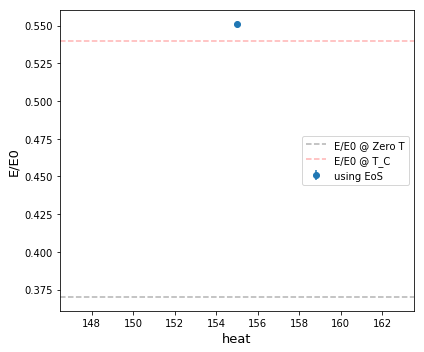

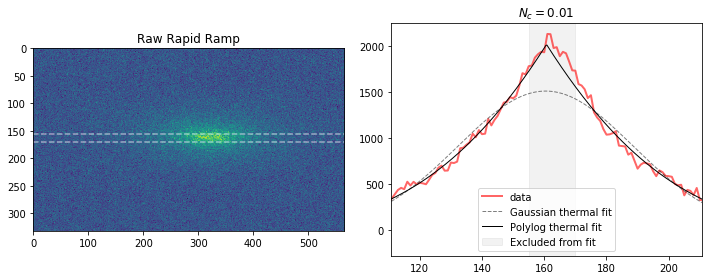

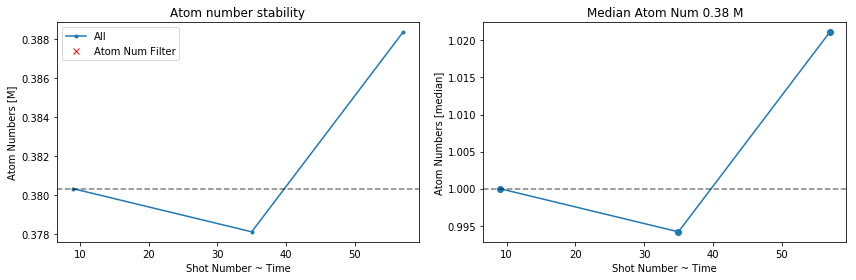

E/E0 from EoS fit : 0.693 +- 0.009
T/TF from EoS fit : 0.196 +- 0.009


        Total Loaded Images 1
        Atom Num Filter     1
        Removed Images      0
        


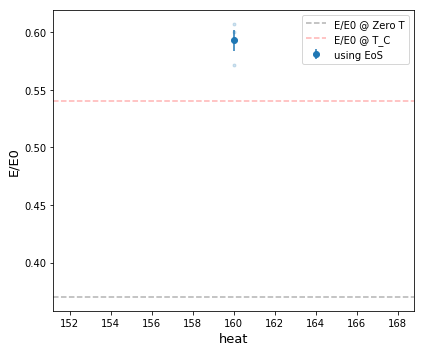

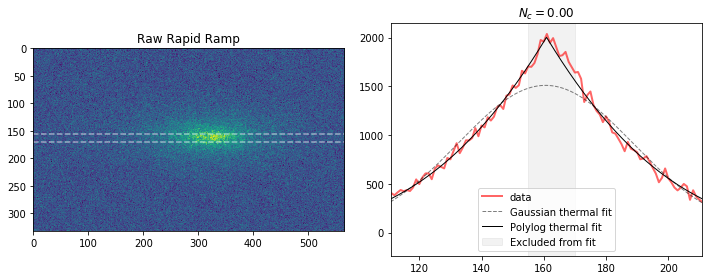

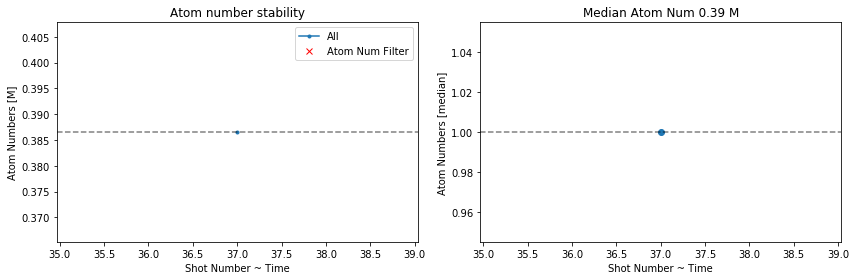

E/E0 from EoS fit : 0.679 +- 0.000
T/TF from EoS fit : 0.189 +- 0.000


        Total Loaded Images 2
        Atom Num Filter     2
        Removed Images      0
        


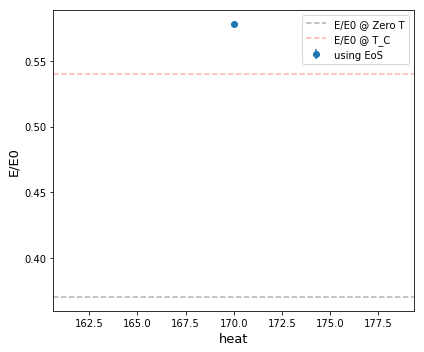

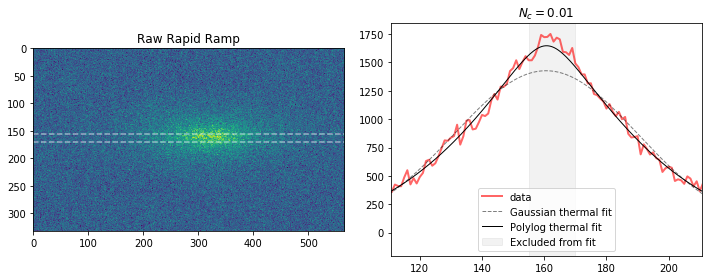

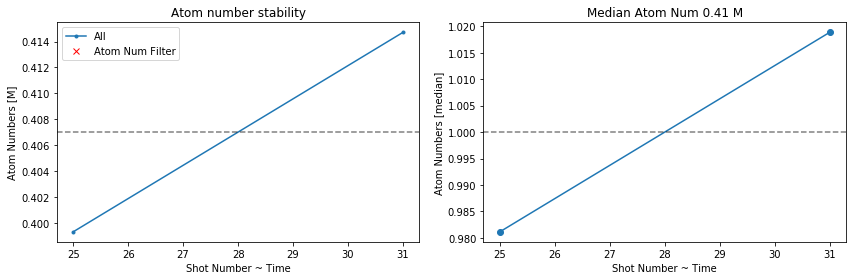

E/E0 from EoS fit : 0.697 +- 0.003
T/TF from EoS fit : 0.198 +- 0.003


        Total Loaded Images 1
        Atom Num Filter     1
        Removed Images      0
        


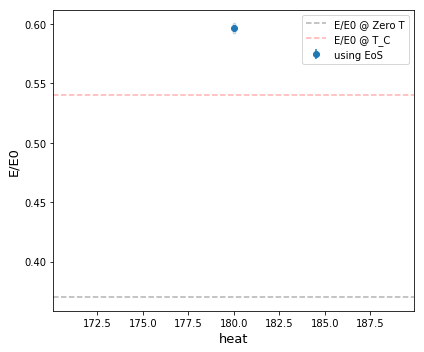

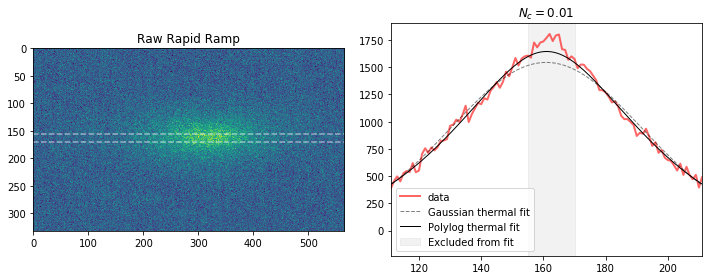

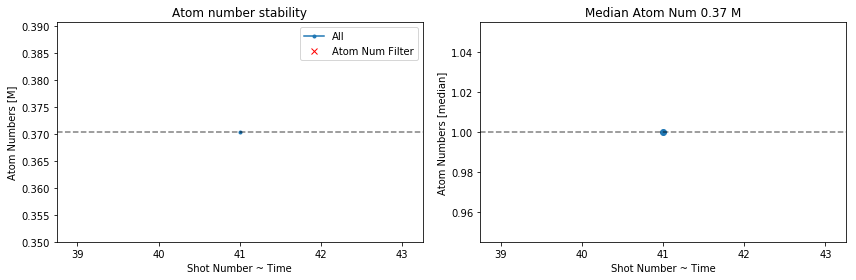

E/E0 from EoS fit : 0.731 +- 0.000
T/TF from EoS fit : 0.215 +- 0.000


        Total Loaded Images 1
        Atom Num Filter     1
        Removed Images      0
        


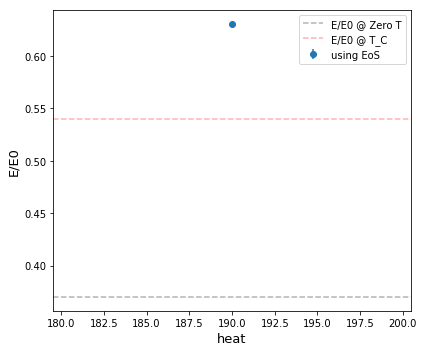

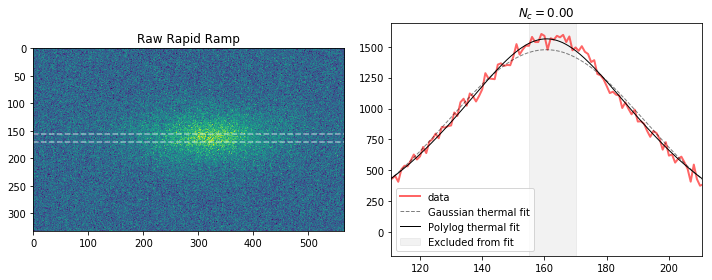

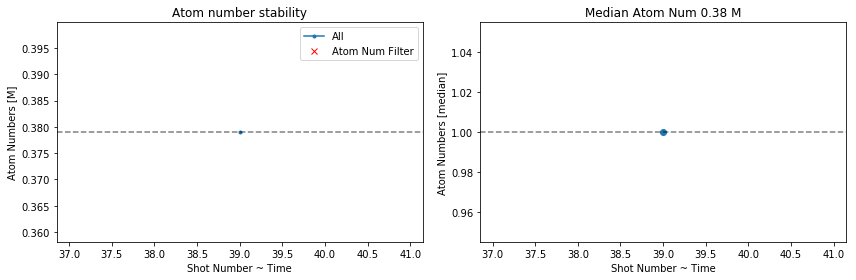

E/E0 from EoS fit : 0.718 +- 0.000
T/TF from EoS fit : 0.208 +- 0.000


        Total Loaded Images 1
        Atom Num Filter     1
        Removed Images      0
        


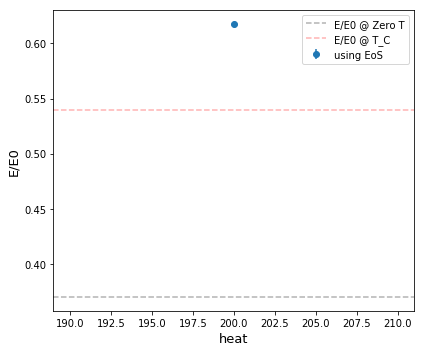

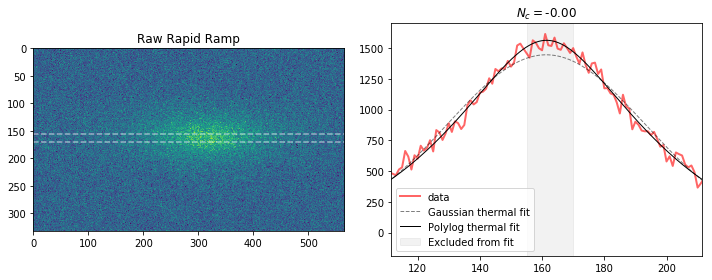

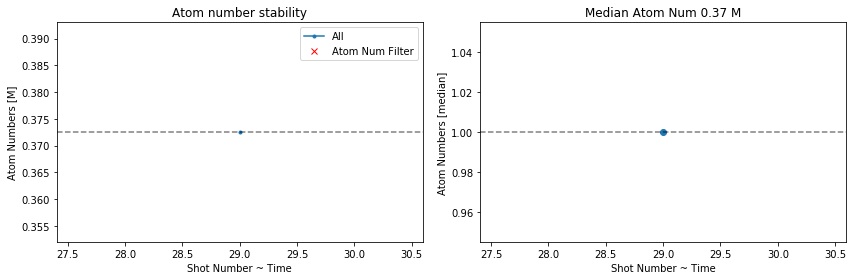

E/E0 from EoS fit : 0.771 +- 0.000
T/TF from EoS fit : 0.237 +- 0.000


        Total Loaded Images 1
        Atom Num Filter     1
        Removed Images      0
        


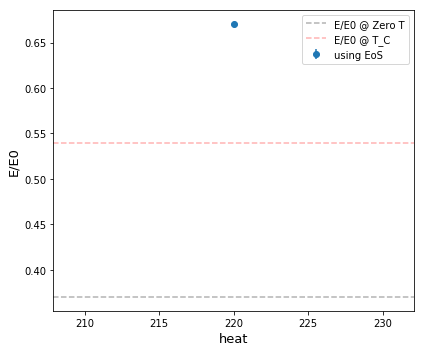

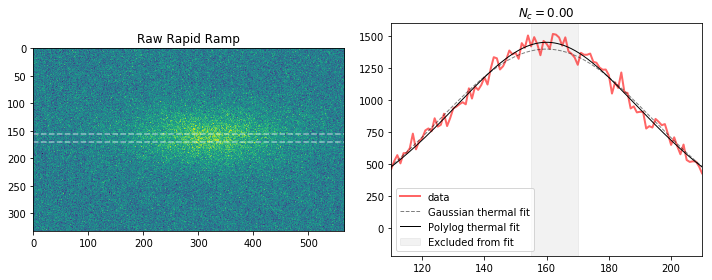

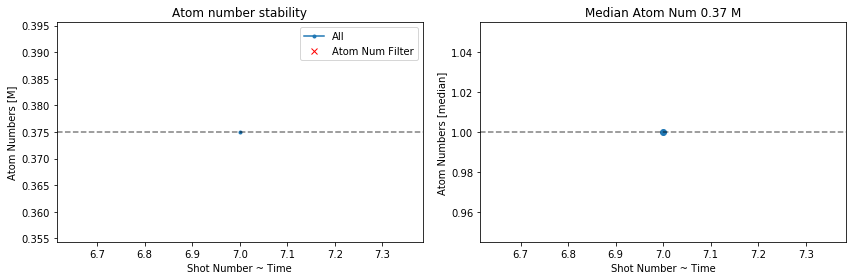

E/E0 from EoS fit : 0.836 +- 0.000
T/TF from EoS fit : 0.274 +- 0.000


        Total Loaded Images 1
        Atom Num Filter     1
        Removed Images      0
        


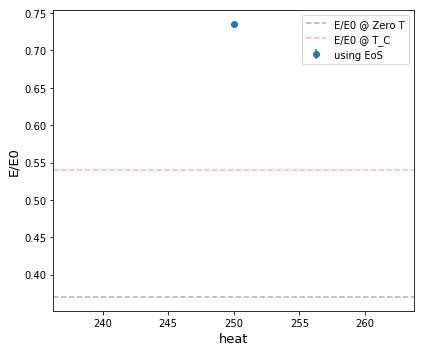

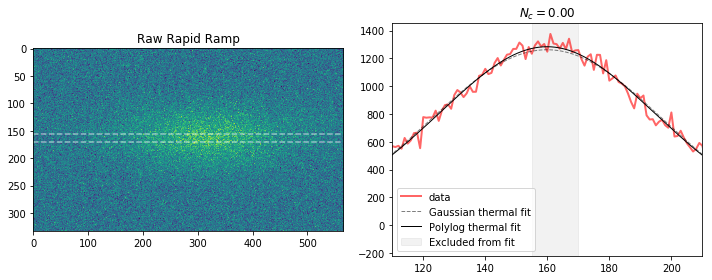

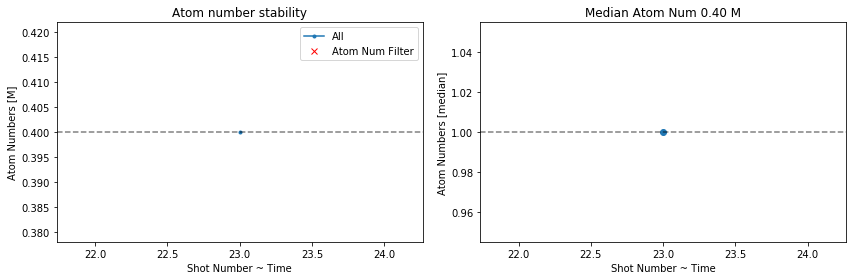

E/E0 from EoS fit : 0.884 +- 0.000
T/TF from EoS fit : 0.301 +- 0.000


        Total Loaded Images 1
        Atom Num Filter     1
        Removed Images      0
        


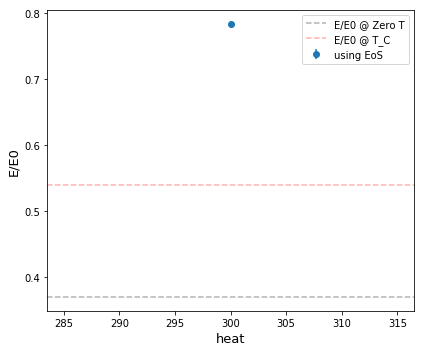

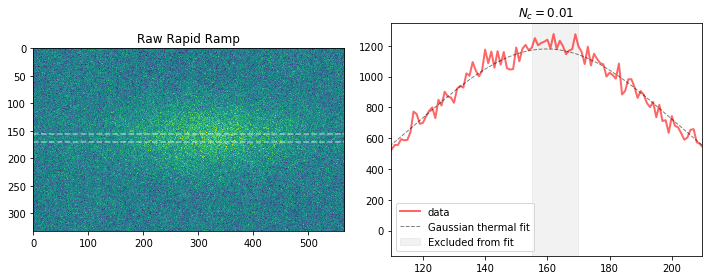

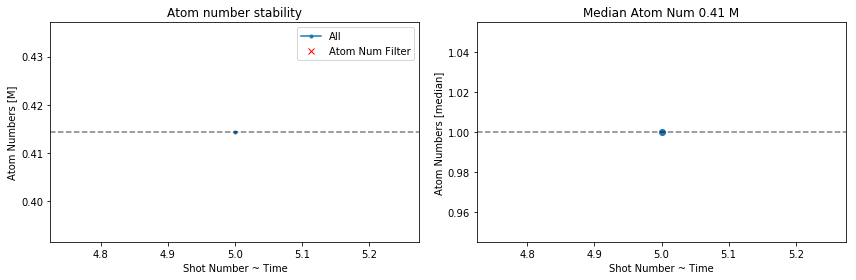

E/E0 from EoS fit : 0.968 +- 0.000
T/TF from EoS fit : 0.346 +- 0.000


        Total Loaded Images 1
        Atom Num Filter     1
        Removed Images      0
        


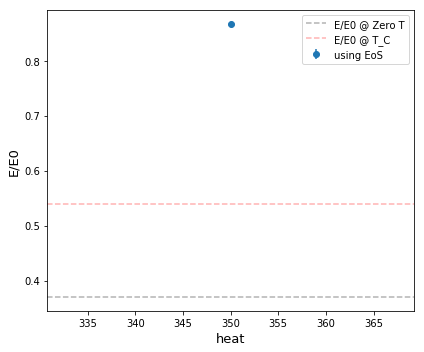

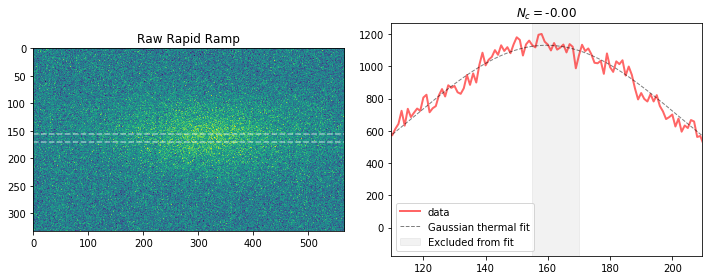

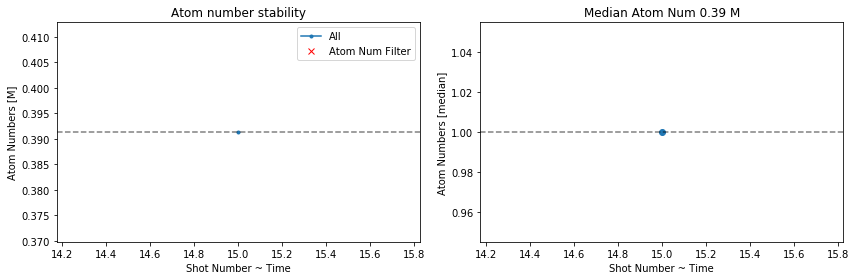

E/E0 from EoS fit : 1.120 +- 0.000
T/TF from EoS fit : 0.428 +- 0.000


        Total Loaded Images 1
        Atom Num Filter     1
        Removed Images      0
        


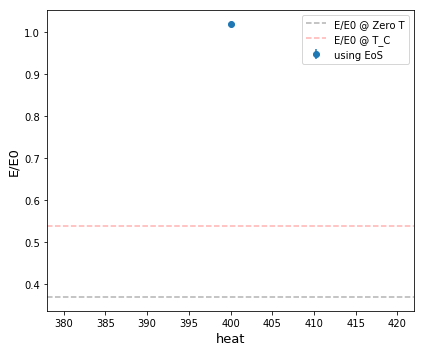

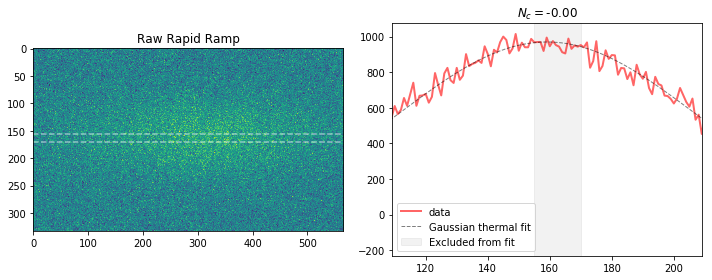

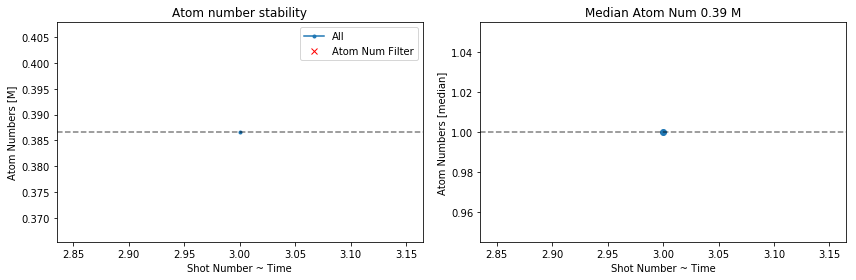

E/E0 from EoS fit : 1.379 +- 0.000
T/TF from EoS fit : 0.566 +- 0.000


        Total Loaded Images 1
        Atom Num Filter     1
        Removed Images      0
        


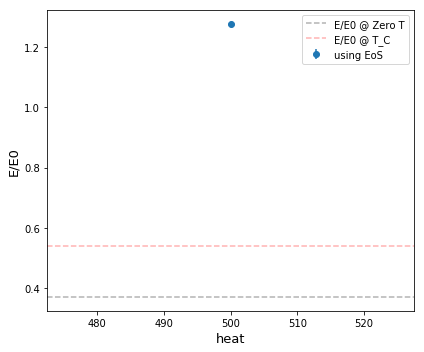

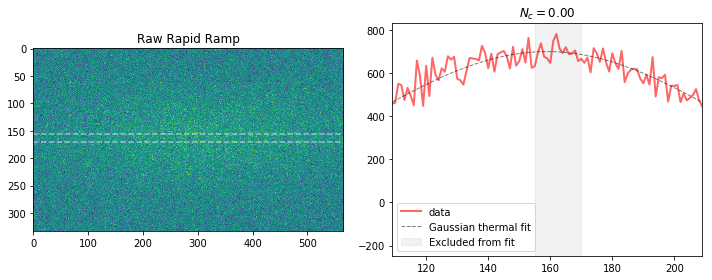

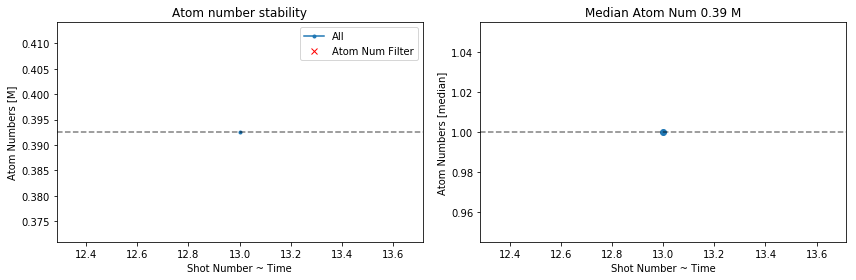

E/E0 from EoS fit : 1.685 +- 0.000
T/TF from EoS fit : 0.716 +- 0.000


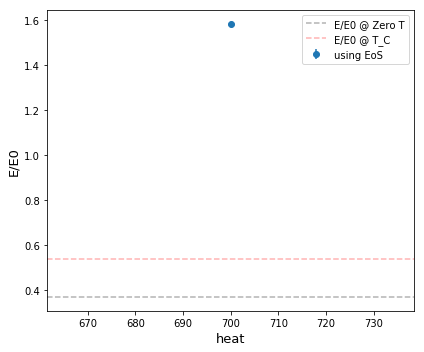

In [174]:
box_volume = cst.pi * (59.5e-6)**2 * (87e-6) 
fontsize=13
xlabel='heat'
method = 'mixed'

for dfindex,r in df_results.iterrows():
    heat = r['heatcycles']
    
    df = df_full[(df_full.HeatCycles==heat) &(df_full.SeqMode==17)]
    # Atom number
    df['total_atoms'] = [im.total_atoms for im in tqdm(df.image)]
    
    # Fit for cond frac
    if method == 'mixed':
        fit_results = np.array([get_cond_frac_mixed(im.app, thermal_limits, plot=False)[0:2] for im in df.image[::2]])
    elif method == 'gaussian':
        fit_results = np.array([get_cond_frac(im.app, thermal_limits, plot=False)[0:2] for im in df.image[::2]])
    
    cond_frac = np.nanmean(fit_results[:,0])
    Tstar = np.nanmean(fit_results[:,1])
    
    c_fit, c = get_cond_frac_mixed(df.iloc[0].image.app, thermal_limits, plot=True)[2:]
    
    # Set blank images to nan
    if np.nanmean(df.total_atoms)<1e4:
        cond_frac = np.nan
        Tstar = np.nan
    
    # Put it in the results dataframe
    df_results.loc[dfindex,'cond_frac'] = cond_frac
    df_results.loc[dfindex,'Tstar'] = Tstar
    df_results.loc[dfindex,'RR_fit'] = c_fit
    df_results.loc[dfindex,'RR'] = c
    
#     # Thermometry:
    df = pd.DataFrame()
    df = df_full[(df_full.SeqMode==14)& (df_full.HeatCycles==heat)& (df_full['name'].str.contains('TopA'))].reset_index()
    
    zlim_second_moment = np.array([10, 200, df.image.iloc[0].nz.maxx*1e6])
    kHz = 1e3 * cst.h
    prefactor = 2 * cst.mass * df.image.iloc[0].trap_w**2

    # Atom Number Filter
    df['total_atoms'] = np.array([np.nansum(im.app) for im in df.image])
    using = atom_num_filter(df, keep=0.3, offset=0.0, plot=True)
    plt.show()

    # Compute E/N for good images
    EN_eos = np.array([hybrid_E_N(im.T_kHz * kHz, im.mu0_kHz * kHz, im.trap_f) for im in df.image[using]])
#     EN_moment = np.array([prefactor * compute_moment_v2(im.nz, zlim_second_moment) for im in df.image[using]])

    # Bin Data
    EN_eos = bin_data(df.x.values[using], EN_eos)
#     EN_moment = bin_data(df.x.values[using], EN_moment)
    total_atoms = bin_data(df.x.values[using], df.total_atoms.values[using])
    
    # Get energies
    hybrid_heating_compensation = 5.0e-5 * df.ExpansionTime.iloc[0]
    E_E0 = 5/3 * EN_eos[5] / cst.n2EF(total_atoms[5] / box_volume)
    E_E0_eos = bin_data(EN_eos[4], E_E0)
    corrected_EE0 = E_E0_eos[1]-hybrid_heating_compensation
    Emax = corrected_EE0 + E_E0_eos[2]
    Emin = corrected_EE0 - E_E0_eos[2]
    xdata = E_E0_eos[0]
    Tdata = [UFG.T_TF_single(x) for x in corrected_EE0]
    Terr = [UFG.T_TF_single(Emax[i])-UFG.T_TF_single(Emin[i]) for i in np.arange(Emax.size)]
    Tdata_raw = [UFG.T_TF_single(x) for x in (E_E0_eos[5]-hybrid_heating_compensation)]
    
    print("E/E0 from EoS fit : {:.3f} +- {:.3f}".format(E_E0_eos[1][0], E_E0_eos[2][0]))
    c = tp.Curve(UFG.df['E/E0'].values, UFG.df['T/T_F'].values)
    print("T/TF from EoS fit : {:.3f} +- {:.3f}".format(Tdata[0], Terr[0]))
    
    # Plot E_E0
    plt.figure(figsize=(6,5))
    E_E0 = 5/3 * EN_eos[5] / cst.n2EF(total_atoms[5] / box_volume)
    E_E0_eos = bin_data(EN_eos[4], E_E0)
    xdata = E_E0_eos[0]
    ydata = E_E0_eos[1]-hybrid_heating_compensation
    yerr = E_E0_eos[2]

    plt.errorbar(xdata, ydata, yerr , fmt='o', label='using EoS')
    plt.plot(E_E0_eos[4], E_E0_eos[5]-hybrid_heating_compensation, '.C0', alpha=0.2)
#     E_E0 = 5/3 * EN_moment[5] / cst.n2EF(total_atoms[5] / box_volume)
    plt.axhline(0.37, linestyle='--', color='k', alpha=0.3, label='E/E0 @ Zero T')
    plt.axhline(0.54, linestyle='--', color='r', alpha=0.3, label='E/E0 @ T_C')
    plt.ylabel('E/E0', fontsize=fontsize)
    plt.xlabel(xlabel, fontsize=fontsize)
    #plt.ylim([0.3,2])
    plt.legend()
    plt.tight_layout()

    # Put in the dataframe
    df_results.loc[dfindex, 'Temperature'] = np.nanmean(Tdata)
    df_results.loc[dfindex, 'Terrplus'] = np.nanmean([UFG.T_TF_single(Emax[i]) for i in np.arange(Emax.size)])-np.nanmean(Tdata)
    df_results.loc[dfindex, 'Terrminus'] =np.nanmean(Tdata)- np.nanmean([UFG.T_TF_single(Emin[i]) for i in np.arange(Emax.size)])
    df_results.loc[dfindex, 'EE0'] = np.nanmean(corrected_EE0)
    df_results.loc[dfindex, 'EE0err'] = np.nanmean(E_E0_eos[2])

In [151]:
# Filter the bad point
df_results.loc[8,'cond_frac']=np.nan

df_results.loc[2,'cond_frac']=np.nan

In [23]:
df_results

,heatcycles,cond_frac,EE0,EE0err,Tstar,Temperature,Terrplus,Terrminus
0,0.0,0.55122,0.43298,0,307.221,0.130468,0.000000,0.000000
1,20.0,0.494032,0.453382,0,1048.4,0.138565,0.000000,0.000000
2,40.0,NaN,0.420792,0,1100.17,0.124511,0.000000,0.000000
3,80.0,0.33404,0.486198,0,1167.18,0.149126,0.000000,0.000000
4,100.0,0.249429,0.505748,0,1315.82,0.154988,0.000000,0.000000
5,110.0,NaN,0.548591,0,NaN,0.172845,0.000000,0.000000
6,120.0,0.163677,0.523114,0.00355266,1235.66,0.161188,0.001430,0.001406
7,130.0,0.130743,0.524249,0,1325.85,0.161644,0.000000,0.000000
8,140.0,NaN,0.607641,0.0305062,1188.54,0.203317,0.015686,0.015387
9,150.0,0.062058,0.536341,0.00925858,1251.48,0.166802,0.004509,0.004018


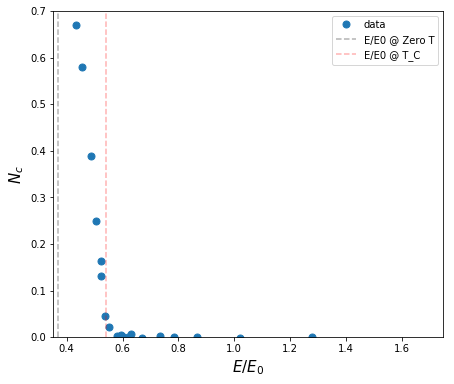

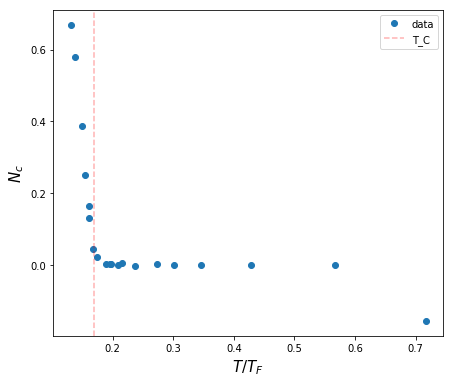

In [152]:
plt.subplots(figsize=(7,6))
plt.plot(df_results.EE0.tolist(), df_results.cond_frac.tolist(),'o', markersize=7, label='data')
plt.ylabel(r'$N_c$', fontsize=15)
plt.xlabel(r'$E/E_0$', fontsize=15)
plt.axvline(0.37, linestyle='--', color='k', alpha=0.3, label='E/E0 @ Zero T')
plt.axvline(0.54, linestyle='--', color='r', alpha=0.3, label='E/E0 @ T_C')
plt.xlim([0.35,1.75])
plt.ylim([-0.0,0.7])
plt.legend()
# plt.title('From Polylog thermal fits')
plt.savefig('Aug15figures/RR_polylogfit_vsee0.png')
plt.show()

plt.subplots(figsize=(7,6))
plt.plot(df_results.Temperature, df_results.cond_frac,'o', label='data')
plt.ylabel(r'$N_c$', fontsize=15)
plt.xlabel(r'$T/T_F$', fontsize=15)
plt.axvline(0.17, linestyle='--', color='r', alpha=0.3, label='T_C')
# plt.xlim([0,0.7])
plt.legend()
plt.show()


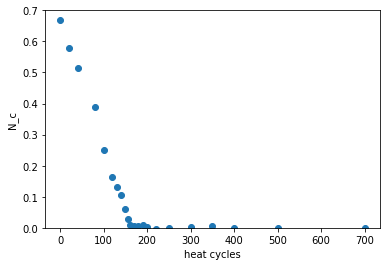

In [175]:
plt.plot(df_results.heatcycles,df_results.cond_frac,'o')
plt.xlabel('heat cycles')
plt.ylabel('N_c')
plt.ylim([0,0.7])
plt.savefig('Aug15figures/RR vs heatcycles.png')
plt.show()

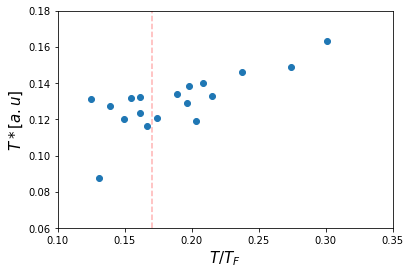

In [172]:

plt.plot(df_results.Temperature,1e-4 *df_results.Tstar,'o')
plt.xlim([0.1,0.35])
plt.ylim([0.06,0.18])
plt.ylabel(r'$T* [a.u]$', fontsize=15)
plt.xlabel(r'$T/T_F$', fontsize=15)
plt.axvline(0.17, linestyle='--', color='r', alpha=0.3, label='T_C')
plt.savefig('Aug15figures/Tstar.png')
plt.show()

## waterfall plot

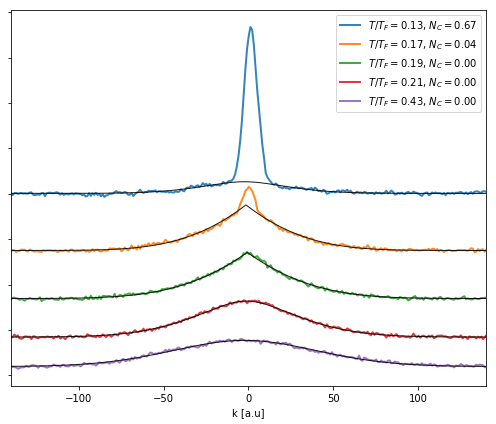

In [159]:
fig, ax = plt.subplots(figsize=(7,6))
selector = [0,9,12,15,20]
for i in range(len(selector)):
    c = df_results.iloc[selector[i]].RR
    c_ = df_results.iloc[selector[i]].RR_fit
    # ax.set(title=r'$N_c=${:.2f}'.format(cond_frac), xlim=[fr[0] - plot_width, fr[0] + plot_width])
    x,y = c.plotdata
    ax.plot(x-161.8,y+2e2*i**2-i*2.7e3,'-', linewidth=2, alpha=0.9, label=r'$T/T_F = ${:.2f}, $N_C = ${:.2f}'.format(df_results.iloc[selector[i]].Temperature, np.abs(df_results.iloc[selector[i]].cond_frac)))
    x,y = c_.xyfitplot
    ax.plot(x-161.8,y+2e2*i**2-i*2.7e3, 'k-', alpha=0.9, linewidth=1)
    
ax.yaxis.set_major_formatter(plt.NullFormatter())
# ax.axvspan(*(np.array(thermal_limits)-161.8), alpha=0.05, color='k', label='Excluded from fit')
plt.xlabel('k [a.u]')
ax.set(xlim=[-140,140])
plt.legend()


plt.savefig('Aug15figures/RR_waterfall.png')
plt.tight_layout()

# Box Tilting

In [18]:
# Experiment parameters
fudge=1.66
trap_f=23.9

In [36]:
# Initialize data frame 
df = pd.DataFrame(columns=['name','imageA','imageB'])

In [37]:
# Get the copied image names only the top images
pasted = pd.read_clipboard(header=None, names=['name'])['name'].tolist()
pasted.reverse()
NameList=[];
for i in range(0,len(pasted)):
    restr=re.search('.*_Top',pasted[i])
    if restr is not None:
        strtemp=restr.group(0);
        if strtemp not in NameList:
            NameList.append(strtemp)
# stop for


# Add it to dataset if not already in there
names = df.name.tolist()
for i, n in enumerate(tqdm(NameList)):
    if n not in names:
        df.loc[df.shape[0]] = NameList[i]
        df.imageA[df.shape[0]-1] = tp.Hybrid_Image(name=(NameList[i]+'A'))
        df.imageB[df.shape[0]-1] = tp.Hybrid_Image(name=(NameList[i]+'B'))
# Print Information
print('Sample : ', pasted[0:2])
print('Number of images copied  : {}'.format(len(NameList)))        
print('Newly added images       : {}'.format(df.shape[0]- len(names)))
print('Total number of images   : {}'.format(df.shape[0]))


Sample :  ['08-15-2017_18_26_37_TopB', '08-15-2017_18_26_37_TopA']
Number of images copied  : 1
Newly added images       : 1
Total number of images   : 1


In [38]:
var = 'Axial Grad Volt'
x_var = 'HeatCycles'
# Get Parameters
try: bec1db.refresh()
except: pass
df['x'] = bec1db.image_query([name+'A' for name in df.name.tolist()], [x_var])[x_var]

df['v'] = bec1db.image_query([name+'A' for name in df.name.tolist()], [var])[var]
df = df[df.v!=0].reset_index()

Updating the local database...
Done


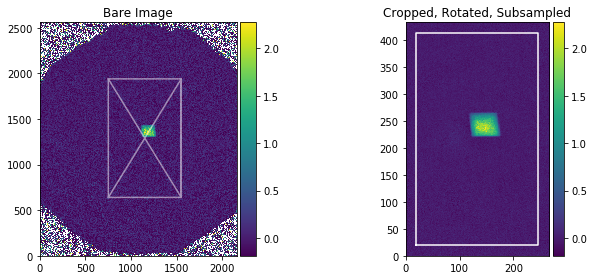

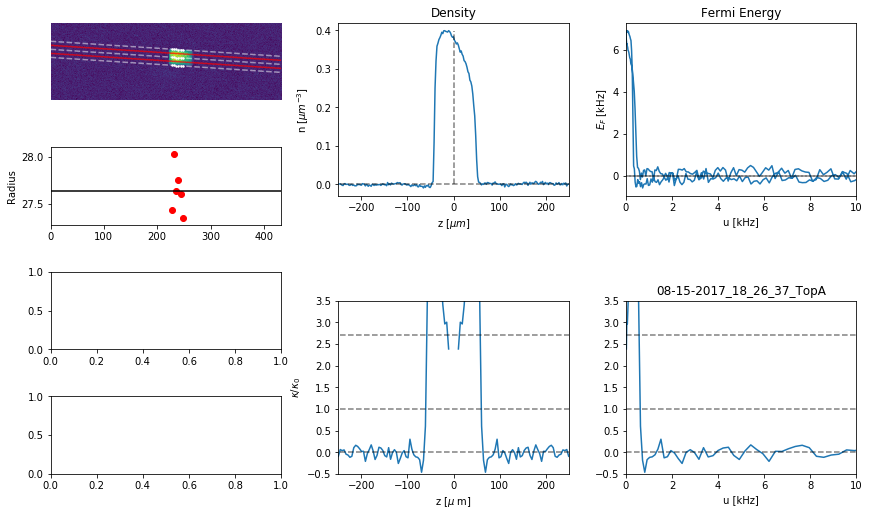

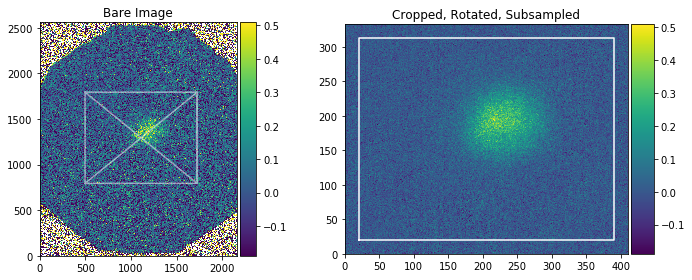

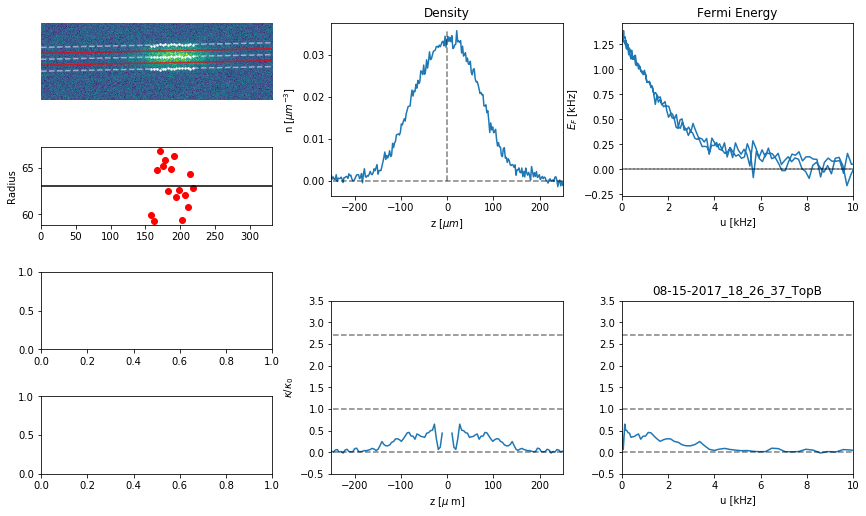

In [39]:
# Settings 
settingsA = dict(center_x = 1152, center_y=1290, width=800, height=1300, 
               subsample=3, rotate=0, rotate_method='bilinear',
               bg_width=20, bg_order=1, bad_light=0, Isat=77, time=10, 
               pixel=0.7e-6, od_method='table', sigmaf=0.5, 
               memory_saver=True, 
               fudge=fudge, ellipticity=1,
               xsec_extension='poly0', xsec_slice_width=4, xsec_fit_range=1,
               trap_f=trap_f, radial_selection=0.5, kind='ideal', Tfit_lim=0.06, Tfit_guess_kT=0.1, Tfit_guess_mu0=3, 
               )

settings_tof = {**settingsA, 
            **dict(center_x = 1112, center_y = 1294, width=1230, height=1000, fudge=fudge)}


for i in tqdm(range(0,len(df.imageA))):
    df.imageA[i].set(**settingsA)
    df.imageB[i].set(**settings_tof)

test=0
df.imageA[test].plot_crop()
df.imageA[test].plot_hybrid_info()
df.imageB[test].plot_crop()
df.imageB[test].plot_hybrid_info()

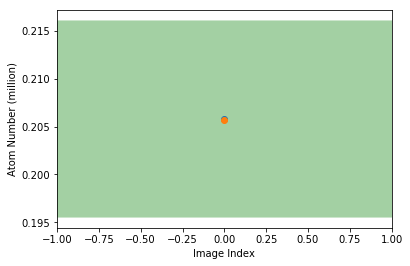

Total data number after post selection: 1


In [40]:
# post select by atom number
# define the atom number tolerence for state A and state B
ToleranceA=0.05
ToleranceB=0.05
NA=np.zeros(len(df.imageA))
NB=np.zeros(len(df.imageB))
for i in range(0,len(NA)):
    NA[i]=np.sum(df.imageA[i].N);
    NB[i]=np.sum(df.imageB[i].N);
    
NA_median=np.median(NA);
NB_median=np.median(NB);
NA_upper_bound=NA_median*(1+ToleranceA)
NA_lower_bound=NA_median*(1-ToleranceA)
NB_upper_bound=NB_median*(1+ToleranceB)
NB_lower_bound=NB_median*(1-ToleranceB)
maskA=(NA<NA_upper_bound) & (NA>NA_lower_bound)
maskB=(NB<NB_upper_bound) & (NB>NB_lower_bound)
mask=maskA & maskB
invmask=(~mask)

index=np.array(range(0,len(NA)));

plt.plot(index,NA/1e6,'o',label='All data A')
plt.plot(index,NB/1e6,'o',label='All data B')
plt.plot(index[invmask],NB[invmask]/1e6,'rx',markersize=15,label='Atom Number filtered B')
plt.plot(index[invmask],NA[invmask]/1e6,'rx',markersize=15,label='Atom Number filtered A')
plt.axhspan(NA_lower_bound/1e6, NA_upper_bound/1e6, facecolor='g', alpha=0.2)
plt.axhspan(NB_lower_bound/1e6, NB_upper_bound/1e6, facecolor='g', alpha=0.2)
plt.xlim([-1,len(NA)])
plt.xlabel('Image Index');plt.ylabel('Atom Number (million)')
plt.show()
dfps=df.copy()
dfps=df.drop(dfps[invmask].index)
dfps=dfps.reset_index(drop=True)
print('''Total data number after post selection: {:.0f}'''.format(len(dfps)))

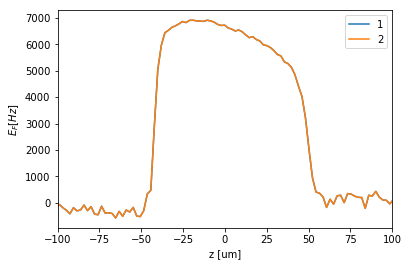

In [41]:
test0=0
test1=0
test2=0

z1=dfps.imageA[test0].z*1e6
n1=dfps.imageA[test0].n/1e18
EF1=zs.thermodynamics.n2EF(n1)

z2=dfps.imageA[test1].z*1e6
n2=dfps.imageA[test1].n/1e18
EF2=zs.thermodynamics.n2EF(n2)


z3=dfps.imageA[test2].z*1e6
n3=dfps.imageA[test2].n/1e18
EF3=zs.thermodynamics.n2EF(n3)

line1,=plt.plot(z1,EF1,label='1')
line2,=plt.plot(z2,EF2,label='2')
# line3,=plt.plot(z3,EF3,label='3')
plt.xlim([-100,100])
plt.xlabel('z [um]')
plt.ylabel(r'$E_F [Hz]$')
legend1 = plt.legend(handles=[line1,line2], loc=1)

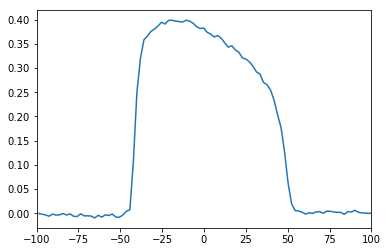

Tilting under Aixal Gradien
The Fermi energy slope: nan +/- nan


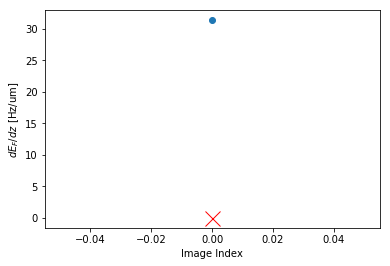

In [42]:
# dfps.sort_values(by='x', inplace=True)

zfitrange=15

plt.figure()

KappaPrime=np.zeros(len(dfps))
for i in range(0,len(dfps)):
    ztemp=dfps.imageA[i].z*1e6
    ntemp=dfps.imageA[i].n/1e18
    EFtemp=zs.thermodynamics.n2EF(ntemp)
#     mask_fit=np.abs(ztemp)<zfitrange
    mask_fit=(ztemp<30) & (ztemp>0)
    zfit=ztemp[mask_fit]
    EFfit=EFtemp[mask_fit]
    P=np.polyfit(zfit,EFfit,1)
    KappaPrime[i]=-P[0];
    plt.plot(ztemp,ntemp)

plt.xlim([-100,100])
plt.show()

KappaPrime_mean=np.median(KappaPrime)
KappaPrime_std=np.std(KappaPrime)
Kappa_upper=KappaPrime_mean+KappaPrime_std*4
Kappa_lower=KappaPrime_mean-KappaPrime_std*4
mask=(KappaPrime<Kappa_upper) & (KappaPrime> Kappa_lower)
invmask=~mask

plt.figure()

index=np.array(range(0,len(dfps)));
plt.plot(index,KappaPrime,'o')
plt.xlabel('Image Index')
plt.ylabel(r'$dE_F/dz$ [Hz/um]')
plt.axhspan(Kappa_upper, Kappa_lower, facecolor='g', alpha=0.2)
plt.plot(index[invmask],KappaPrime[invmask]/1e6,'rx',markersize=15,label='Atom Number filtered B')
# plt.ylim([0,39])
# plt.ylim([0,np.max(KappaPrime)*1.2])

KappaPrime_meansel=np.mean(KappaPrime[mask])
KappaPrime_stdsel=np.std(KappaPrime[mask])/np.sqrt(len(KappaPrime[mask]))

print('''Tilting under Aixal Gradien
The Fermi energy slope: {:.1f} +/- {:.1f}'''.format(KappaPrime_meansel,KappaPrime_stdsel))





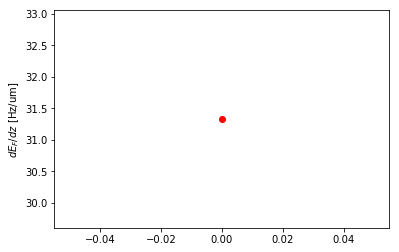

In [43]:
plt.plot(dfps.x,KappaPrime,'ro',label='Atom Number filtered B')

plt.ylabel(r'$dE_F/dz$ [Hz/um]')

plt.show()

In [44]:
# Get the averaged density profile
nzA=[];nzB=[];
zA=[];zB=[];
for i in range(0,len(dfps.imageA)):
    nzA=np.concatenate((nzA,dfps.imageA[i].n/1e18))
    nzB=np.concatenate((nzB,dfps.imageB[i].n/1e18))
    zAtemp=dfps.imageA[0].z*1e6
    zA=np.concatenate((zA,zAtemp))
    zBtemp=dfps.imageB[0].z*1e6
    zB=np.concatenate((zB,zBtemp))

VA=zs.thermodynamics.z2V(zA,trap_f);
VB=zs.thermodynamics.z2V(zB,trap_f);

# Bin the Profile
zBinGrid=np.linspace(-300,300,200);
VBinGrid=np.linspace(0,15e3,150);
BinzA=zs.numerical.BinGrid(zA,nzA,zBinGrid,0)
BinzB=zs.numerical.BinGrid(zB,nzB,zBinGrid,0)
BinVA=zs.numerical.BinGrid(VA,nzA,VBinGrid,0)
BinVB=zs.numerical.BinGrid(VB,nzB,VBinGrid,0)

zS1Binz=BinzA['xmean'];nS1Binz=BinzA['ymean'];zS1errBinz=BinzA['xstd'];nS1errBinz=BinzA['ystdm']
zS2Binz=BinzB['xmean'];nS2Binz=BinzB['ymean'];zS2errBinz=BinzB['xstd'];nS2errBinz=BinzB['ystdm']
EFS1Binz=zs.thermodynamics.n2EF(nS1Binz);
EFS2Binz=zs.thermodynamics.n2EF(nS2Binz);
EFS1errBinz=np.abs((nS1errBinz/nS1Binz)*EFS1Binz)*2/3



VS1BinV=BinVA['xmean'];nS1BinV=BinVA['ymean'];VS1errBinV=BinVA['xstd'];nS1errBinV=BinVA['ystdm']
VS2BinV=BinVB['xmean'];nS2BinV=BinVB['ymean'];VS2errBinV=BinVB['xstd'];nS2errBinV=BinVB['ystdm']
EFS1BinV=zs.thermodynamics.n2EF(nS1BinV);
EFS2BinV=zs.thermodynamics.n2EF(nS2BinV);
EFS1errBinV=np.abs((nS1errBinV/nS1BinV)*EFS1BinV)*2/3
masknan=~np.isnan(VS1BinV)
VS1BinV=VS1BinV[masknan];
nS1BinV=nS1BinV[masknan];
VS1errBinV=VS1errBinV[masknan];
nS1errBinV=nS1errBinV[masknan]
EFS1BinV=EFS1BinV[masknan];
EFS1errBinV=EFS1errBinV[masknan]

# Use the thomas fermi profile to get the edge of the minority cloud
P=zs.thermodynamics.TFfit(zS2Binz,nS2Binz,100)
RTFS2=P[0][2];VTFS2=zs.thermodynamics.z2V(RTFS2,trap_f);


# plot the binned profile
fig,ax=plt.subplots(ncols=2,nrows=3, figsize=[24,16])
plt.subplot(3,2,1)
plt.plot(zA,nzA,'.')
plt.plot(zB,nzB,'.')
plt.axvline(RTFS2,linewidth=2, color='k',linestyle='--')
plt.axvline(-RTFS2,linewidth=2, color='k',linestyle='--')
plt.xlabel('z [um]');plt.ylabel('n [um^{-3}]')
plt.title('Unbinned n vs z')
plt.xlim([-300,300])
plt.subplot(3,2,2)
plt.plot(VA,nzA,'.')
plt.plot(VB,nzB,'.')
plt.xlim([0,1e4])
plt.xlabel('U [um]');plt.ylabel('n [um^{-3}]')
plt.title('Unbinned n vs U')
plt.subplot(3,2,3)
plt.plot(BinzA['xmean'],BinzA['ymean'],'.-')
plt.plot(BinzB['xmean'],BinzB['ymean'],'.')
plt.axvline(RTFS2,linewidth=2, color='k',linestyle='--')
plt.axvline(-RTFS2,linewidth=2, color='k',linestyle='--')
plt.xlabel('z [um]');plt.ylabel('n [um^{-3}]')
plt.title('Binned n vs z')
plt.xlim([-300,300])
plt.subplot(3,2,4)
plt.plot(VS1BinV,nS1BinV,'.')
plt.plot(VS2BinV,nS2BinV,'.')
plt.xlim([0,1e4])
plt.xlabel('z [um]');plt.ylabel('U [um^{-3}]')
plt.title('Binned n vs U')
plt.subplot(3,2,5)
plt.plot(zS1Binz,EFS1Binz,'.-')
plt.plot(zS2Binz,EFS2Binz,'.-')
plt.axvline(RTFS2,linewidth=2, color='k',linestyle='--')
plt.axvline(-RTFS2,linewidth=2, color='k',linestyle='--')
plt.xlabel('z [um]');plt.ylabel('EF [Hz]')
plt.title('Binned E_F vs z')
plt.xlim([-300,300])
plt.subplot(3,2,6)
plt.plot(VS1BinV,EFS1BinV,'.')
plt.plot(VS2BinV,EFS2BinV,'.')
plt.xlabel('z [um]');plt.ylabel('EF [Hz]')
plt.title('Binned n vs U')
plt.xlim([0,1e4])
plt.show()

ValueError: array must not contain infs or NaNs

In [123]:
np.max(EFS1Binz)

7494.0748775806678

In [ ]:
np.max(EFS2Binz)